In [1]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker

#plt.xkcd()

import pandas as pd
import time

idx = pd.IndexSlice
import datetime

,Fecha,Vacunas
0,2021-01-07,NaN
1,2021-01-08,0.000
2,2021-01-09,1.242
3,2021-01-10,0.000
4,2021-01-11,0.992
...,...,...
260,2021-09-24,3.252
261,2021-09-25,0.091
262,2021-09-26,0.000
263,2021-09-27,2.347


Fecha
2021-01-28    0.000
2021-01-29    0.000
2021-01-30    1.242
2021-01-31    0.000
2021-02-01    0.992
              ...  
2021-10-15    3.252
2021-10-16    0.091
2021-10-17    0.000
2021-10-18    2.347
2021-10-19    0.000
Name: Vacunas, Length: 265, dtype: float64

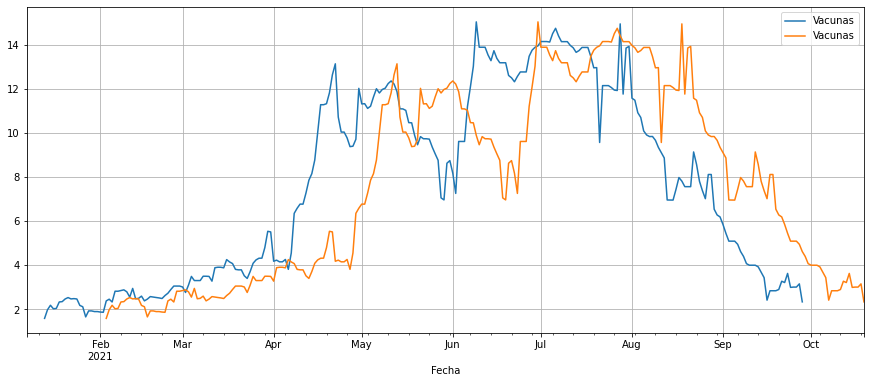

In [2]:
vacunas = pd.read_csv('Vacunas.csv',index_col='Fecha',parse_dates=True).diff()/1000.
vacunas.reset_index(inplace=True)
display(vacunas)
vacunasD = vacunas.copy()
vacunas.Fecha = vacunas.Fecha+ pd.Timedelta(21,unit='D')#21


vacunasD.set_index('Fecha',inplace=True)
vacunas.set_index('Fecha',inplace=True)
vacunasD.fillna(0,inplace=True)
vacunas.fillna(0,inplace=True)


fig, ax = plt.subplots(figsize=(15,6))
vacunasD.rolling(7,center=False).mean().plot(ax=ax)
vacunas.rolling(7,center=False).mean().plot(ax=ax)
plt.grid()
vacunas.Vacunas

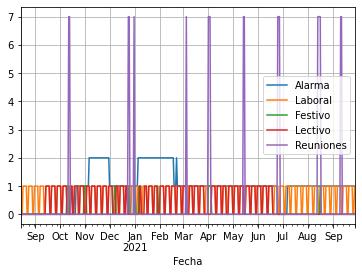

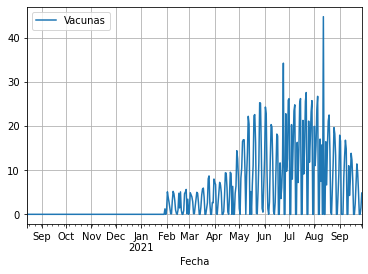

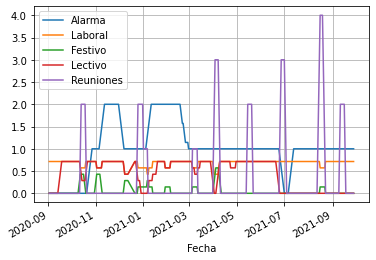

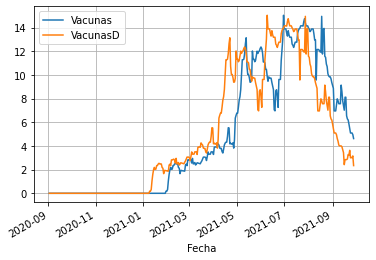

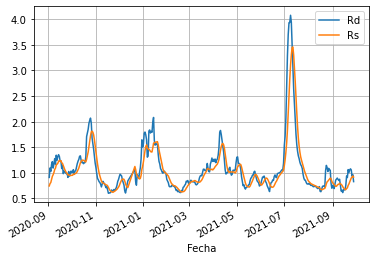

In [3]:
dateparse = lambda x: datetime.datetime.strptime(x, '%d/%m/%y')

edades = np.array([1319290,184542,123870,141711,200576,206170,176822,135180,150419])
puntos = pd.read_csv('Omega.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
puntos.sort_index(inplace=True)
puntos.columns
puntos['Asintomáticos (%)'] = puntos['Asintomáticos'].copy()
puntos['Asintomáticos'] = puntos['Asintomáticos (%)']*puntos['Casos']/100
puntos['Zaragoza (%)'] = puntos['Zaragoza']/puntos['Casos']*100
puntos['UCI/Camas (%)'] = puntos['UCI ocupadas']/puntos['Camas Ocup']*100
puntos['Camas/UCI'] = puntos['Camas Ocup']/puntos['UCI ocupadas']
puntos['Casos/Camas'] = puntos['Casos']/puntos['Camas Ocup']
puntos['Camas/Casos'] = puntos['Camas Ocup']/puntos['Casos']
puntos['Camas (%)'] = puntos['Camas Ocup']/(puntos['Camas libres'])*100.
puntos['UCI (%)'] = puntos['UCI ocupadas']/(puntos['UCI libres con resp'])*100.
puntos['Día'] = np.sin((puntos['Día de la semana']-.5)*2*np.pi /7)#.plot()
puntos['Rs'] = puntos.Casos.rolling(7,center=False).sum()/puntos.Casos.shift(7).rolling(7,center=False).sum()
puntos['Rd'] = puntos.Casos/puntos.Casos.shift(7)
puntos['Bias'] = 1
puntos['Festivo'] = 0
puntos['Lectivo'] = 1
puntos.loc['2021/6/21':,'Lectivo'] = 0

#goto
#puntos.loc['2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
#puntos.loc['2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']
puntos.loc['2020/10/10':'2020/10/12','Festivo'] = 1 #+ puntos.loc['2020/10/10':'2020/10/14','Festivo']
puntos.loc['2020/10/31':'2020/11/2','Festivo'] = 1 #+ puntos.loc['2020/10/31':'2020/11/2','Festivo']

puntos.loc['2020/12/7':'2020/12/8',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2020/12/25',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
puntos.loc['2021/1/1',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/6',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/1/29',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/3/5',
           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
puntos.loc['2021/4/1':'2021/4/4',
           'Festivo'] = 1
puntos.loc['2021-04-23':'2021-04-24','Festivo'] = 0
puntos.loc['2021-08-16','Festivo'] = 1

puntos['Laboral'] = 1 - puntos.Festivo/1
puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0


#puntos.loc['2020/10/10':'2020/10/14','Laboral'] = 0
#puntos.loc['2020/10/31':'2020/11/2','Laboral'] = 0


puntos.loc['2020/10/10':'2020/10/14','Lectivo'] = 0
puntos.loc['2020/10/31':'2020/11/2','Lectivo'] = 0
puntos.loc[:'2020/9/13','Lectivo'] = 0
puntos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
puntos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
puntos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
puntos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
puntos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
puntos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0
puntos.loc['2021/1/29':'2021/1/30','Lectivo'] = 0
puntos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
puntos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
puntos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
puntos.loc['2021/6/21':,'Lectivo'] = 0

puntos.loc[puntos[puntos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

puntos['NoLaboral'] = 1 - puntos.Laboral
puntos['NoLectivo'] = 1 - puntos.Lectivo

puntos['Reuniones'] = 0
puntos.loc['2020/10/12':'2020/10/13','Reuniones'] = 7
#puntos.loc['2020/10/12','Reuniones'] = 1
puntos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
#puntos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
puntos.loc['2020/12/31','Reuniones'] = 7
puntos.loc['2021/3/5','Reuniones'] = 7
puntos.loc['2021-04-01':'2021-04-03',
           'Reuniones'] = 7
puntos.loc['2021-05-14':'2021-05-15',
           'Reuniones'] = 7
puntos.loc['2021-06-25':'2021-06-27',
           'Reuniones'] = 7
#puntos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#puntos.loc['2021/7/9':'2021/7/11','Reuniones'] = 7
#puntos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#puntos.loc['2021/7/23':'2021/7/25','Reuniones'] = 7
#puntos.loc['2021/7/30':'2021/8/1','Reuniones'] = 7
#puntos.loc['2021/8/6':'2021/8/8','Reuniones'] = 7
puntos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
#puntos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7
#puntos.loc['2021/8/27':'2021/8/28','Reuniones'] = 7
#puntos.loc['2021/9/3':'2021/9/4','Reuniones'] = 7
puntos.loc['2021/9/10':'2021/9/11','Reuniones'] = 7
#puntos.loc['2021/9/17':'2021/9/18','Reuniones'] = 7

puntos.loc[:,'VacunasD'] = 0.
for i in puntos.index:
    if i in vacunasD.index:
        puntos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
puntos.loc[:,'Vacunas'] = 0.
for i in puntos.index:
    if i in vacunas.index:
        puntos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
puntos.loc[:,'Inoculados'] = (edades[0]-1000*puntos.Vacunas.cumsum()/2.45)*100./edades[0]# + puntos.Casos.cumsum()
puntos.loc[:,'Total Casos'] = (edades[0]-puntos.Casos.cumsum()-21313)*100./edades[0] # +21.313

puntos = pd.concat([puntos,(edades[1:]*.983-puntos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos '))/edades[1:]*100.],#/edades*100.],
         axis=1)
#puntos = pd.concat([puntos,puntos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')/edades[1:]*100.],#/edades*100.],
#         axis=1)

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas'
      ]].plot()

plt.grid()
plt.show()


semanal = puntos.rolling(7,center=False).mean().copy()
diario = puntos.copy()
puntos = puntos.rolling(7,center=False).mean().copy().dropna()

puntos[['Alarma',
       'Laboral',
       'Festivo',
       'Lectivo',
       'Reuniones'
      ]].plot()

plt.grid()
plt.show()
puntos[['Vacunas',
        'VacunasD',
      ]].plot()

plt.grid()
plt.show()


puntos[['Rd','Rs'
      ]].plot()

plt.grid()
plt.show()
#puntos['Día'] = diario['Día']
#puntos['Alarma'] = diario.Alarma
#puntos['Festivo'] = diario['Festivo']
#puntos['Laboral'] = diario['Laboral']
#puntos['Reuniones'] = diario['Reuniones']
#puntos['Bias'] = diario['Bias']

In [4]:
diario.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-24,5,85,2581,1755.0,3.29,41.65,59,13,4,17,...,41.234811,87.778805,88.985589,81.262784,86.171795,89.094512,88.635645,89.229296,91.197618,88.980034
2021-09-25,6,52,1322,911.0,3.93,26.00,45,12,4,4,...,41.234811,87.774864,88.979087,81.259554,86.168973,89.091520,88.632250,89.228165,91.195399,88.971391
2021-09-26,7,41,1149,668.0,3.57,22.14,29,11,2,3,...,41.234718,87.771756,88.973126,81.257940,86.166856,89.090025,88.629825,89.224772,91.192440,88.967402
2021-09-27,1,84,2484,1881.0,3.38,52.92,51,14,5,10,...,41.189920,87.765389,88.965540,81.253903,86.159799,89.086535,88.622549,89.222510,91.190220,88.950782
2021-09-28,2,80,2795,1889.0,2.86,46.40,62,14,7,10,...,41.040860,87.759325,88.957953,81.248252,86.152743,89.080053,88.616729,89.216854,91.186522,88.945464


In [5]:
nuevos = pd.read_csv('Omega_new.csv',
                sep=';',
                index_col='Fecha',
                parse_dates=True,
                #infer_datetime_format=True,
                date_parser=dateparse,
                decimal=',',
               )
nuevos.sort_index(inplace=True)
nuevos.columns
#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
nuevos['Asintomáticos (%)'] = nuevos['Asintomáticos'].copy()
nuevos['Asintomáticos'] = nuevos['Asintomáticos (%)']*nuevos['Casos']/100
nuevos['Zaragoza (%)'] = nuevos['Zaragoza']/nuevos['Casos']*100
nuevos['UCI/Camas (%)'] = nuevos['UCI ocupadas']/nuevos['Camas Ocup']*100
nuevos['Camas/UCI'] = nuevos['Camas Ocup']/nuevos['UCI ocupadas']
nuevos['Casos/Camas'] = nuevos['Casos']/nuevos['Camas Ocup']
nuevos['Camas/Casos'] = nuevos['Camas Ocup']/nuevos['Casos']
nuevos['Camas (%)'] = nuevos['Camas Ocup']/(nuevos['Camas libres'])*100.
nuevos['UCI (%)'] = nuevos['UCI ocupadas']/(nuevos['UCI libres con resp'])*100.
nuevos['Día'] = np.sin((nuevos['Día de la semana']-.5)*2*np.pi /7)#.plot()
nuevos['Bias'] = 1
nuevos['Rs'] = nuevos.Casos.rolling(7,center=False).sum()/nuevos.Casos.shift(7).rolling(7,center=False).sum()
nuevos['Rd'] = nuevos.Casos/nuevos.Casos.shift(7)
nuevos['Festivo'] = 0
nuevos['Lectivo'] = 1

#nuevos.loc['2021/6/21':,'Lectivo'] = 0

#nuevos.loc['2020/12/7':'2020/12/8',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2020/12/25',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/5':'2020/12/8','Festivo']
#nuevos.loc['2021/1/1',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/1/6',
#           'Festivo'] = 1 #+ nuevos.loc['2020/12/24':'2021/1/3','Festivo']
#nuevos.loc['2021/3/5',
#           'Festivo'] = 1
#nuevos.loc['2021/4/1':'2021/4/4',
#           'Festivo'] = 1
#nuevos.loc['2021-04-23','Festivo'] = 0
#nuevos.loc['2021-08-16','Festivo'] = 1
nuevos['Laboral'] = 1# - nuevos.Festivo/1
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Laboral'] = 0

#nuevos.loc['2020/12/7':'2020/12/8','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2020/12/25','Lectivo'] = 0
#nuevos.loc['2020/12/28':'2021/1/1','Lectivo'] = 0
#nuevos.loc['2021/1/4':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2020/12/23':'2021/1/6','Lectivo'] = 0
#nuevos.loc['2021/1/11':'2021/1/12','Lectivo'] = 0

#nuevos.loc['2021/3/5':'2021/3/8','Lectivo'] = 0
#nuevos.loc['2021/3/29':'2021/4/4','Lectivo'] = 0
#nuevos.loc['2021-04-23':'2021/4/24','Lectivo'] = 0
nuevos.loc[nuevos[nuevos['Día de la semana'].isin([6,7])].index,
           'Lectivo'] = 0

#nuevos.loc[:'2020/9/13','Lectivo'] = 0

nuevos['NoLaboral'] = 1 - nuevos.Laboral
nuevos['NoLectivo'] = 1 - nuevos.Lectivo



nuevos['Reuniones'] = 0 
#nuevos.loc['2020/12/24':'2020/12/25','Reuniones'] = 7
##nuevos.loc['2020/12/25':'2020/12/26','Reuniones'] = 1
#nuevos.loc['2020/12/31','Reuniones'] = 7
##nuevos.loc['2020/12/24','Reuniones'] = 1
##nuevos.loc['2020/12/25','Reuniones'] = 1
##nuevos.loc['2020/12/31','Reuniones'] = 1
#nuevos.loc['2021/4/1':'2021/4/3','Reuniones'] = 7
#nuevos.loc['2021/7/2':'2021/7/4','Reuniones'] = 7
#nuevos.loc['2021/7/16':'2021/7/18','Reuniones'] = 7
#nuevos.loc['2021/8/13':'2021/8/16','Reuniones'] = 7
## esperemos que rterminen no fiestas por un tiempo 
#nuevos.loc['2021/8/20':'2021/8/21','Reuniones'] = 7



nuevos.loc[:,'VacunasD'] = np.nan
for i in nuevos.index:
    if i in vacunasD.index:
        nuevos.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
nuevos.loc[:,'Vacunas'] = np.nan
for i in nuevos.index:
    if i in vacunas.index:
        nuevos.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
nuevos.loc[:,'Inoculados'] = diario.Inoculados.iat[-1] - 1000.*nuevos.Vacunas.cumsum()/2.45*100/edades[0]
nuevos.loc[:,'Total Casos'] = diario['Total Casos'].iat[-1]-nuevos.Casos.cumsum()*100./edades[0]

nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]-nuevos[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'
                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
         axis=1)
#nuevos = pd.concat([nuevos, diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']].iloc[-1]+nuevos[['1 a 14 años',
#       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#       '55 a 64 años', '65 a 74 años', '75 años o más'
#                                  ]].cumsum().add_prefix('Total Casos ')/edades[1:]*100. ],#/edades*100.],
#         axis=1)


nuevos.tail(10).T


Fecha,2021-09-29,2021-09-30,2021-10-01
Día de la semana,3.000000,4.000000e+00,5.000000
Casos,100.000000,1.010000e+02,NaN
test coresp,2578.000000,2.263000e+03,NaN
Nº de pacientes a los que se ha realizado pruebas,1831.000000,1.687000e+03,NaN
Tasa de positividad (%),3.880000,4.460000e+00,NaN
Asintomáticos,71.000000,5.656000e+01,NaN
Zaragoza,76.000000,8.700000e+01,NaN
1 a 14 años,22.000000,2.100000e+01,NaN
15 a 24 años,5.000000,5.000000e+00,NaN
25 a 34 años,10.000000,1.100000e+01,NaN


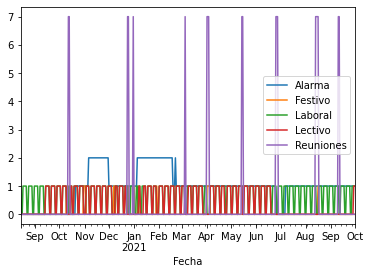

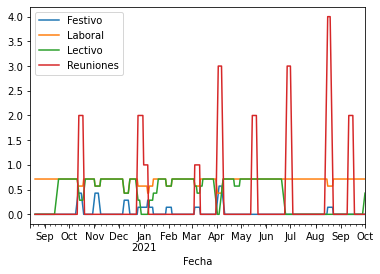

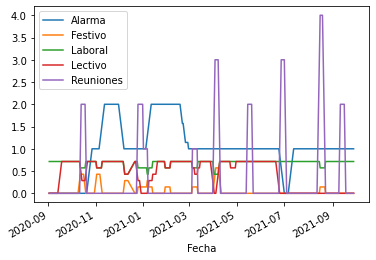

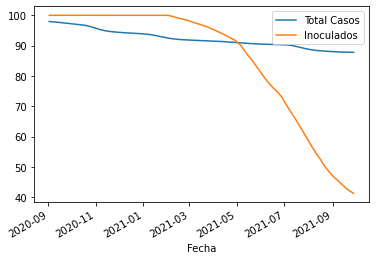

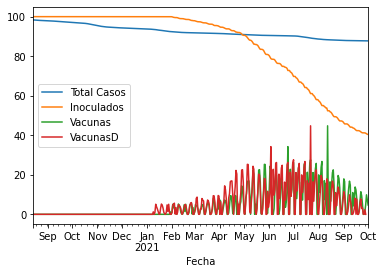

In [6]:
total = pd.concat([diario,nuevos])
total[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
total[[
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].rolling(7,center=False).mean().plot()
plt.show()
puntos[['Alarma',
       'Festivo',
       'Laboral',
       'Lectivo',
       'Reuniones'
      ]].plot()
plt.show()
puntos[['Total Casos',
       'Inoculados',
      ]].plot()
plt.show()
total[['Total Casos',
       'Inoculados',
       'Vacunas',
       'VacunasD',
      ]].plot()
plt.show()

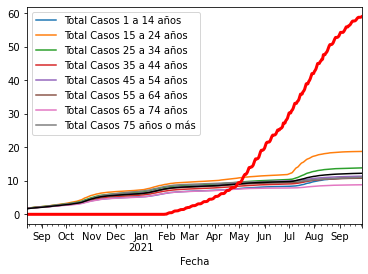

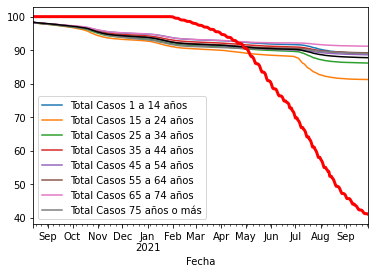

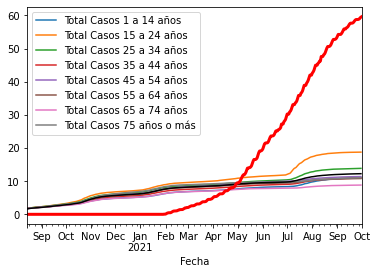

,Total Casos,Inoculados
Fecha,,
2020-08-14,98.337212,100.000000
2020-08-15,98.300677,100.000000
2020-08-16,98.271116,100.000000
2020-08-17,98.241099,100.000000
2020-08-18,98.205702,100.000000
...,...,...
2021-09-27,87.765389,41.189920
2021-09-28,87.759325,41.040860
2021-09-29,87.751745,40.735594


,Total Casos,Inoculados
Fecha,,
2021-09-29,87.751745,40.735594
2021-09-30,87.744090,40.513272
2021-10-01,NaN,40.368111


In [7]:
(100.-diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100.-diario['Total Casos']).plot(color='k')
(100.-diario['Inoculados']).plot(color='r',lw=3)
plt.show()
(diario[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(diario['Total Casos']).plot(color='k')
(diario['Inoculados']).plot(color='r',lw=3)
plt.show()

(100-total[['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']]).plot()
(100-total['Total Casos']).plot(color='k')
(100-total['Inoculados']).plot(color='r',lw=3)
plt.show()
display(total[['Total Casos','Inoculados']])
display(nuevos[['Total Casos','Inoculados']])

In [8]:

total = pd.concat([diario,nuevos])
nuevos['Rs'] = (total.Casos.rolling(7,center=False).sum()/total.Casos.shift(7).rolling(7,center=False).sum()).loc[nuevos.index]
nuevos['Rd'] = (total.Casos/total.Casos.shift(7)).loc[nuevos.index]

nuevos


,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-29,3,100.0,2578.0,1831.0,3.88,71.00,76.0,22.0,5.0,10.0,...,40.735594,87.751745,88.946032,81.244216,86.145686,89.069085,88.610423,89.211199,91.177645,88.942140
2021-09-30,4,101.0,2263.0,1687.0,4.46,56.56,87.0,21.0,5.0,11.0,...,40.513272,87.744090,88.934652,81.240179,86.137924,89.055125,88.602178,89.206675,91.174686,88.938151
2021-10-01,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,40.368111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
display(total.columns)
edades = [1319290,184542,123870,141711,200576,206170,176822,135180,150419]
pd.concat([total,total[['1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].cumsum().add_prefix('Total Casos ')],#/edades*100.],
         axis=1)

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 65 a 74 años,Total Casos 75 años o más,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,5,624.0,4177.0,3481.0,14.94,318.24,541.0,96.0,78.0,85.0,...,98.264492,98.264765,96.0,78.0,85.0,84.0,85.0,87.0,48.0,53.0
2020-08-15,6,482.0,3243.0,1907.0,14.86,216.90,428.0,67.0,51.0,64.0,...,98.240080,98.227536,163.0,129.0,149.0,167.0,152.0,144.0,81.0,109.0
2020-08-16,7,390.0,3158.0,1168.0,12.35,230.10,338.0,53.0,54.0,38.0,...,98.209750,98.208256,216.0,183.0,187.0,237.0,203.0,196.0,122.0,138.0
2020-08-17,1,396.0,3408.0,3189.0,11.62,233.64,307.0,51.0,41.0,40.0,...,98.182379,98.177010,267.0,224.0,227.0,299.0,264.0,250.0,159.0,185.0
2020-08-18,2,467.0,4029.0,3580.0,11.59,270.86,394.0,49.0,50.0,72.0,...,98.153529,98.150418,316.0,274.0,299.0,371.0,340.0,315.0,198.0,225.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-27,1,84.0,2484.0,1881.0,3.38,52.92,51.0,14.0,5.0,10.0,...,91.190220,88.950782,17226.0,21115.0,17204.0,18480.0,19952.0,16051.0,9611.0,14063.0
2021-09-28,2,80.0,2795.0,1889.0,2.86,46.40,62.0,14.0,7.0,10.0,...,91.186522,88.945464,17240.0,21122.0,17214.0,18493.0,19964.0,16061.0,9616.0,14071.0
2021-09-29,3,100.0,2578.0,1831.0,3.88,71.00,76.0,22.0,5.0,10.0,...,91.177645,88.942140,17262.0,21127.0,17224.0,18515.0,19977.0,16071.0,9628.0,14076.0


In [10]:
variables = [
    'Casos', 
    'test coresp', 'Tasa de positividad (%)',
    #'Nº de pacientes a los que se ha realizado pruebas',
    'Asintomáticos', 'Asintomáticos (%)',
    'Zaragoza','Zaragoza (%)',
    '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 
    'Camas Ocup', 'Camas libres', 'Camas (%)',
    'UCI ocupadas', 'UCI libres con resp','UCI (%)',
    'Rs',
    'Rd',
    #'UCI/Camas (%)',
    #'Camas/UCI',
    #'Casos/Camas',
    #'Camas/Casos',
    #'Alarma',
    #'Día', 
    #'Bias',
    'Inoculados',
    'Total Casos',
    'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'
]
entradas = ['Alarma','Laboral','Lectivo','Reuniones','Festivo','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias']
entradas = ['Alarma','Festivo','NoLaboral','Laboral','NoLectivo','Lectivo','Reuniones','Bias',
            'Vacunas',#'VacunasD'
            #'Inoculados'
           ]



In [11]:
def find_weekend_indices(datetime_array):
    indices=[]
    for i in range(len(datetime_array)):
        #if datetime_array[i].day_name() in ['Saturday', 'Sunday']:
        if datetime_array[i].weekday()+1 in [6,7]:
            indices.append(i)
    return indices

weekend_indices = find_weekend_indices(puntos.index)

def highlight_datetimes(index, ax,items=True):
    indices = find_weekend_indices(index)
    i = 0
    while i < len(indices):
        ax.axvspan(index[indices[i]], index[indices[i] + 1], facecolor='gray', edgecolor='none', alpha=.05)
        i += 1
    if items:
        ax.axvline(x=datetime.datetime(2020, 3, 8),ls='--',linewidth=4, color='purple',alpha=.4,label='Manifestación y Vox')
        ax.axvline(x=datetime.datetime(2020, 3, 9),linewidth=4, color='green',alpha=.4,label='PV y MD Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 12),linewidth=4, color='yellow',alpha=.4,label='AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 3, 15),linewidth=4, color='r',alpha=.4,label='Estado de alarma')
        ax.axvline(x=datetime.datetime(2020, 3, 28),linewidth=4, color='brown',alpha=.4,label='Servicios no esenciales')
        ax.axvline(x=datetime.datetime(2020, 4, 26),ls='--',linewidth=4, color='orange',alpha=.4,label='Niños a la calle')
        ax.axvline(x=datetime.datetime(2020, 5, 4),ls='--',linewidth=4, color='lightblue',alpha=.4,label='Fase 0')
        ax.axvline(x=datetime.datetime(2020, 5, 11),ls='--',linewidth=4, color='blue',alpha=.4,label='Fase 1')
        ax.axvline(x=datetime.datetime(2020, 5, 25),ls='--',linewidth=4, color='darkblue',alpha=.4,label='Fase 2')
        ax.axvline(x=datetime.datetime(2020, 6, 8),ls='--',linewidth=4, color='lightgreen',alpha=.4,label='Fase 3')
        ax.axvline(x=datetime.datetime(2020, 6, 21),ls='--',linewidth=4, color='black',alpha=.4,label='Nueva Normalidad')
        ax.axvline(x=datetime.datetime(2020, 9, 14),linewidth=4, color='yellow',alpha=.4,label='Apertura AR Educativo')
        ax.axvline(x=datetime.datetime(2020, 10, 25),linewidth=4, color='darkred',alpha=.4,label='Nivel III')
        ax.axvline(x=datetime.datetime(2020, 11, 8),linewidth=4, color='brown',alpha=.4,label='nivel III Agravado')



In [12]:
repartoDiaSemana = diario[['Día de la semana']].join(diario[variables].divide(
                                                                    diario[variables].rolling(7,center=True).mean())
                                                    ).dropna().groupby(['Día de la semana']).mean()

#diario['Camas Ocup'] = diario['Camas Ocup'].diff()
#diario['UCI ocupadas'] = diario['UCI ocupadas'].diff()
#semanal['Camas Ocup'] = semanal['Camas Ocup'].diff()
#semanal['UCI ocupadas'] = semanal['UCI ocupadas'].diff()
repartoDiaSemana.loc[:,'Total Casos'] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()
repartoDiaSemana.loc[:,'Inoculados'] = 1
repartoDiaSemana.loc[:,['Rs','Rd']] = 1
#repartoDiaSemana.loc[:,['Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
#       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
#       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
#       'Total Casos 65 a 74 años', 'Total Casos 75 años o más']] = 1#repartoDiaSemana['Total Casos']/repartoDiaSemana['Total Casos'].mean()


display(repartoDiaSemana)
repartoDiaSemana.mean()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Día de la semana,,,,,,,,,,,,,,,,,,,,,
1,0.844535,0.929110,0.917618,0.821613,0.963622,0.771686,0.917576,0.725910,0.785145,0.835688,...,1,1,1.000108,1.000198,1.000118,1.000091,1.000089,1.000083,1.000050,1.000061
2,1.202598,1.209490,0.990762,1.171088,0.971866,1.208585,1.001260,1.267209,1.175261,1.206806,...,1,1,1.000059,1.000124,1.000059,1.000038,1.000044,1.000034,1.000033,1.000040
3,1.185210,1.214577,0.979982,1.171705,0.988832,1.208030,1.020348,1.202817,1.241327,1.180891,...,1,1,1.000008,1.000013,1.000004,0.999990,0.999994,0.999989,1.000008,1.000020
4,1.204498,1.129111,1.072273,1.227323,1.021376,1.212096,1.012267,1.213362,1.257507,1.212702,...,1,1,0.999956,0.999897,0.999939,0.999957,0.999952,0.999958,0.999972,0.999965
5,1.133176,1.119561,1.021228,1.082503,0.955305,1.138541,1.012895,1.171232,1.169484,1.167096,...,1,1,0.999903,0.999798,0.999883,0.999915,0.999914,0.999925,0.999944,0.999937
6,0.847707,0.818851,1.045363,0.932599,1.093876,0.890706,1.050058,0.924610,0.819739,0.834578,...,1,1,0.999923,0.999871,0.999927,0.999953,0.999948,0.999957,0.999961,0.999952
7,0.551381,0.564980,0.963226,0.556355,0.999045,0.543413,0.988105,0.466986,0.513089,0.532783,...,1,1,1.000041,1.000086,1.000061,1.000049,1.000053,1.000048,1.000027,1.000019


Casos                        0.995586
test coresp                  0.997954
Tasa de positividad (%)      0.998636
Asintomáticos                0.994741
Asintomáticos (%)            0.999132
Zaragoza                     0.996151
Zaragoza (%)                 1.000358
1 a 14 años                  0.996018
15 a 24 años                 0.994507
25 a 34 años                 0.995792
35 a 44 años                 0.994867
45 a 54 años                 0.996572
55 a 64 años                 0.992267
65 a 74 años                 0.997291
75 años o más                0.991026
Camas Ocup                   0.998119
Camas libres                 0.999806
Camas (%)                    0.997369
UCI ocupadas                 0.998934
UCI libres con resp          0.999722
UCI (%)                      0.997870
Rs                           1.000000
Rd                           1.000000
Inoculados                   1.000000
Total Casos                  1.000000
Total Casos 1 a 14 años      0.999999
Total Casos 

In [13]:
diario.Casos.shift(0).rolling(7,center=False).sum()/diario.Casos.shift(7).rolling(7,center=False).sum()

Fecha
2020-08-14         NaN
2020-08-15         NaN
2020-08-16         NaN
2020-08-17         NaN
2020-08-18         NaN
                ...   
2021-09-24    0.975042
2021-09-25    0.958472
2021-09-26    0.911576
2021-09-27    0.952542
2021-09-28    0.803768
Name: Casos, Length: 411, dtype: float64

In [14]:
nuevos.Casos/nuevos.Casos.shift(1)

Fecha
2021-09-29     NaN
2021-09-30    1.01
2021-10-01     NaN
Name: Casos, dtype: float64

In [15]:

#nuevos['Camas Ocup'] = nuevos['Camas Ocup'].diff()
#nuevos['UCI ocupadas'] = nuevos['UCI ocupadas'].diff()
#puntos['Camas Ocup'] = puntos['Camas Ocup'].diff()
#puntos['UCI ocupadas'] = puntos['UCI ocupadas'].diff()
total = pd.concat([diario,nuevos])
#puntos = total.rolling(7,center=False).mean().copy().dropna()
diario[variables].divide(semanal[variables]).head(10)#.columns

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-08-14,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-15,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-16,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-17,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-18,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-19,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2020-08-20,0.815867,0.921760,0.890012,0.869139,1.054545,0.768627,0.949875,0.789216,0.821229,0.978313,...,1.0,0.999097,0.999189,0.998890,0.998782,0.999159,0.999125,0.999140,0.999293,0.999205
2020-08-21,0.702324,0.856468,0.822585,0.810898,1.140351,0.682390,0.977908,0.813031,0.656958,0.823529,...,1.0,0.999185,0.999241,0.999015,0.998849,0.999302,0.999257,0.999243,0.999359,0.999193
2020-08-22,1.267818,1.317408,0.963189,1.342138,1.057554,1.304977,1.033834,1.180233,1.302839,0.921569,...,1.0,0.999105,0.999192,0.998901,0.998877,0.999235,0.999189,0.999158,0.999273,0.999093


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,272.000000,2633.857143,10.348571,159.558571,58.571429,204.000000,74.923581,29.571429,29.142857,33.428571,...,100.000000,97.920635,97.891498,97.727626,97.735773,97.873870,97.875039,97.836661,97.917019,97.847645
2020-09-04,260.142857,2490.428571,10.432857,154.922857,59.714286,192.714286,74.085108,27.857143,29.000000,31.714286,...,100.000000,97.900916,97.876403,97.704214,97.713394,97.858201,97.856191,97.815574,97.900850,97.824566
2020-09-05,281.000000,2562.000000,10.852857,173.357143,60.571429,216.000000,76.118888,30.714286,32.285714,34.000000,...,100.000000,97.879617,97.859760,97.678150,97.689401,97.841535,97.835473,97.794407,97.883518,97.798259
2020-09-06,287.428571,2528.428571,11.450000,169.327143,57.285714,224.000000,77.348069,31.571429,32.142857,33.857143,...,100.000000,97.857830,97.842652,97.652201,97.665509,97.824156,97.813785,97.771543,97.866927,97.771761
2020-09-07,279.142857,2458.285714,11.434286,162.124286,56.142857,215.428571,76.327781,30.000000,30.142857,32.000000,...,100.000000,97.836672,97.826395,97.627867,97.642928,97.807561,97.792652,97.749406,97.851497,97.743554
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-24,83.714286,2069.142857,4.184286,48.342857,57.857143,57.714286,67.230189,16.428571,5.285714,9.857143,...,41.899648,87.799336,89.015160,81.276969,86.196796,89.110466,88.650681,89.242304,91.211885,89.014319
2021-09-25,82.428571,2047.000000,4.155714,46.741429,56.285714,58.285714,69.990953,16.571429,5.428571,9.571429,...,41.742094,87.793088,89.006181,81.272586,86.190042,89.105765,88.645900,89.238264,91.208397,89.002827
2021-09-26,81.000000,2080.714286,3.867143,45.751429,55.857143,58.571429,72.532457,17.428571,4.857143,9.714286,...,41.584548,87.786948,88.996736,81.268665,86.183187,89.101278,88.641327,89.233982,91.204698,88.991905


<AxesSubplot:xlabel='Fecha'>

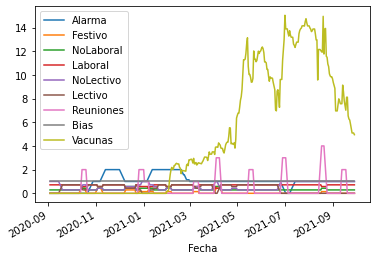

In [16]:


#entradas = ['Alarma','Festivo','Laboral','Lectivo','Reuniones','Bias']
X_prima = puntos[variables].iloc[1:].T
Omega       = puntos[variables+entradas].shift(1).iloc[1:].T
display(X_prima.T)
display(Omega.T[entradas].plot())


In [17]:
%%time 
Omega_pinv = pd.DataFrame(np.linalg.pinv(Omega),index=Omega.columns,columns=Omega.index)#.shape
Omega_pinv

CPU times: user 12.7 ms, sys: 3.1 ms, total: 15.8 ms
Wall time: 11.1 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Fecha,,,,,,,,,,,,,,,,,,,,,
2020-09-03,0.000347,-0.000025,-0.009014,-0.000422,0.003223,-0.000288,-0.001347,-0.001245,0.000750,0.000996,...,0.970964,0.019498,0.051266,-2.352422,-2.153043,-2.231910,-2.273555,0.000480,-4.505465,0.002653
2020-09-04,0.000418,0.000027,-0.003167,-0.000441,0.002025,-0.000172,-0.000666,-0.001982,-0.000020,0.000686,...,0.845347,0.013110,0.010769,-3.947678,-3.879378,-3.894314,-3.932742,0.002744,-7.827056,0.000291
2020-09-05,0.001060,-0.000016,-0.007412,-0.000619,0.003721,-0.000515,-0.000391,-0.000957,0.000266,-0.000155,...,0.609609,0.023361,0.040672,-1.236568,-1.100997,-1.149088,-1.188478,-0.000591,-2.337566,0.002316
2020-09-06,0.000057,-0.000033,-0.008476,-0.000294,0.002697,0.000403,-0.000230,-0.000603,0.000518,0.001021,...,0.519589,0.011577,0.055682,-1.195687,-1.085386,-1.123746,-1.157327,-0.001815,-2.281073,0.000500
2020-09-07,0.000264,-0.000008,-0.001534,-0.000037,0.000171,0.000414,0.001479,-0.000986,-0.000343,0.000077,...,0.249903,0.007104,0.040921,-1.408968,-1.339160,-1.357353,-1.390775,-0.001205,-2.748129,-0.002611
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-24,0.000490,-0.000009,-0.005824,-0.001129,0.004494,0.000281,-0.001080,0.000899,-0.000587,-0.000262,...,-0.539586,0.028704,-0.012133,3.425634,3.379485,3.401621,3.403498,-0.003898,6.805119,0.002186
2021-09-25,0.000365,0.000054,0.001563,-0.000912,0.003575,0.000073,-0.000804,-0.000425,-0.001127,0.000240,...,-0.428755,0.016542,-0.036315,1.615466,1.524603,1.572648,1.567421,-0.000603,3.140070,-0.000503
2021-09-26,0.000702,0.000069,0.006618,-0.000541,0.001962,-0.000544,0.002405,-0.000385,-0.001246,0.000109,...,-0.562444,0.004416,-0.037591,1.305874,1.193159,1.253438,1.245595,-0.002001,2.499033,-0.002223



$$ X' = G_{nx(n+q)} \Omega \Leftrightarrow G_{nx(n+q)} = X'\Omega^\dagger $$

In [18]:
celdas = X_prima.index


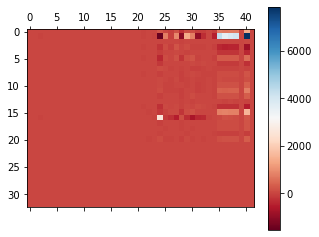

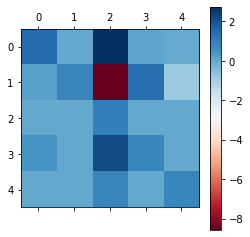

In [19]:
G = X_prima.dot( Omega_pinv)
plt.matshow(G, cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()
plt.matshow(G.iloc[:5,:5], cmap=plt.cm.RdBu)
plt.colorbar()
plt.show()

Step 1
------

$$\Omega = \tilde U \tilde \Sigma \tilde V^* $$

In [20]:
%%time
U_tilde,kS_tilde,V_tilde_star = np.linalg.svd(Omega,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_tilde = pd.DataFrame(np.diag(kS_tilde),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

V_tilde_star = pd.DataFrame(V_tilde_star,
                            columns=Omega.columns,
                            index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                           )

U_tilde = pd.DataFrame(U_tilde,index=Omega.index,
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],)



print("{} = {}·{}·{}".format(Omega.shape,U_tilde.shape,Sigma_tilde.shape,V_tilde_star.shape))

(42, 383) = (42, 42)·(42, 42)·(42, 383)
CPU times: user 5.62 ms, sys: 1.82 ms, total: 7.44 ms
Wall time: 5.44 ms


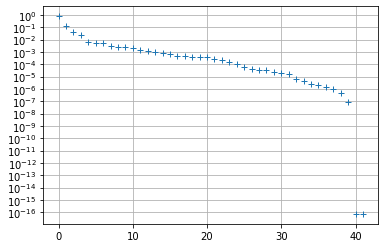

In [21]:
plt.plot(kS_tilde/kS_tilde.sum(),'+')

plt.yscale('symlog', linthresh=1.e-29)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,210)
plt.grid()

In [22]:
r_tilde=np.min([len(X_prima.columns),len(X_prima.index)])#205#33#25#41#65#11#43#33
corRed_tilde = ['$P_{{{}}}$'.format(i) for i in range(r_tilde)]

Step 2
-------
$$ G_{nx(n+q)} = X'\Omega^\dagger = X' \tilde V \tilde \Sigma^{-1}\tilde U^*$$

$$ [{A}_{nxn},B_{nxq}] = [ X' \tilde V \tilde \Sigma^{-1}\tilde U^*_1, X' \tilde V \tilde \Sigma^{-1}\tilde U^*_2]$$

In [23]:
U_tilde

,$P_{0}$,$P_{1}$,$P_{2}$,$P_{3}$,$P_{4}$,$P_{5}$,$P_{6}$,$P_{7}$,$P_{8}$,$P_{9}$,...,$P_{32}$,$P_{33}$,$P_{34}$,$P_{35}$,$P_{36}$,$P_{37}$,$P_{38}$,$P_{39}$,$P_{40}$,$P_{41}$
Casos,-0.119398,0.242166,-0.187835,-0.670494,0.062634,0.047844,0.032541,-0.412989,-0.123106,0.025858,...,-0.001439,-0.001917,-0.001295,-0.000115,-0.000140,-0.000043,-0.000089,-2.568885e-05,1.929417e-17,1.533868e-17
test coresp,-0.889334,0.332269,-0.069164,0.303056,0.010088,-0.019212,0.008211,-0.007017,0.018985,0.027104,...,0.000008,0.000092,0.000004,-0.000003,0.000004,0.000028,-0.000010,3.496298e-06,4.062757e-19,3.254744e-19
Tasa de positividad (%),-0.003511,0.000274,-0.002672,-0.023485,-0.009966,-0.000146,-0.016183,-0.027296,0.020571,-0.025061,...,0.003385,0.002503,0.000225,0.005920,0.002550,0.008053,-0.000862,4.806494e-04,7.493260e-17,9.716819e-17
Asintomáticos,-0.060285,0.131639,-0.114302,-0.340056,0.014984,-0.087639,0.407298,0.739987,-0.234666,0.021337,...,0.000796,0.000032,0.000589,0.000169,0.000304,0.000086,0.000056,4.577913e-06,2.249430e-18,-6.164624e-18
Asintomáticos (%),-0.014261,-0.022851,0.002582,0.002582,0.013609,-0.022064,0.075239,0.130829,-0.175128,0.034239,...,0.000880,-0.000569,-0.000490,-0.000125,-0.001334,0.000376,-0.000129,-7.291262e-05,-1.086117e-18,1.828487e-17
Zaragoza,-0.083574,0.153076,-0.128737,-0.405274,0.043695,0.109134,-0.343916,0.129825,0.341401,-0.210546,...,-0.000383,-0.000214,0.000511,-0.000064,-0.000350,-0.000018,-0.000040,-1.376024e-05,1.867847e-18,-5.874807e-18
Zaragoza (%),-0.020712,-0.041651,0.005298,0.034453,0.062726,0.127831,-0.194579,0.124517,-0.162686,-0.226614,...,-0.002232,-0.002047,0.001167,0.000803,0.000075,-0.000110,-0.000486,2.718154e-05,7.212630e-18,3.314749e-17
1 a 14 años,-0.014410,0.022637,-0.030235,-0.036005,0.067457,-0.302102,0.187754,-0.113924,0.028344,-0.585788,...,0.001764,-0.002022,0.000221,0.000800,0.000648,-0.000332,0.000464,-2.229828e-05,-3.082463e-17,-1.087878e-17
15 a 24 años,-0.018365,0.035202,-0.198989,-0.107351,-0.819879,0.060142,-0.200937,-0.055107,-0.112019,0.158902,...,0.001704,0.001696,0.001101,0.000263,-0.000019,-0.000073,0.000335,8.539350e-06,-1.417478e-17,-9.946787e-18
25 a 34 años,-0.014746,0.030931,-0.069960,-0.082648,-0.134746,-0.029586,0.018160,0.083234,0.002959,-0.148487,...,-0.001546,0.000325,0.001498,0.001105,-0.000120,-0.000436,0.000175,5.023587e-05,-3.453939e-17,-1.512607e-17


In [24]:
%%time
U_tilde_r = U_tilde.loc[:,corRed_tilde]
Sigma_tilde_r = Sigma_tilde.loc[corRed_tilde,corRed_tilde]

Sigma_tilde_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_tilde)),
                              1./kS_tilde
                             ),
                      index=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                      columns=['$P_{{{}}}$'.format(i) for i in range(len(kS_tilde))],
                     )

Sigma_tilde_inv_r = Sigma_tilde_inv.loc[corRed_tilde,corRed_tilde]
V_tilde = V_tilde_star.T
V_tilde_r = V_tilde.loc[:,corRed_tilde]

U_tilde_1 = U_tilde.loc[X_prima.index]
U_tilde_2 = U_tilde.loc[['Alarma']]
U_tilde_1_r = U_tilde_1.loc[:,corRed_tilde]
U_tilde_2_r = U_tilde_2.loc[:,corRed_tilde]

CPU times: user 12.8 ms, sys: 827 µs, total: 13.6 ms
Wall time: 31 ms


In [25]:
%%time
G = X_prima.dot(V_tilde_r).dot(Sigma_tilde_inv_r).dot(U_tilde_r.T)
G

CPU times: user 4.62 ms, sys: 2.26 ms, total: 6.88 ms
Wall time: 52 ms


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos 75 años o más,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
Casos,1.249595,1.987105e-03,2.411198,0.109837,-0.194543,-0.373361,0.365535,-1.214325,0.254981,-0.106357,...,-1.699796,-3.614775,-62.744003,25.166641,-25.651296,0.242890,-0.727545,1.160279,-0.484655,0.196206
test coresp,-1.974973,8.777685e-01,1.108998,2.305649,-2.658795,0.144462,0.341627,-1.693635,2.080982,1.959561,...,-52.304243,-3.768751,-423.864779,293.615747,-295.505287,-47.291059,45.401520,3.437011,-1.889539,-3.038548
Tasa de positividad (%),0.004576,4.488177e-04,0.996966,-0.004787,-0.018095,-0.007805,-0.005180,-0.016631,0.005642,0.006962,...,0.053478,-0.406296,0.419194,-0.906781,0.913232,0.229930,-0.223480,0.019928,0.006451,0.018982
Asintomáticos,0.150983,-3.192581e-03,1.752710,0.895760,0.001168,-0.141888,0.463929,-0.451059,0.317289,-0.169753,...,-2.950790,-2.045352,-29.669346,9.622570,-9.747317,-0.564567,0.439819,-0.218056,-0.124748,-0.595353
Asintomáticos (%),0.003573,1.559913e-03,0.467755,0.005775,0.824080,0.003192,0.102809,-0.010161,0.016502,-0.061983,...,-0.957536,0.101903,-0.782483,0.811059,-0.780975,0.365681,-0.335597,-0.088676,0.030084,-0.240617
Zaragoza,0.330653,2.345990e-03,1.146108,0.069810,0.169629,0.528757,0.407145,-0.788375,0.168795,-0.147202,...,2.948072,-2.696208,-30.097609,4.630644,-5.001816,2.432639,-2.803811,0.528830,-0.371173,-0.004488
Zaragoza (%),0.004338,-2.081572e-04,-0.222331,-0.001533,0.050417,-0.001499,0.908501,0.003204,-0.009165,0.009048,...,0.526690,-0.098805,3.817132,-3.439303,3.465044,0.666695,-0.640954,-0.155177,0.025741,-0.109152
1 a 14 años,0.016132,5.666748e-04,0.525698,0.048255,-0.024101,-0.055471,0.117570,0.759977,0.030445,0.042470,...,0.062901,0.233644,-5.729782,1.058847,-1.102283,0.141616,-0.185053,0.123019,-0.043437,-0.015956
15 a 24 años,0.066118,4.931835e-03,1.047105,0.049089,-0.377229,-0.076247,0.023713,-0.307293,0.899385,0.017364,...,-8.047207,-7.370175,-16.394350,9.702374,-9.449738,-1.623900,1.876536,0.826435,0.252636,-0.080604
25 a 34 años,0.028752,5.053381e-04,0.465275,0.005955,0.036427,-0.037048,0.067982,-0.148752,0.072680,0.856301,...,-0.170379,-0.156163,-6.690433,4.511548,-4.578134,-0.500929,0.434344,-0.026351,-0.066585,0.037483


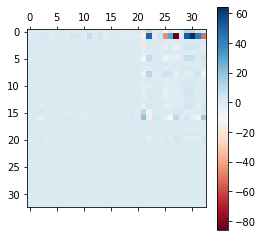

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Casos,1.249595,1.987105e-03,2.411198,0.109837,-0.194543,-0.373361,0.365535,-1.214325,0.254981,-0.106357,...,0.885515,1.279875,-10.399051,-1.352091,-11.254490,-0.325891,10.811493,10.376240,2.303357,-1.699796
test coresp,-1.974973,8.777685e-01,1.108998,2.305649,-2.658795,0.144462,0.341627,-1.693635,2.080982,1.959561,...,-2.334829,4.543515,-45.474743,28.887660,-85.920863,-0.201747,51.961430,64.617149,43.590401,-52.304243
Tasa de positividad (%),0.004576,4.488177e-04,0.996966,-0.004787,-0.018095,-0.007805,-0.005180,-0.016631,0.005642,0.006962,...,0.014640,-0.018749,0.176806,-0.091211,0.137528,0.034319,-0.111914,-0.145746,-0.066918,0.053478
Asintomáticos,0.150983,-3.192581e-03,1.752710,0.895760,0.001168,-0.141888,0.463929,-0.451059,0.317289,-0.169753,...,-0.003664,0.237997,-2.041609,1.235525,-5.048659,0.204181,2.995574,3.396812,1.856155,-2.950790
Asintomáticos (%),0.003573,1.559913e-03,0.467755,0.005775,0.824080,0.003192,0.102809,-0.010161,0.016502,-0.061983,...,-0.225379,-0.108376,0.821049,1.010849,-0.103171,0.083230,-0.599759,-0.339974,0.383286,-0.957536
Zaragoza,0.330653,2.345990e-03,1.146108,0.069810,0.169629,0.528757,0.407145,-0.788375,0.168795,-0.147202,...,1.060383,1.040709,-8.038553,-3.990340,-4.779464,-0.492847,7.492472,5.967475,-1.150442,2.948072
Zaragoza (%),0.004338,-2.081572e-04,-0.222331,-0.001533,0.050417,-0.001499,0.908501,0.003204,-0.009165,0.009048,...,0.082170,-0.049760,0.582937,-0.798760,0.771842,0.126491,-0.392968,-0.560722,-0.230269,0.526690
1 a 14 años,0.016132,5.666748e-04,0.525698,0.048255,-0.024101,-0.055471,0.117570,0.759977,0.030445,0.042470,...,0.087288,0.135665,-0.826784,-0.530545,-0.904644,0.070589,0.976545,0.886070,0.147616,0.062901
15 a 24 años,0.066118,4.931835e-03,1.047105,0.049089,-0.377229,-0.076247,0.023713,-0.307293,0.899385,0.017364,...,-0.797432,-0.896399,5.676260,4.522639,-3.202482,1.150171,-2.720611,-0.772452,5.191252,-8.047207
25 a 34 años,0.028752,5.053381e-04,0.465275,0.005955,0.036427,-0.037048,0.067982,-0.148752,0.072680,0.856301,...,0.080025,0.167377,-1.543271,0.148904,-1.365137,-0.176558,1.313034,1.321514,0.192987,-0.170379


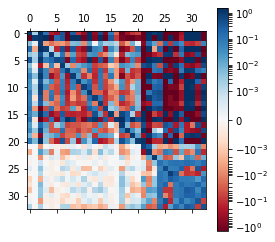

In [26]:
A = G.loc[:,celdas]
B = G.loc[:,entradas]
#D = G.loc[:,salidas]
#A_tilde[:11,:11].round(0).astype(int)

#import matplotlib.pyplot as plt
import matplotlib.colors as colors

plt.matshow(A, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()
A

(33, 383) = (33, 33)·(33, 33)·(33, 383)
CPU times: user 52 ms, sys: 3.62 ms, total: 55.6 ms
Wall time: 216 ms


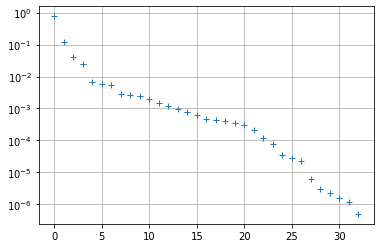

In [27]:
%%time
U_hat,kS_hat,V_hat_star = np.linalg.svd(X_prima,
                          full_matrices=False)

#kS = np.einsum('ij,j->ij',
#                              np.identity(len(Sigma)),
#                              Sigma
#                             )
Sigma_hat = pd.DataFrame(np.diag(kS_hat),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

V_hat_star = pd.DataFrame(V_hat_star,
                            columns=X_prima.columns,
                            index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                           )

U_hat = pd.DataFrame(U_hat,index=X_prima.index,
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],)

V_hat = V_hat_star.T


print("{} = {}·{}·{}".format(X_prima.shape,U_hat.shape,Sigma_hat.shape,V_hat_star.shape))
#plt.plot(Sigma/np.sum(Sigma),'+')
plt.plot(kS_hat/kS_hat.sum(),'+')

plt.yscale('symlog', linthresh=1.e-22)
#plt.xscale('symlog', linthreshx=50)
#plt.xlim(-1,200)
plt.grid()

In [28]:
#GOTO0
thresh = 1e-6#6
#np.where(kS_hat/kS_hat.sum()<thresh)[0][0]
try:
    print(np.where(kS_hat/kS_hat.sum()<thresh)[0][0])#7#33#25#41#65#11#43#33  )
except:
    print(len(kS_hat))

32


In [29]:
r=len(kS_hat)
try:
    r = np.where(kS_hat/kS_hat.sum()<thresh)[0][0]#7#33#25#41#65#11#43#33  
except:
    r=len(kS_hat)
corRed = ['$\tilde x^{{{}}}$'.format(i) for i in range(r)]
U_hat.loc[:,corRed]

,$\tilde x^{0}$,$\tilde x^{1}$,$\tilde x^{2}$,$\tilde x^{3}$,$\tilde x^{4}$,$\tilde x^{5}$,$\tilde x^{6}$,$\tilde x^{7}$,$\tilde x^{8}$,$\tilde x^{9}$,...,$\tilde x^{22}$,$\tilde x^{23}$,$\tilde x^{24}$,$\tilde x^{25}$,$\tilde x^{26}$,$\tilde x^{27}$,$\tilde x^{28}$,$\tilde x^{29}$,$\tilde x^{30}$,$\tilde x^{31}$
Casos,-0.119333,0.242612,-0.186339,-0.670645,0.063328,-0.047279,0.036440,-0.405284,0.143088,-0.071847,...,0.048063,0.009111,0.008073,0.009667,0.005582,3.457811e-03,0.001058,0.000198,0.000277,0.000022
test coresp,-0.889358,0.331886,-0.070303,0.303261,0.009980,0.019668,0.006873,-0.009846,-0.006895,0.030587,...,0.004531,0.000682,-0.000789,0.000036,0.000068,-5.547064e-05,0.000025,0.000007,-0.000013,0.000030
Tasa de positividad (%),-0.003508,0.000303,-0.002584,-0.023564,-0.010335,-0.000641,-0.015997,-0.027432,-0.026947,-0.019256,...,0.940260,0.109280,-0.193694,-0.012078,0.033552,1.135333e-02,0.004731,-0.007225,-0.004599,0.006753
Asintomáticos,-0.060239,0.131893,-0.114029,-0.339580,0.024101,0.107865,0.399346,0.753794,0.194397,-0.010769,...,0.025401,0.000311,-0.007814,-0.001719,0.000632,5.166683e-07,-0.000330,-0.000270,-0.000377,-0.000037
Asintomáticos (%),-0.014261,-0.022857,0.002431,0.002910,0.016083,0.025953,0.073407,0.136947,0.171456,-0.021408,...,-0.033238,0.007874,0.020960,0.021278,-0.004052,-1.371582e-03,0.000086,0.000458,0.001201,0.000772
Zaragoza,-0.083522,0.153446,-0.127706,-0.406172,0.037321,-0.126245,-0.339911,0.119276,-0.406713,-0.019953,...,-0.063363,0.015646,-0.001112,-0.015029,-0.000446,-2.957334e-05,-0.000819,-0.000050,0.000115,0.000195
Zaragoza (%),-0.020715,-0.041637,0.005407,0.033988,0.058160,-0.139010,-0.190544,0.146778,0.059665,-0.246364,...,0.157816,-0.025867,-0.003255,0.028012,-0.002572,5.575019e-03,-0.000854,-0.000666,0.000256,-0.000190
1 a 14 años,-0.014407,0.022660,-0.030026,-0.036394,0.070678,0.307169,0.167706,-0.082294,-0.237915,-0.570332,...,-0.099303,-0.045894,0.007507,0.007368,-0.004542,2.210228e-03,0.000190,-0.001127,-0.000491,-0.000691
15 a 24 años,-0.018359,0.035243,-0.198582,-0.109154,-0.823502,-0.060845,-0.181620,-0.058451,0.169074,0.099923,...,-0.060689,-0.028922,-0.013315,0.007075,-0.015240,-3.120366e-03,-0.000766,-0.000201,0.000074,-0.000159
25 a 34 años,-0.014737,0.030986,-0.069823,-0.083025,-0.134128,0.031734,0.017954,0.088591,-0.057880,-0.139108,...,-0.045522,-0.026278,0.029213,-0.012235,0.000218,-2.516810e-03,-0.001941,-0.000795,0.000616,-0.000453


In [30]:
U_hat_r = U_hat.loc[:,corRed]
Sigma_hat_r = Sigma_hat.loc[corRed,corRed]

Sigma_hat_inv = pd.DataFrame(np.einsum('ij,j->ij',
                              np.identity(len(kS_hat)),
                              1./kS_hat
                             ),
                      index=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                      columns=['$\tilde x^{{{}}}$'.format(i) for i in range(len(kS_hat))],
                     )

Sigma_hat_inv_r = Sigma_hat_inv.loc[corRed,corRed]
V_hat =   V_hat_star.T
V_hat_r = V_hat.loc[:,corRed]

$$ \tilde A \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_1^* \hat U_r$$
$$ \tilde B \tilde = \hat U_r ^* X' \tilde V \tilde \Sigma^{-1} \tilde U_2^* $$

$$\tilde x_{k+1} = \tilde A\tilde x_k + \tilde B u_k $$
$$ Con: x  \tilde = \hat U_r \tilde x; \tilde x = \hat U_r^* x$$

$$ x_{k+1} = A_{nxn}x_k+B_{nx1}u_k $$

$$\tilde x_{k+1} = \tilde A_{rxr}\tilde x_k + \tilde B_{rx1} u_k $$

$$ x_{k+1} \tilde = \hat U_{nxr} \tilde x_{k+1} $$

In [31]:
A_tilde = U_hat_r.T.dot(A).dot(U_hat_r.loc[celdas])
B_tilde = U_hat_r.T.dot(B)

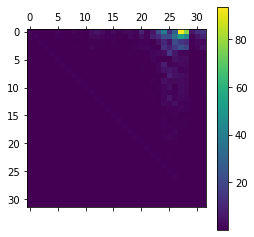

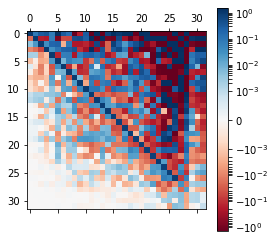

In [32]:
plt.matshow(np.absolute(A_tilde))#, cmap=plt.cm.RdBu)#, vmin=-100.0, vmax=100.0)
plt.colorbar()
plt.show()
plt.matshow(A_tilde, cmap=plt.cm.RdBu,norm=colors.SymLogNorm(linthresh=1.e-3, linscale=1.0,
                                              vmin=-1.5, vmax=1.5))
plt.colorbar()

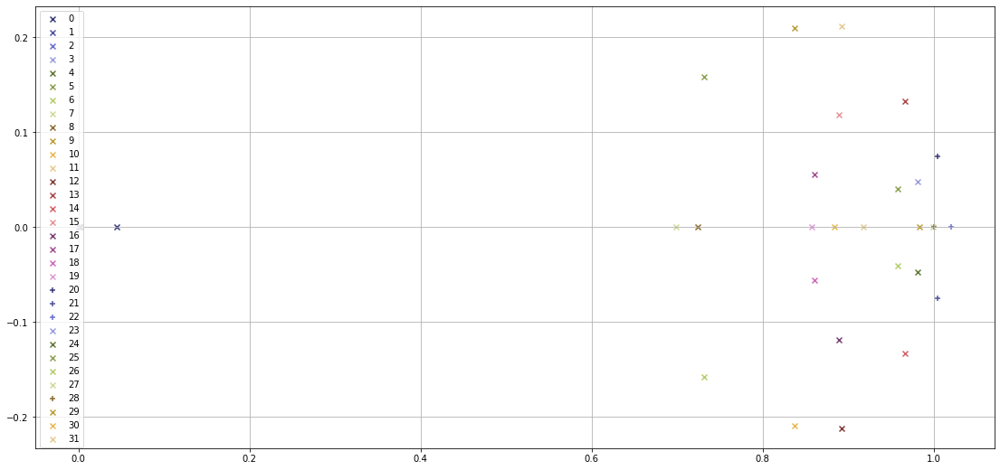

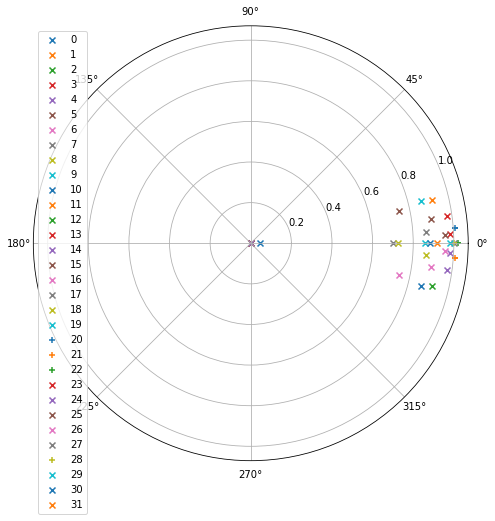

In [33]:
Lambda,W = np.linalg.eig(A_tilde)
colores = plt.cm.tab20b.colors
colores = colores + colores

fig = plt.figure(figsize=(19,9))
for i in range(len(Lambda)):
    if np.abs(Lambda[i]) >= 1:
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='+')
    else:    
        plt.scatter(Lambda[i].real,Lambda[i].imag,color=colores[i],label=i,marker='x')
plt.legend(loc=2)
plt.grid()
plt.show()

#fig, ax = plt.subplots(figsize=(9, 9))
fig = plt.figure(figsize=(8,8))
ax = fig.add_subplot(projection='polar')
j = 0
for i in Lambda:
    if np.abs(i) > 1:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='+',label=j)
    else:
        ax.scatter([np.angle(i)],[np.abs(i)],marker='x',label=j)
    j+=1
plt.legend(loc=2)
plt.show()

In [34]:
X_interp = A.dot(Omega.loc[celdas])
puntos_int = X_interp.T.shift(1)
display(puntos.shift(-1).tail())
display(puntos_int.tail())

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-24,4.0,82.428571,2047.000000,1605.285714,4.155714,46.741429,58.285714,16.571429,5.428571,9.571429,...,41.742094,87.793088,89.006181,81.272586,86.190042,89.105765,88.645900,89.238264,91.208397,89.002827
2021-09-25,4.0,81.000000,2080.714286,1565.428571,3.867143,45.751429,58.571429,17.428571,4.857143,9.714286,...,41.584548,87.786948,88.996736,81.268665,86.183187,89.101278,88.641327,89.233982,91.204698,88.991905
2021-09-26,4.0,80.285714,2120.857143,1557.285714,3.772857,45.555714,59.571429,17.285714,5.142857,9.857143,...,41.431387,87.780863,88.987370,81.264513,86.176231,89.096720,88.636477,89.230346,91.201000,88.981363
2021-09-27,4.0,73.142857,2152.000000,1541.428571,3.461429,41.598571,53.428571,14.428571,5.428571,8.428571,...,41.288409,87.775319,88.979551,81.260131,86.170283,89.092304,88.631973,89.226711,91.197090,88.972436
2021-09-28,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-24,90.406472,2116.017587,3.992701,55.919565,58.441117,56.577172,67.037670,14.344378,18.739127,11.062628,...,42.176324,87.796061,88.951112,81.284550,86.165740,89.094397,88.672866,89.268381,91.203629,88.999495
2021-09-25,87.539251,2157.125377,3.861345,54.016300,58.711052,55.033034,67.102483,15.200771,18.537406,10.789033,...,42.007132,87.789775,88.945512,81.279272,86.158537,89.087053,88.665097,89.263603,91.200121,88.995648
2021-09-26,87.980552,2240.562852,3.712914,52.466125,58.430956,55.071339,66.598740,14.826596,18.564006,11.294864,...,41.849271,87.782129,88.933474,81.275380,86.152009,89.084561,88.661675,89.259571,91.197125,88.980765
2021-09-27,87.551788,2229.229139,3.649655,52.232061,57.412700,56.041019,69.079119,15.285710,18.501510,11.155995,...,41.687067,87.774734,88.931536,81.268486,86.150441,89.077792,88.652511,89.249780,91.192066,88.982984
2021-09-28,83.827231,2256.769210,3.291748,51.057972,57.357541,54.353312,71.272132,16.280319,16.395333,11.052649,...,41.525203,87.768114,88.928368,81.262870,86.150913,89.072819,88.647049,89.239588,91.184039,88.981418


In [35]:
#for i in variables:
#    fig, ax = plt.subplots(figsize=(15,6))
#    #Omega.T[[i]].plot(ax=ax,label='{} interpolado'.format(i))
#    X_prima.T[[i]].plot(ls='-',ax=ax,label='{} interpolado'.format(i))
#    X_interp.T[[i]].plot(ls='--',ax=ax,label='{} interpolado'.format(i))
#    plt.grid()
#    plt.legend()
#    plt.show()

In [36]:
(X_interp-X_prima).divide(X_prima/100.).T.describe()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
count,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,...,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000,383.000000
mean,6.891952,6.296764,-1.053018,10.510425,2.852147,3.691866,-1.222160,2.134436,44.396807,8.664656,...,0.160749,-0.009681,-0.066023,0.000534,-0.016523,-0.018883,0.037487,0.015633,-0.026695,-0.027504
std,6.226166,3.930260,4.412137,10.411914,3.798959,5.487503,1.854720,6.286509,40.241854,8.393545,...,0.208098,0.008215,0.027148,0.017898,0.018499,0.016052,0.042778,0.027758,0.012931,0.056896
min,-6.445408,-4.826499,-16.972167,-11.195621,-5.644134,-12.047589,-8.670199,-17.433652,-7.498411,-4.872654,...,-0.057794,-0.028739,-0.129423,-0.036327,-0.061483,-0.052355,-0.041741,-0.040590,-0.059184,-0.143375
25%,2.464933,3.783861,-3.728058,3.082161,0.268931,0.201204,-2.183208,-1.493553,16.541605,2.363853,...,-0.003551,-0.012921,-0.086248,-0.011877,-0.025037,-0.029124,0.004638,-0.006751,-0.034468,-0.083547
50%,5.847348,5.661010,-0.943397,8.902438,2.290239,3.055686,-1.126043,1.457227,35.553097,6.537484,...,0.058468,-0.009418,-0.065448,0.004077,-0.015210,-0.022169,0.026724,0.017700,-0.026733,-0.019117
75%,10.250495,8.653255,2.031831,15.124400,5.257032,6.873985,-0.260752,5.218232,63.612555,13.082952,...,0.325820,-0.006260,-0.045070,0.011780,-0.005478,-0.006861,0.081344,0.038964,-0.018092,0.017122
max,28.109646,21.974168,12.521498,49.419419,19.309633,22.855463,8.839437,25.092950,280.913441,43.907979,...,0.740779,0.112840,0.027927,0.111395,0.125433,0.082585,0.158986,0.111880,0.062011,0.194094


In [37]:
x1 = puntos[variables].T.iloc[:,-12]
display(x1)
display(puntos[variables].T.iloc[:,-11])
A.dot(x1)

Casos                          85.857143
test coresp                  1777.428571
Tasa de positividad (%)         4.708571
Asintomáticos                  45.568571
Asintomáticos (%)              52.285714
Zaragoza                       61.428571
Zaragoza (%)                   73.044341
1 a 14 años                    19.428571
15 a 24 años                    7.857143
25 a 34 años                    8.142857
35 a 44 años                   14.428571
45 a 54 años                   11.571429
55 a 64 años                    7.714286
65 a 74 años                    4.428571
75 años o más                   8.428571
Camas Ocup                    157.857143
Camas libres                 1455.428571
Camas (%)                      10.918698
UCI ocupadas                   33.857143
UCI libres con resp            98.571429
UCI (%)                        34.346392
Rs                              0.671082
Rd                              0.669895
Inoculados                     43.245982
Total Casos     

Casos                          86.000000
test coresp                  1803.428571
Tasa de positividad (%)         4.637143
Asintomáticos                  45.998571
Asintomáticos (%)              52.857143
Zaragoza                       60.142857
Zaragoza (%)                   70.741453
1 a 14 años                    19.142857
15 a 24 años                    7.714286
25 a 34 años                    7.857143
35 a 44 años                   14.285714
45 a 54 años                   10.428571
55 a 64 años                    7.714286
65 a 74 años                    4.571429
75 años o más                   9.571429
Camas Ocup                    152.142857
Camas libres                 1480.285714
Camas (%)                      10.418513
UCI ocupadas                   32.857143
UCI libres con resp            98.571429
UCI (%)                        33.315464
Rs                              0.673222
Rd                              0.757990
Inoculados                     42.994941
Total Casos     

Casos                          96.745081
test coresp                  2000.065309
Tasa de positividad (%)         4.083343
Asintomáticos                  57.405460
Asintomáticos (%)              54.500142
Zaragoza                       63.010145
Zaragoza (%)                   71.988909
1 a 14 años                    19.527282
15 a 24 años                   17.461359
25 a 34 años                   10.365915
35 a 44 años                   13.128096
45 a 54 años                   10.276372
55 a 64 años                    6.497446
65 a 74 años                    4.101552
75 años o más                   7.031444
Camas Ocup                    153.089747
Camas libres                 1438.277645
Camas (%)                      11.433891
UCI ocupadas                   32.560550
UCI libres con resp           100.906325
UCI (%)                        31.949761
Rs                              0.689478
Rd                              0.800985
Inoculados                     43.189654
Total Casos     

,Alarma,Festivo,Reuniones,VacunasD,Vacunas,Casos,Lectivo
2021-09-21,1.0,0.0,0.0,5.713,7.122,130.0,0.0
2021-09-22,1.0,0.0,0.0,7.766,11.418,83.0,0.0
2021-09-23,1.0,0.0,0.0,2.925,9.476,87.0,0.0
2021-09-24,1.0,0.0,0.0,3.252,5.187,85.0,0.0
2021-09-25,1.0,0.0,0.0,0.091,0.000,52.0,0.0
2021-09-26,1.0,0.0,0.0,0.000,0.003,41.0,0.0
2021-09-27,1.0,0.0,0.0,2.347,1.448,84.0,0.0
2021-09-28,1.0,0.0,0.0,0.000,4.818,80.0,0.0
2021-09-29,0.0,0.0,0.0,NaN,9.867,100.0,1.0
2021-09-30,0.0,0.0,0.0,NaN,7.186,101.0,1.0


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-27,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,0.0,1.0,4.950571
2021-09-28,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,0.0,1.0,4.621429
2021-09-29,0.857143,0.000000,0.285714,0.714286,0.857143,0.142857,0.0,1.0,4.399857
2021-09-30,0.714286,0.000000,0.285714,0.714286,0.714286,0.285714,0.0,1.0,4.072714
2021-10-01,0.571429,0.000000,0.285714,0.714286,0.571429,0.428571,0.0,1.0,4.002000
2021-10-02,0.428571,0.000000,0.285714,0.714286,0.571429,0.428571,0.0,1.0,4.002000
2021-10-03,0.285714,0.000000,0.285714,0.714286,0.571429,0.428571,0.0,1.0,4.001571
2021-10-04,0.142857,0.000000,0.285714,0.714286,0.428571,0.571429,0.0,1.0,3.927000
2021-10-05,0.000000,0.000000,0.285714,0.714286,0.285714,0.714286,0.0,1.0,3.680714
2021-10-06,0.000000,0.000000,0.285714,0.714286,0.285714,0.714286,0.0,1.0,3.439143


,Alarma,Festivo,NoLaboral,Laboral,NoLectivo,Lectivo,Reuniones,Bias,Vacunas
2021-09-27,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,0.0,1.0,4.950571
2021-09-28,1.000000,0.000000,0.285714,0.714286,1.000000,0.000000,0.0,1.0,4.621429
2021-09-29,0.857143,0.000000,0.285714,0.714286,0.857143,0.142857,0.0,1.0,4.399857
2021-09-30,0.714286,0.000000,0.285714,0.714286,0.714286,0.285714,0.0,1.0,4.072714
2021-10-01,0.571429,0.000000,0.285714,0.714286,0.571429,0.428571,0.0,1.0,4.002000
2021-10-02,0.428571,0.000000,0.285714,0.714286,0.571429,0.428571,0.0,1.0,4.002000
2021-10-03,0.285714,0.000000,0.285714,0.714286,0.571429,0.428571,0.0,1.0,4.001571
2021-10-04,0.142857,0.000000,0.285714,0.714286,0.428571,0.571429,0.0,1.0,3.927000
2021-10-05,0.000000,0.000000,0.285714,0.714286,0.285714,0.714286,0.0,1.0,3.680714
2021-10-06,0.000000,0.000000,0.285714,0.714286,0.285714,0.714286,0.0,1.0,3.439143


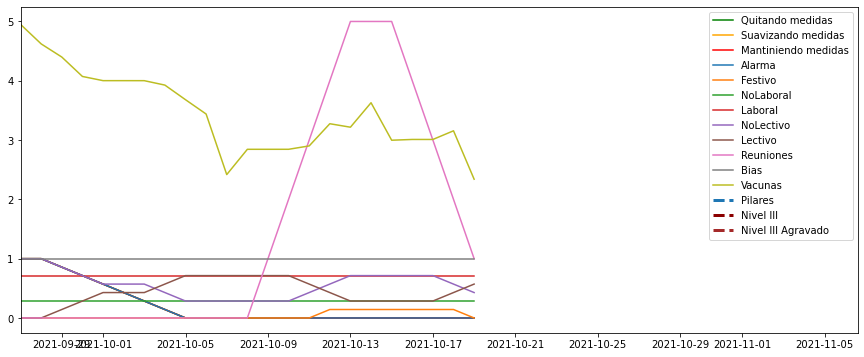

In [38]:
#x1 = puntos.loc[pd.date_range('2020-9-07',periods=83,freq='d')].copy()
x1 = puntos.loc['2020-10-21':].copy() #goto0
#x1 = puntos.loc['2020-10-7':].copy() #goto0
##x1 = puntos.loc['2020-10-1':].copy() #goto0
##x1 = puntos.loc['2020-11-1':].copy()
diasCalc = 21
x1 = puntos.iloc[-15:].copy()
#x1 = puntos.iloc[-29:].copy()
x1 = puntos.iloc[-8:].copy()
#x1 = puntos.iloc[-1:].copy()


#x1 = puntos.loc['2021-7-1':].copy() 
U1 = x1[entradas]
U1 = total.loc[x1.index,['Alarma']]
U0 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
                                                   
U2 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
x1_0 = x1.iloc[7].copy()
U1 = pd.concat([U1,
    pd.DataFrame(np.ones(diasCalc)*0,index=pd.date_range(U1.index[-1]+pd.offsets.DateOffset(1),
                                   U1.index[-1]+pd.offsets.DateOffset(diasCalc)
                                  ),columns=['Alarma'])])
##U0.loc['2021-9-26':,'Alarma'] = 1
##U1.loc['2021-9-26':,'Alarma'] = 1
##U2.loc['2021-9-26':,'Alarma'] = 1
###
###U0.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U1.loc['2020-12-5':'2020-12-9','Alarma'] = 0
###U2.loc['2020-12-5':'2020-12-9','Alarma'] = 0
U0.Alarma.fillna(method="ffill",inplace=True)
U1.Alarma.fillna(method="ffill",inplace=True)
U2.Alarma.fillna(method="ffill",inplace=True)
#U0.Alarma.fillna(0,inplace=True)
#U1.Alarma.fillna(0,inplace=True)
#U2.Alarma.fillna(0,inplace=True)


#U1.Alarma = total.Alarma
#U0.Alarma = total.Alarma
#U2.Alarma = total.Alarma

#U1 = Al1.copy()
U1['Festivo'] = total['Festivo']
U0['Festivo'] = total['Festivo']
U2['Festivo'] = total['Festivo']

U1['Reuniones'] = total['Reuniones']
U0['Reuniones'] = total['Reuniones']
U2['Reuniones'] = total['Reuniones']

U1['VacunasD'] = total['VacunasD']
U0['VacunasD'] = total['VacunasD']
U2['VacunasD'] = total['VacunasD']


U1['Vacunas'] = total['Vacunas']
U0['Vacunas'] = total['Vacunas']
U2['Vacunas'] = total['Vacunas']

U1['Casos'] = total['Casos']
U0['Casos'] = total['Casos']
U2['Casos'] = total['Casos']




U1['Lectivo']   = total['Lectivo']

display(U1)

U1.Festivo.fillna(0,inplace=True)
#U1.loc['2021-04-23':'2021-04-24','Festivo']=1
U1.loc['2021-10-12','Festivo']=1
U0['Festivo'] = U1.Festivo
U2['Festivo'] = U1.Festivo

U1.Reuniones.fillna(0,inplace=True)
U1.loc['2021-09-17':'2021-09-18','Reuniones']=7
#U1.loc['2021-09-24':'2021-09-25','Reuniones']=7
U1.loc['2021-10-9':'2021-10-13','Reuniones']=7

U0['Reuniones'] = U1.Reuniones
U2['Reuniones'] = U1.Reuniones

for i in U0.index:
    if i in vacunasD.index:
        #display(i)
        U0.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U1.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
        U2.loc[i,'VacunasD'] = vacunasD.at[i,'Vacunas']
U0.VacunasD.fillna(1,inplace=True)
#U0.Vacunas = 0
U1.VacunasD.fillna(2,inplace=True)
U2.VacunasD.fillna(3,inplace=True)
for i in U0.index:
    if i in vacunas.index:
        #display(i)
        U0.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U1.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
        U2.loc[i,'Vacunas'] = vacunas.at[i,'Vacunas']
U0.Vacunas.fillna(12,inplace=True)
#U0.Vacunas = 0
U1.Vacunas.fillna(14,inplace=True)
U2.Vacunas.fillna(16,inplace=True)
U0.Casos.fillna(100,inplace=True)
U1.Casos.fillna(100,inplace=True)
U2.Casos.fillna(100,inplace=True)


U0.loc[:,'Inoculados'] = U0.Vacunas.cumsum()/2# + U0.Casos.cumsum()
U1.loc[:,'Inoculados'] = U1.Vacunas.cumsum()/2# + U1.Casos.cumsum()
U2.loc[:,'Inoculados'] = U2.Vacunas.cumsum()/2# + U2.Casos.cumsum()

U1.loc[:,'Laboral'] = 1 #- total.Festivo/7
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Laboral' ] =0
U0['Laboral'] = U1.Laboral
U2['Laboral'] = U1.Laboral

U1.Lectivo.fillna(1,inplace=True)#llegan las vacaciones
U1.loc[U1[[(x.weekday()+1 > 5) for x in U1.index]].index,
       'Lectivo' ] =0
U1.loc['2021-06-21':'2021-09-08','Lectivo']=0 #vacaciones
U1.loc['2021-10-9':'2021-10-13','Lectivo']=0
U0['Lectivo'] = U1.Lectivo
U2['Lectivo'] = U1.Lectivo

U1.loc[:,'NoLectivo'] = 1-U1.Lectivo
U0.loc[:,'NoLectivo'] = U1.NoLectivo
U2.loc[:,'NoLectivo'] = U1.NoLectivo

U1.loc[:,'NoLaboral'] = 1-U1.Laboral
U0.loc[:,'NoLaboral'] = U1.NoLaboral
U2.loc[:,'NoLaboral'] = U1.NoLaboral

U0['Bias'] = 1
U1['Bias'] = 1
U2['Bias'] = 1


U0 = U0.rolling(7,center=False).mean().copy().dropna()
U1 = U1.rolling(7,center=False).mean().copy().dropna()
U2 = U2.rolling(7,center=False).mean().copy().dropna()

fig, ax = plt.subplots(figsize=(15,6))
#highlight_datetimes(pd.concat([diario.loc['2020-9-7':],U1]).index.unique(), ax,items=False)

plt.plot(U0.index,U0.Alarma,axes=ax,c='green',label='Quitando medidas')
plt.plot(U1.index,U1.Alarma,axes=ax,c='orange',label='Suavizando medidas')
plt.plot(U2.index,U2.Alarma,axes=ax,c='r',label='Mantiniendo medidas')
for i in entradas:
    plt.plot(U1.index,U1[i],axes=ax,label=i)
    
ax.axvline(pd.Timestamp('2020-10-12'),lw=3,ls='--',label='Pilares')
ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
plt.legend()
plt.xlim(left=U0.index[0])

display(U2[entradas],U1[entradas])

In [39]:
import control as ct

#C = np.identity(len(A_tilde.columns))
C = U_hat_r.loc[celdas]
D = np.zeros((len(A_tilde.columns),len(B_tilde.columns)))

In [40]:
fsys_A_tilde = ct.ss(A_tilde,B_tilde,C,np.zeros((len(C.index),len(B_tilde.columns))),1)

In [41]:
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),x1[entradas].T.values
np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0,0,1]))

array([[0., 0., 0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0., 0., 0.],
       [1., 1., 1., 1., 1., 1., 1., 1.]])

In [42]:
%time
Ukk = U1.copy()
Ukk.Alarma=0
Ukk.Vacunas = 0
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=np.arange(len(Ukk.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(U1.index)),[0,0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=Ukk[entradas].T.values, 
                         #U=x1[[entradas]].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]).values)
noAction = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(noAction.T)

CPU times: user 3 µs, sys: 0 ns, total: 3 µs
Wall time: 7.15 µs


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-27,73.142857,2152.000000,3.461425,41.598572,56.285714,53.428571,73.676292,14.428573,5.428572,8.428572,...,41.288421,87.772227,88.979863,81.260528,86.170547,89.092492,88.632138,89.227903,91.197185,88.972907
2021-09-28,69.948546,2161.927159,3.520117,44.386932,58.015942,52.892747,74.557560,14.278126,11.365636,8.091374,...,41.216952,87.762926,88.975467,81.242645,86.191929,89.099645,88.639939,89.209536,91.182693,88.963964
2021-09-29,68.812894,2177.996025,3.533038,48.505347,59.710401,54.423946,75.483322,14.458409,17.337474,8.484399,...,41.146338,87.759083,88.974736,81.224065,86.197488,89.097740,88.634382,89.205174,91.173393,88.969938
2021-09-30,68.775229,2214.864834,3.417480,53.690076,61.240618,56.501744,76.260726,14.784569,23.507221,9.539885,...,41.077447,87.755823,88.972337,81.201042,86.200305,89.094383,88.625763,89.202810,91.168032,88.981282
2021-10-01,69.008313,2270.317138,3.167057,59.206953,62.566947,58.567682,76.924605,15.149625,29.581204,11.038176,...,41.010204,87.752617,88.968987,81.172964,86.202637,89.090581,88.618274,89.201481,91.164213,88.994298
2021-10-02,68.691364,2340.954899,2.781724,64.353156,63.661253,60.061312,77.500263,15.458642,35.298591,12.778780,...,40.944655,87.749500,88.964575,81.140212,86.204174,89.086570,88.612188,89.201398,91.162034,89.008403
2021-10-03,67.205746,2409.406131,2.331256,68.352274,64.606293,61.204478,78.191107,15.677272,39.939358,14.452330,...,40.879574,87.746439,88.960532,81.103527,86.207419,89.083667,88.612002,89.202006,91.159157,89.021042
2021-10-04,63.764790,2472.291192,1.821074,70.846795,65.407956,61.295127,78.970840,15.725844,43.296479,15.917480,...,40.815036,87.743975,88.956025,81.064681,86.209738,89.081302,88.613897,89.204405,91.157893,89.034734
2021-10-05,57.585793,2539.461692,1.193265,71.670505,65.974875,59.000944,79.625610,15.502101,45.727987,17.188723,...,40.752221,87.742290,88.949659,81.024555,86.208419,89.078614,88.613626,89.209348,91.160533,89.051233
2021-10-06,48.305461,2606.511759,0.459709,70.399103,66.303207,54.106821,80.167145,14.982087,47.178276,18.161910,...,40.691039,87.741081,88.942433,80.983137,86.206148,89.076640,88.615190,89.215911,91.164727,89.067524


In [43]:
%%time 
t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U1[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


kControl = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(kControl.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U0[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


rellaxed = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(rellaxed.T)


t,y,x = ct.forced_response(fsys_A_tilde,#return_x=True,
                           T=range(len(U1.index)),   
                         return_x=True,
                         #U=np.transpose(np.einsum('i,j->ij',np.ones(len(x1.index)),[0])),#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         U=U2[entradas].T,#[[273.15,0],[273.15,0]],#x1[['Tw','q']],
                         #interpolate=True,
                         #transpose=True,
                         X0=U_hat_r.loc[celdas].T.dot(x1_0[celdas]))


hard = pd.DataFrame(U_hat_r.loc[celdas].dot(x).values,index=celdas,columns=U1.index)
display(hard.T)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-27,73.142857,2152.000000,3.461425,41.598572,56.285714,53.428571,73.676292,14.428573,5.428572,8.428572,...,41.288421,87.772227,88.979863,81.260528,86.170547,89.092492,88.632138,89.227903,91.197185,88.972907
2021-09-28,67.305105,2143.115860,3.207792,39.394244,56.926653,50.174318,73.918391,14.432778,3.596427,8.120773,...,41.121923,87.763668,88.975070,81.251863,86.172301,89.092719,88.618905,89.211293,91.190730,88.978731
2021-09-29,60.316205,2131.133045,2.927506,36.861390,57.523124,46.257949,74.249916,14.459743,0.883757,7.656209,...,40.963679,87.757884,88.968335,81.248758,86.170950,89.088561,88.613430,89.205195,91.185142,88.973989
2021-09-30,52.475298,2130.343203,2.608961,34.343447,57.963807,41.078833,74.447313,14.369972,-1.041298,7.150257,...,40.809130,87.752306,88.962676,81.245834,86.168078,89.082128,88.601216,89.197613,91.181216,88.977318
2021-10-01,44.097100,2139.595130,2.258328,31.855364,58.298373,35.087866,74.563590,14.145130,-1.873828,6.632043,...,40.660506,87.747066,88.956513,81.242826,86.166072,89.075749,88.589591,89.190722,91.177381,88.980553
2021-10-02,35.662513,2158.076892,1.885138,29.300964,58.482065,28.758669,74.600106,13.772841,-1.391718,6.179855,...,40.511756,87.742104,88.951070,81.238162,86.164403,89.068750,88.576379,89.183737,91.173917,88.987048
2021-10-03,27.690427,2172.186867,1.562333,26.565093,58.613382,23.256986,74.767566,13.282959,0.087247,5.727386,...,40.359989,87.737344,88.947223,81.231133,86.165973,89.062664,88.567277,89.176658,91.168714,88.993125
2021-10-04,20.393170,2183.232882,1.292336,23.924748,58.720863,18.706774,75.053598,12.652366,2.669202,5.353139,...,40.205382,87.733259,88.943921,81.221763,86.168224,89.056961,88.559082,89.170916,91.164283,89.000995
2021-10-05,13.806673,2206.158402,1.008921,21.790166,58.743690,14.459744,75.264326,11.831712,6.927956,5.263448,...,40.050990,87.729944,88.939526,81.209057,86.168452,89.050881,88.548255,89.167606,91.163067,89.011976
2021-10-06,8.183463,2241.784243,0.710496,20.253683,58.722794,10.831637,75.438863,10.850322,12.925562,5.515146,...,39.900927,87.727016,88.934694,81.191120,86.169344,89.045681,88.539757,89.166254,91.162833,89.022328


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-27,73.142857,2152.000000,3.461425,41.598572,56.285714,53.428571,73.676292,14.428573,5.428572,8.428572,...,41.288421,87.772227,88.979863,81.260528,86.170547,89.092492,88.632138,89.227903,91.197185,88.972907
2021-09-28,67.305105,2143.115860,3.207792,39.394244,56.926653,50.174318,73.918391,14.432778,3.596427,8.120773,...,41.121923,87.763668,88.975070,81.251863,86.172301,89.092719,88.618905,89.211293,91.190730,88.978731
2021-09-29,60.316205,2131.133045,2.927506,36.861390,57.523124,46.257949,74.249916,14.459743,0.883757,7.656209,...,40.963679,87.757884,88.968335,81.248758,86.170950,89.088561,88.613430,89.205195,91.185142,88.973989
2021-09-30,52.475298,2130.343203,2.608961,34.343447,57.963807,41.078833,74.447313,14.369972,-1.041298,7.150257,...,40.809130,87.752306,88.962676,81.245834,86.168078,89.082128,88.601216,89.197613,91.181216,88.977318
2021-10-01,44.097100,2139.595130,2.258328,31.855364,58.298373,35.087866,74.563590,14.145130,-1.873828,6.632043,...,40.660506,87.747066,88.956513,81.242826,86.166072,89.075749,88.589591,89.190722,91.177381,88.980553
2021-10-02,35.662513,2158.076892,1.885138,29.300964,58.482065,28.758669,74.600106,13.772841,-1.391718,6.179855,...,40.511756,87.742104,88.951070,81.238162,86.164403,89.068750,88.576379,89.183737,91.173917,88.987048
2021-10-03,27.690427,2172.186867,1.562333,26.565093,58.613382,23.256986,74.767566,13.282959,0.087247,5.727386,...,40.359989,87.737344,88.947223,81.231133,86.165973,89.062664,88.567277,89.176658,91.168714,88.993125
2021-10-04,20.393170,2183.232882,1.292336,23.924748,58.720863,18.706774,75.053598,12.652366,2.669202,5.353139,...,40.205382,87.733259,88.943921,81.221763,86.168224,89.056961,88.559082,89.170916,91.164283,89.000995
2021-10-05,13.806673,2206.158402,1.008921,21.790166,58.743690,14.459744,75.264326,11.831712,6.927956,5.263448,...,40.050990,87.729944,88.939526,81.209057,86.168452,89.050881,88.548255,89.167606,91.163067,89.011976
2021-10-06,8.183463,2241.784243,0.710496,20.253683,58.722794,10.831637,75.438863,10.850322,12.925562,5.515146,...,39.900927,87.727016,88.934694,81.191120,86.169344,89.045681,88.539757,89.166254,91.162833,89.022328


,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
2021-09-27,73.142857,2152.000000,3.461425,41.598572,56.285714,53.428571,73.676292,14.428573,5.428572,8.428572,...,41.288421,87.772227,88.979863,81.260528,86.170547,89.092492,88.632138,89.227903,91.197185,88.972907
2021-09-28,67.305105,2143.115860,3.207792,39.394244,56.926653,50.174318,73.918391,14.432778,3.596427,8.120773,...,41.121923,87.763668,88.975070,81.251863,86.172301,89.092719,88.618905,89.211293,91.190730,88.978731
2021-09-29,60.316205,2131.133045,2.927506,36.861390,57.523124,46.257949,74.249916,14.459743,0.883757,7.656209,...,40.963679,87.757884,88.968335,81.248758,86.170950,89.088561,88.613430,89.205195,91.185142,88.973989
2021-09-30,52.475298,2130.343203,2.608961,34.343447,57.963807,41.078833,74.447313,14.369972,-1.041298,7.150257,...,40.809130,87.752306,88.962676,81.245834,86.168078,89.082128,88.601216,89.197613,91.181216,88.977318
2021-10-01,44.097100,2139.595130,2.258328,31.855364,58.298373,35.087866,74.563590,14.145130,-1.873828,6.632043,...,40.660506,87.747066,88.956513,81.242826,86.166072,89.075749,88.589591,89.190722,91.177381,88.980553
2021-10-02,35.662513,2158.076892,1.885138,29.300964,58.482065,28.758669,74.600106,13.772841,-1.391718,6.179855,...,40.511756,87.742104,88.951070,81.238162,86.164403,89.068750,88.576379,89.183737,91.173917,88.987048
2021-10-03,27.690427,2172.186867,1.562333,26.565093,58.613382,23.256986,74.767566,13.282959,0.087247,5.727386,...,40.359989,87.737344,88.947223,81.231133,86.165973,89.062664,88.567277,89.176658,91.168714,88.993125
2021-10-04,20.393170,2183.232882,1.292336,23.924748,58.720863,18.706774,75.053598,12.652366,2.669202,5.353139,...,40.205382,87.733259,88.943921,81.221763,86.168224,89.056961,88.559082,89.170916,91.164283,89.000995
2021-10-05,13.806673,2206.158402,1.008921,21.790166,58.743690,14.459744,75.264326,11.831712,6.927956,5.263448,...,40.050990,87.729944,88.939526,81.209057,86.168452,89.050881,88.548255,89.167606,91.163067,89.011976
2021-10-06,8.183463,2241.784243,0.710496,20.253683,58.722794,10.831637,75.438863,10.850322,12.925562,5.515146,...,39.900927,87.727016,88.934694,81.191120,86.169344,89.045681,88.539757,89.166254,91.162833,89.022328


CPU times: user 162 ms, sys: 6.06 ms, total: 168 ms
Wall time: 288 ms


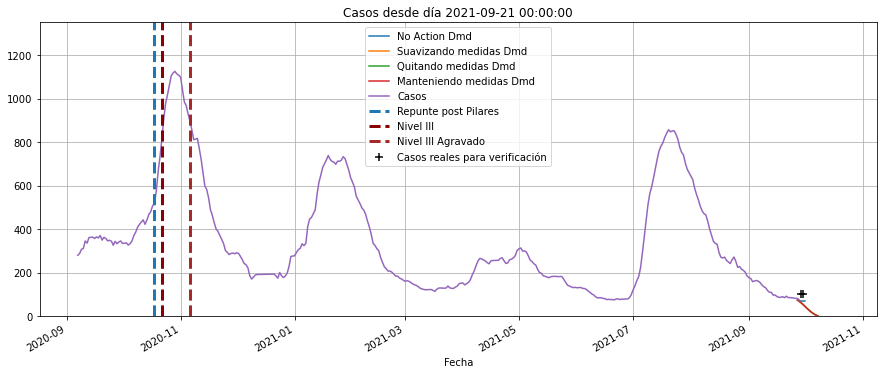

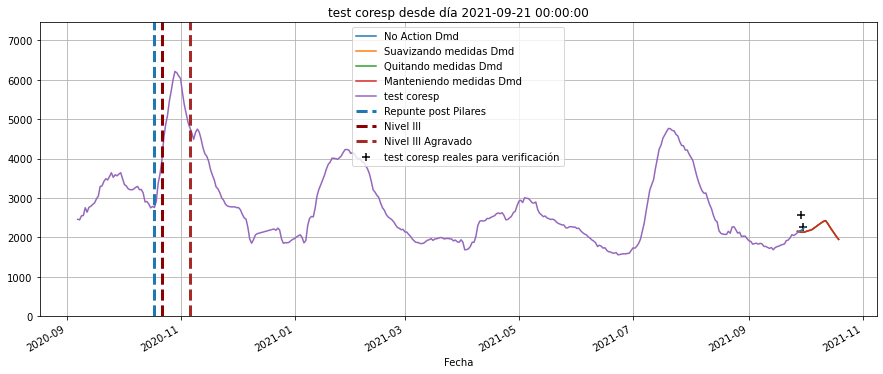

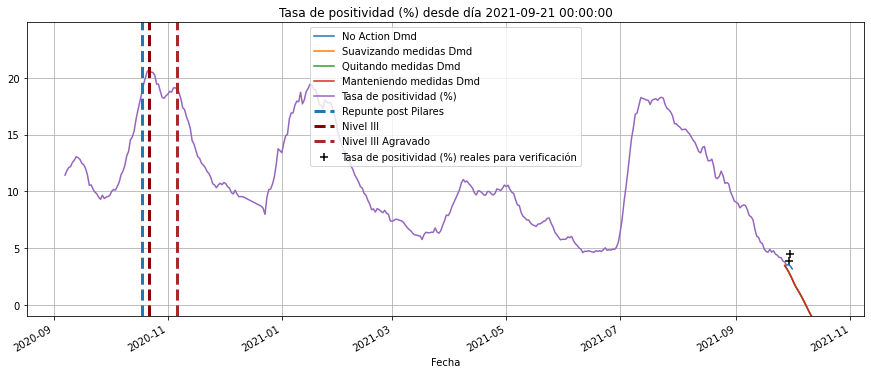

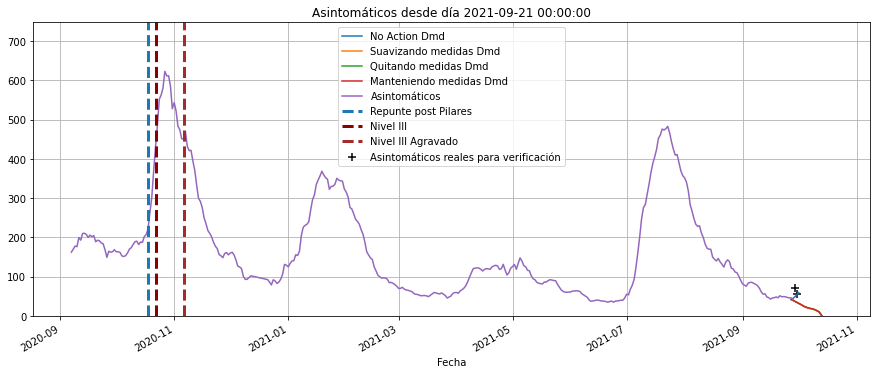

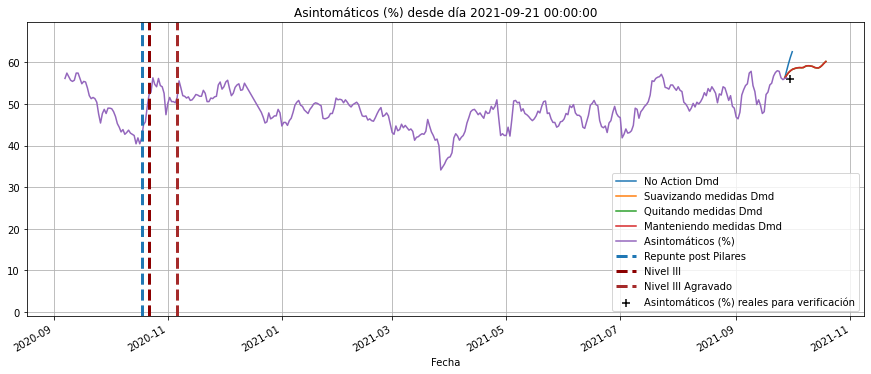

...

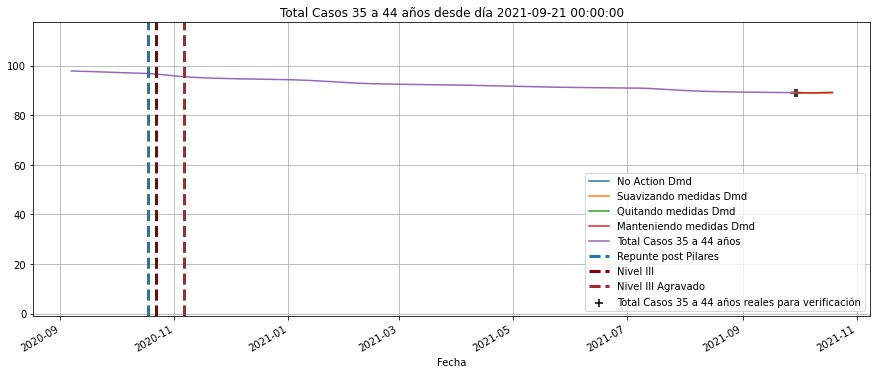

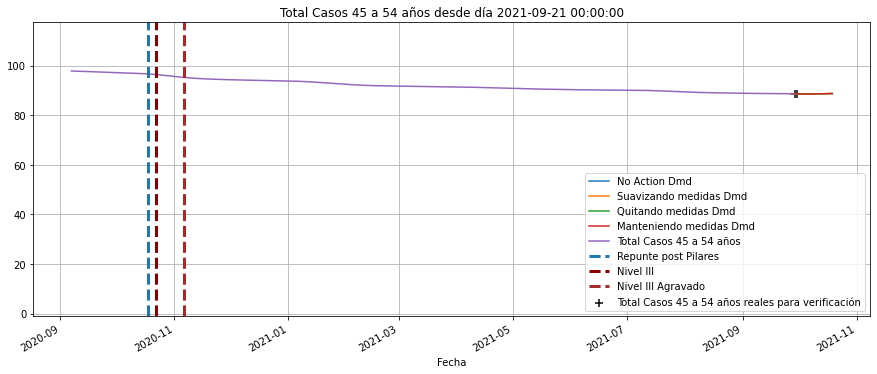

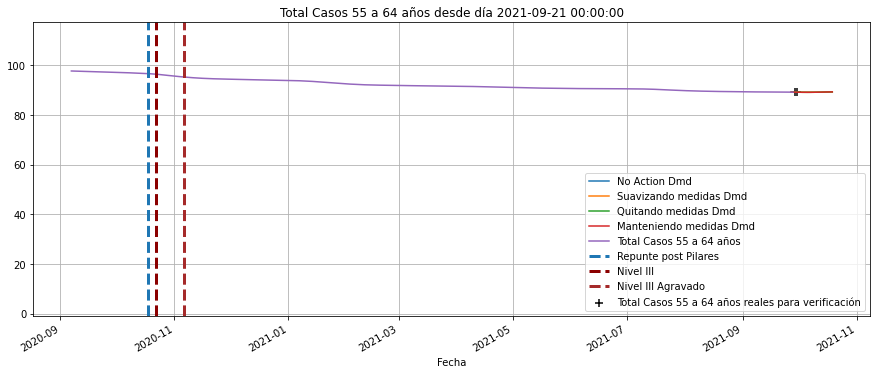

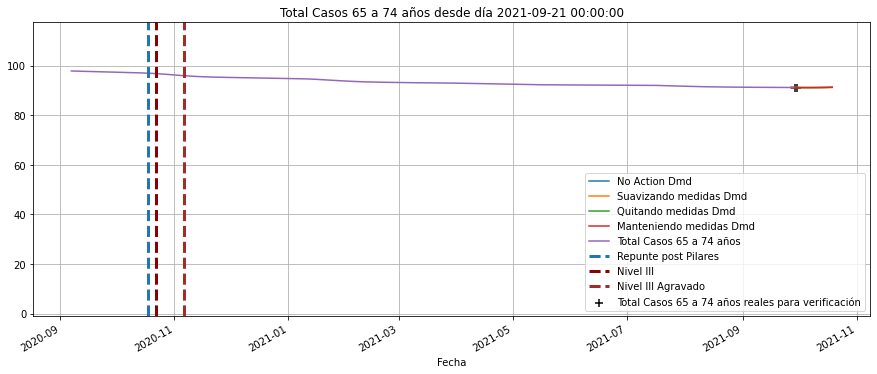

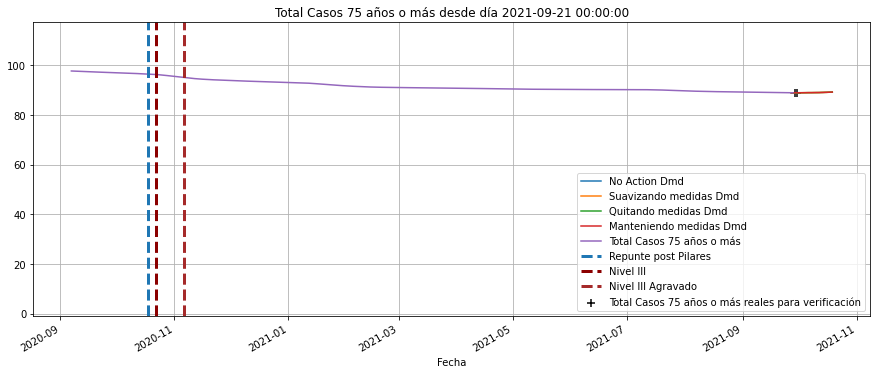

In [44]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    ax.plot(noAction.T.loc[:nuevos.index[-1]].index,
            noAction.T.loc[:nuevos.index[-1]][[i]],axes=ax,label='No Action Dmd')
    ax.plot(kControl.T.index,
            kControl.T[[i]],axes=ax,label='Suavizando medidas Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]],axes=ax,label='Quitando medidas Dmd')
    ax.plot(hard.T.index,
            hard.T[[i]],axes=ax,label='Manteniendo medidas Dmd')
    X_prima.T.shift(0).loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*X_prima.T.loc['2020-9-7':,i].max())
    plt.show()
  

In [45]:
import datetime as datetime

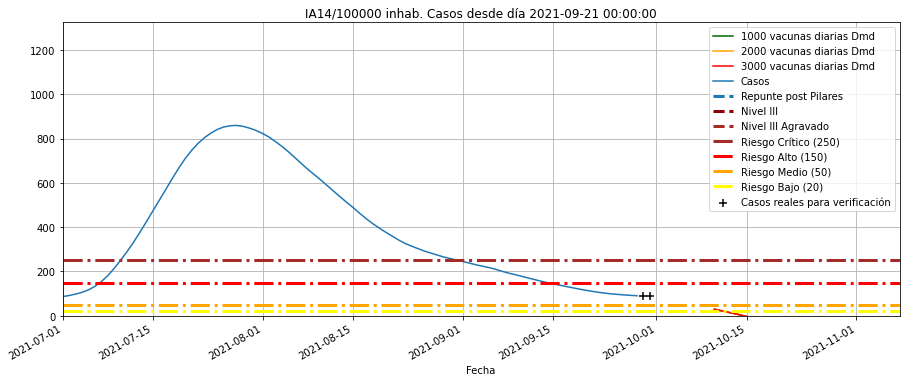

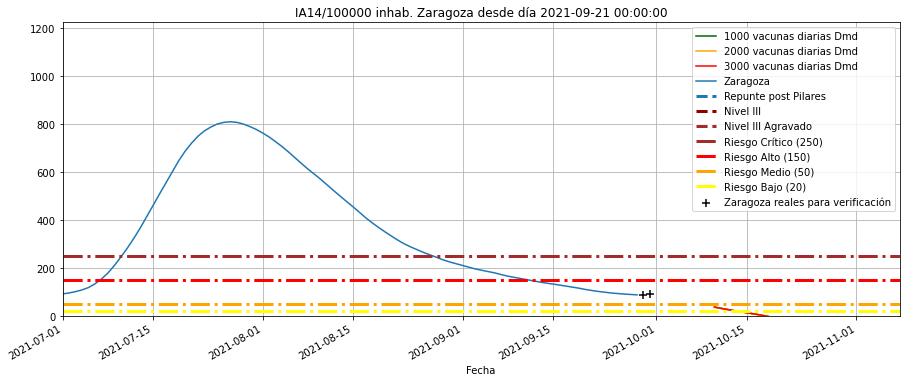

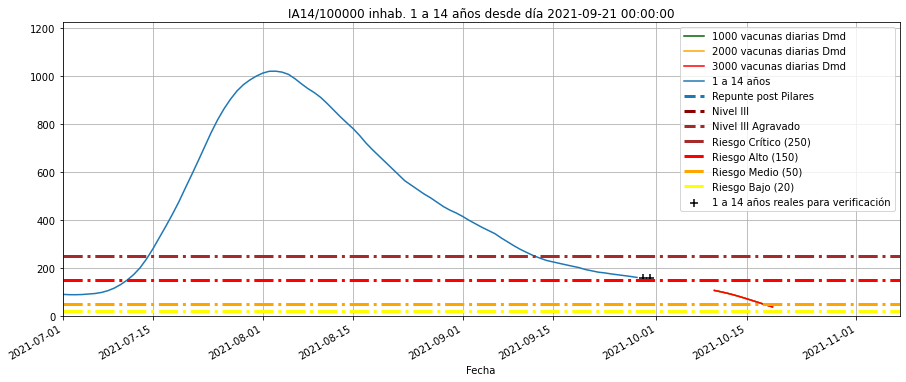

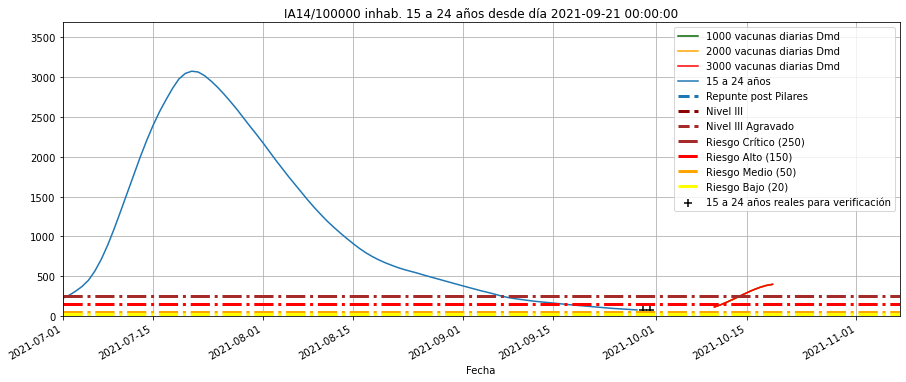

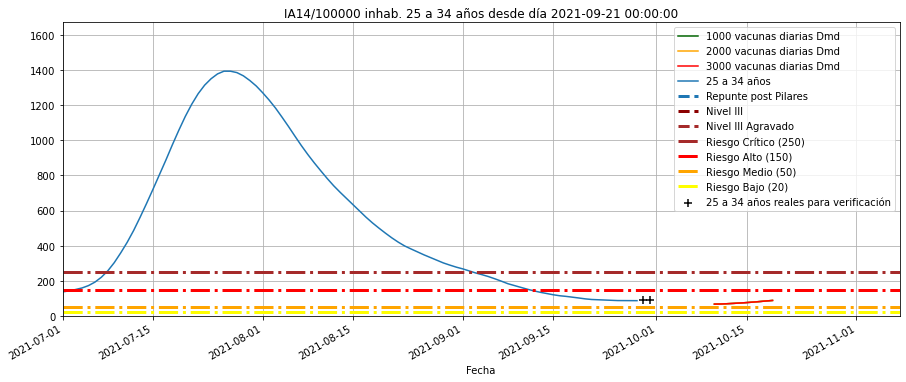

...

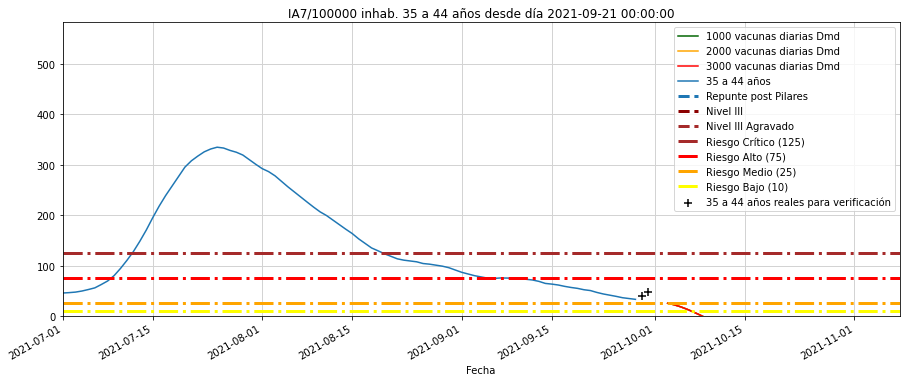

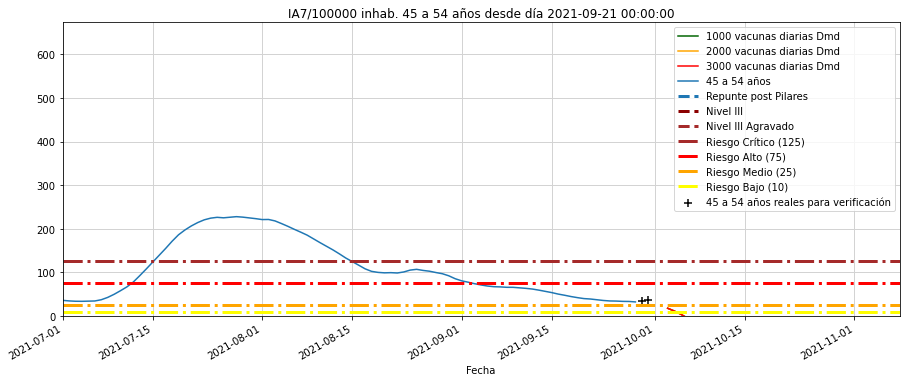

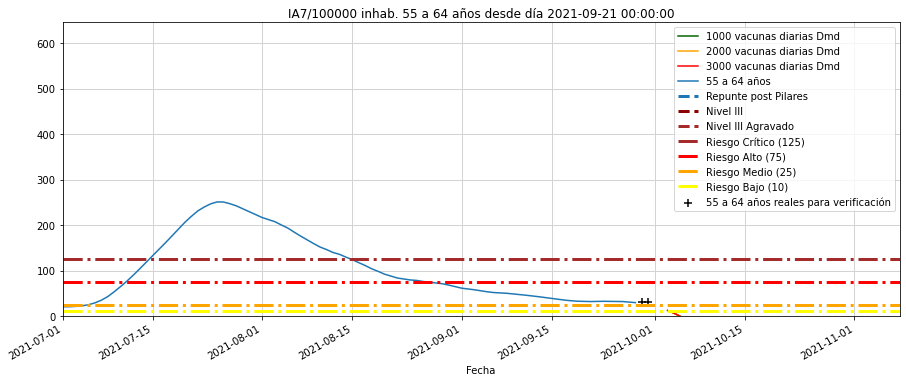

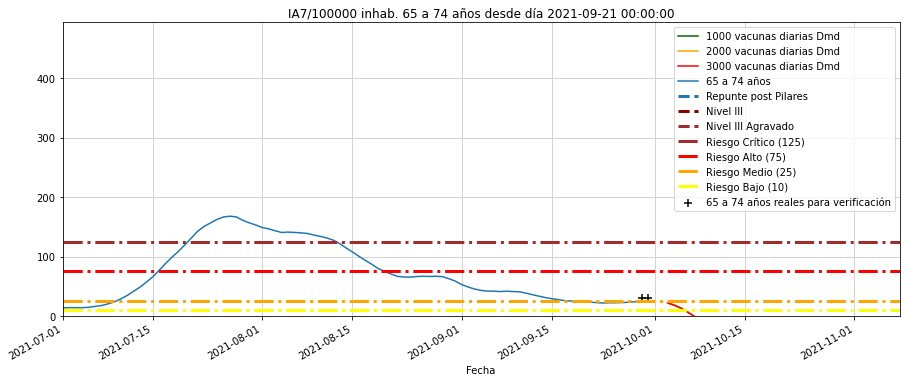

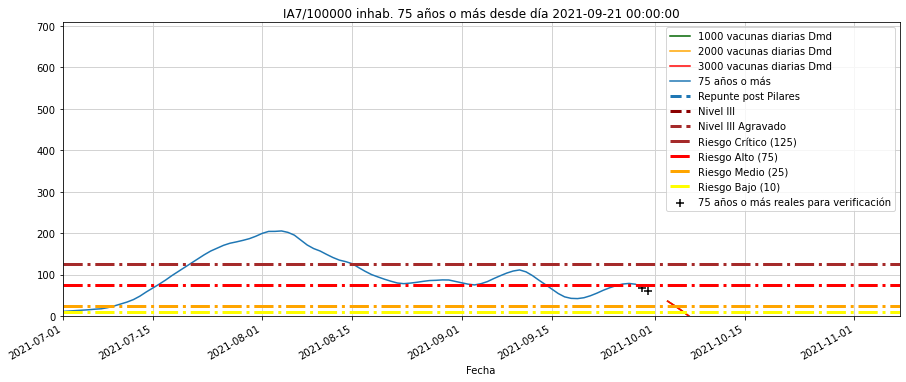

In [46]:
coef = {
    'Casos':13.19,
    #'test coresp':13,
    #'Nº de pacientes a los que se ha realizado pruebas':13,
    #'Asintomáticos':13,
    'Zaragoza':9.6,
    '1 a 14 años':1.58,
    '15 a 24 años':1.24,
    '25 a 34 años':1.42,
    '35 a 44 años':2.01,
    '45 a 54 años':2.06, 
    '55 a 64 años':1.77, 
    '65 a 74 años':1.35,
    '75 años o más':1.50,
}
for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(14,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]
            ).loc[nuevos.index[0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(250,lw=3,ls='-.',c='brown',label='Riesgo Crítico (250)')
    ax.axhline(150,lw=3,ls='-.',c='red',label='Riesgo Alto (150)')
    ax.axhline(50,lw=3,ls='-.',c='orange',label='Riesgo Medio (50)')
    ax.axhline(20,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (20)')
    plt.title("IA14/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    plt.grid()
    plt.ylim(bottom=-1,top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(14,center=False).sum()/coef[i]).max())
    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()

for i in coef.keys():
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #
    #ax.plot(noAction.T.index,
    #        noAction.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed.T.index,
            rellaxed.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl.T.index,
            kControl.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard.T.index,
            hard.T[[i]].rolling(7,center=False).sum()/coef[i],axes=ax,label='3000 vacunas diarias Dmd',c='red')
    (X_prima.T.shift(0).loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #(pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1).T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).plot(ax=ax,label='{}'.format(i))
    #ax.plot(total.loc['2020-9-7':].index,
    #            (total.rolling(14,center=False).sum()/coef[i]).loc['2020-9-7':,[i]],
    #            axes=ax,label='Desde datos diarios'.format(i))
    ax.scatter((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T.loc[nuevos.index[0]:].index,
            ((pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(7,center=False).sum()/coef[i]
            ).loc[nuevos.index[-0]:],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    ax.axhline(125,lw=3,ls='-.',c='brown',label='Riesgo Crítico (125)')
    ax.axhline(75,lw=3,ls='-.',c='red',label='Riesgo Alto (75)')
    ax.axhline(25,lw=3,ls='-.',c='orange',label='Riesgo Medio (25)')
    ax.axhline(10,lw=3,ls='-.',c='yellow',label='Riesgo Bajo (10)')
    plt.title("IA7/100000 inhab. {} desde día {}".format(i,x1.index[0]))
    plt.legend()
    #plt.grid()
    plt.grid(which='minor',axis ='both', linestyle=':', linewidth='0.5', color='lightgrey')
    plt.grid(which='major',axis ='both', linewidth='1', color='lightgrey')
    plt.ylim(bottom=-1,
             top=1.2*(X_prima.T.loc['2020-9-7':,i].rolling(7,center=False).sum()/coef[i]).max())
    plt.ylim(bottom=.0*np.max([0,
                           np.min([total.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().min()/coef[i],
                                   kControl.T.loc[:,i].min()])]),
         top=1.1*np.max([total.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         #nuevos.loc['2020-9-7':,i].rolling(7,center=False).sum().max()/coef[i],
                         kControl.T.loc[:,i].max()]))

    plt.xlim(left=datetime.datetime(2020, 9, 7))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.show()
  

In [47]:
pd.concat([X_prima,nuevos.T.loc[X_prima.index]],axis=1)
#nuevos.T.shift(0).loc[X_prima.index[0]:]
#X_prima
i='Casos'
((pd.concat([diario.T,nuevos.T.loc[X_prima.index]],axis=1)).T[[i]].rolling(14,center=False).sum()/coef[i]).loc[X_prima.T.index[-5]:].round(0)
nuevos.tail()

,Día de la semana,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos,Zaragoza,1 a 14 años,15 a 24 años,25 a 34 años,...,Inoculados,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-09-29,3,100.0,2578.0,1831.0,3.88,71.00,76.0,22.0,5.0,10.0,...,40.735594,87.751745,88.946032,81.244216,86.145686,89.069085,88.610423,89.211199,91.177645,88.942140
2021-09-30,4,101.0,2263.0,1687.0,4.46,56.56,87.0,21.0,5.0,11.0,...,40.513272,87.744090,88.934652,81.240179,86.137924,89.055125,88.602178,89.206675,91.174686,88.938151
2021-10-01,5,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,40.368111,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [48]:
noAction2 = noAction *repartoDiaSemana.loc[noAction.T.index.dayofweek+1,kControl.index].T.values
kControl2 = kControl *repartoDiaSemana.loc[kControl.T.index.dayofweek+1,kControl.index].T.values
rellaxed2 = rellaxed *repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values
hard2 = hard *repartoDiaSemana.loc[hard.T.index.dayofweek+1,kControl.index].T.values
media2 = ((rellaxed.clip(lower=0)+kControl.clip(lower=0)+hard.clip(lower=0))/3.)*repartoDiaSemana.loc[rellaxed.T.index.dayofweek+1,kControl.index].T.values

In [49]:
from matplotlib.dates import HourLocator, MonthLocator, YearLocator, WeekdayLocator

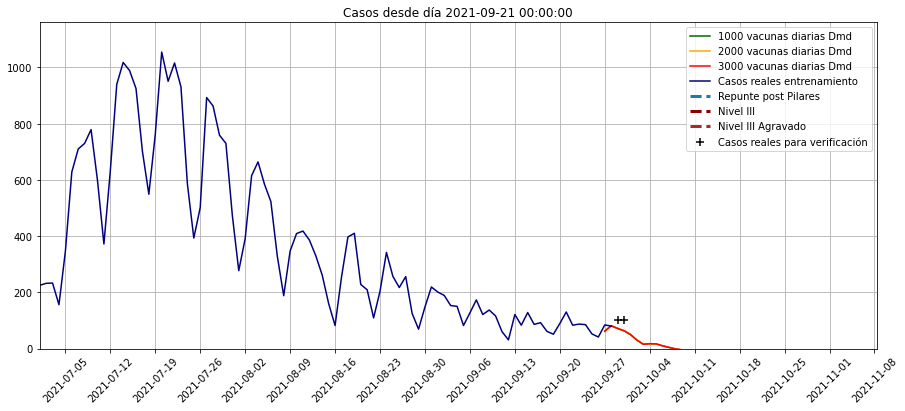

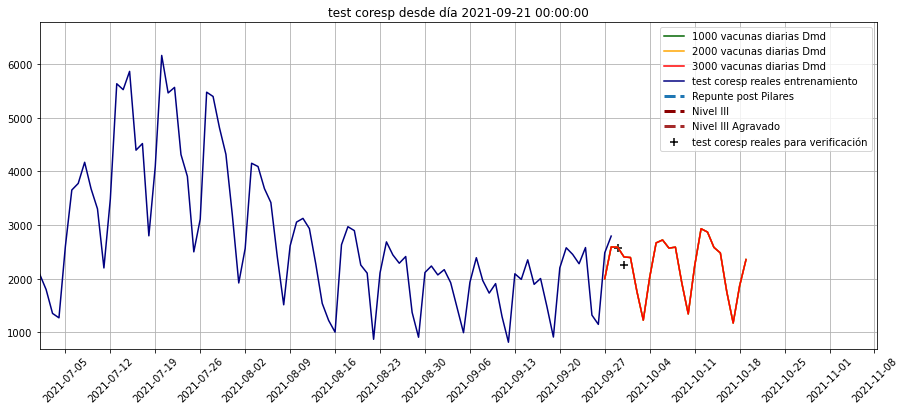

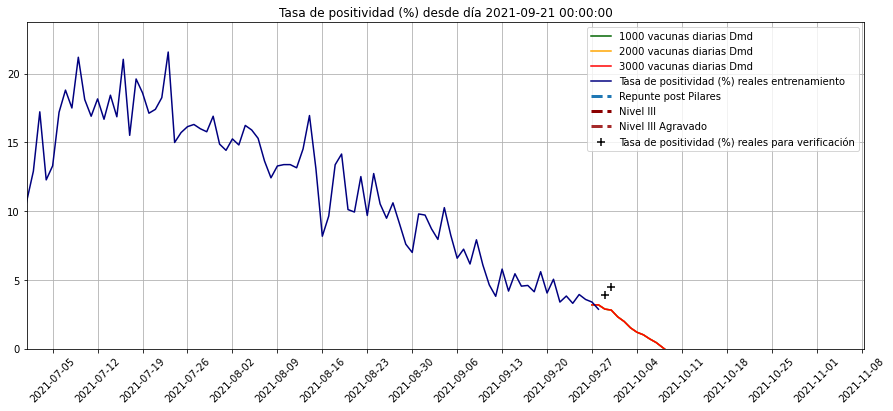

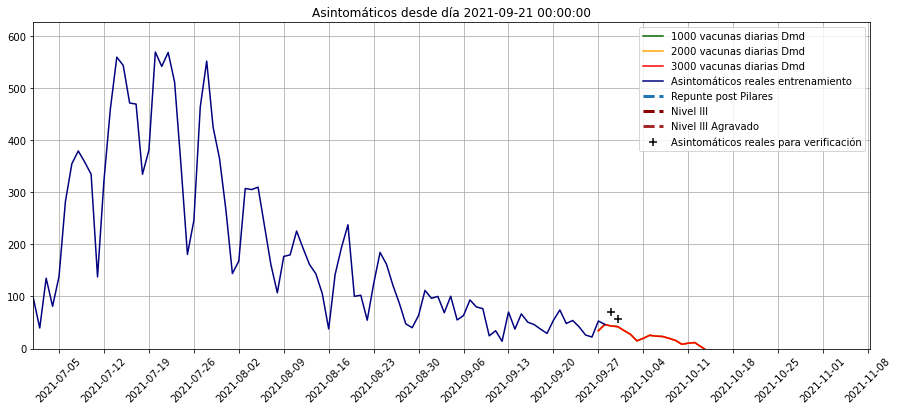

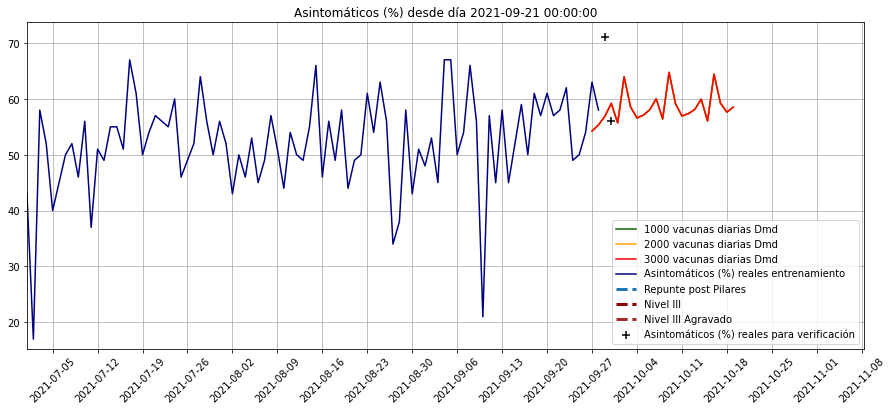

...

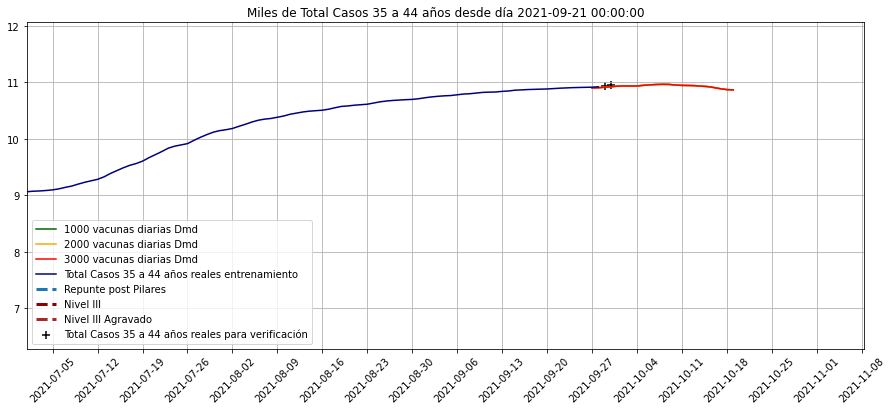

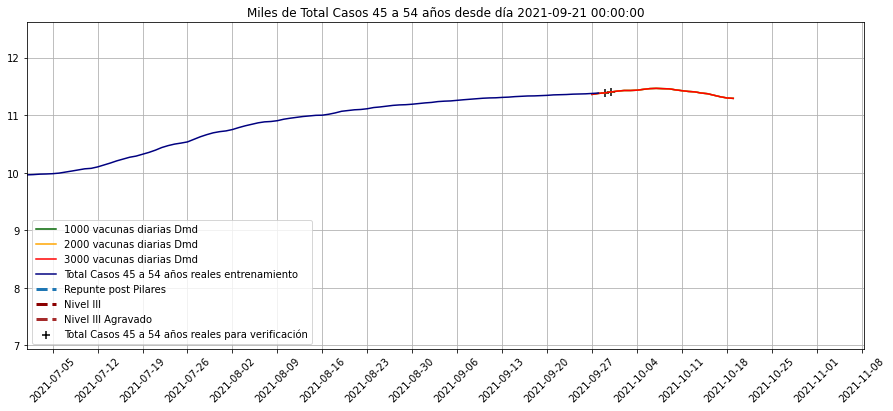

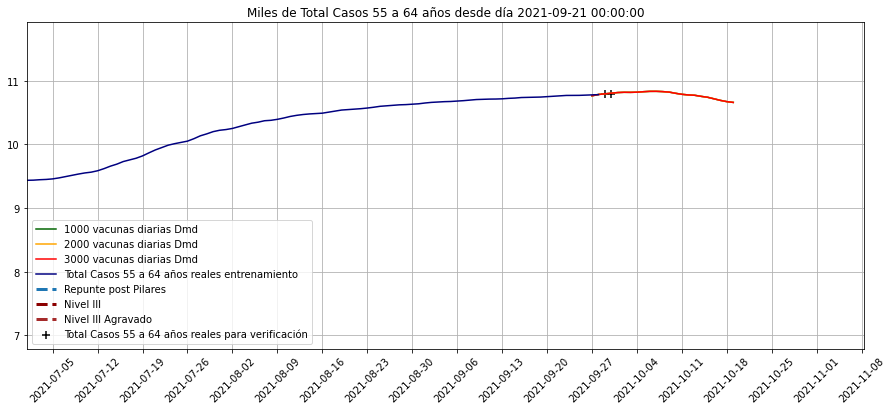

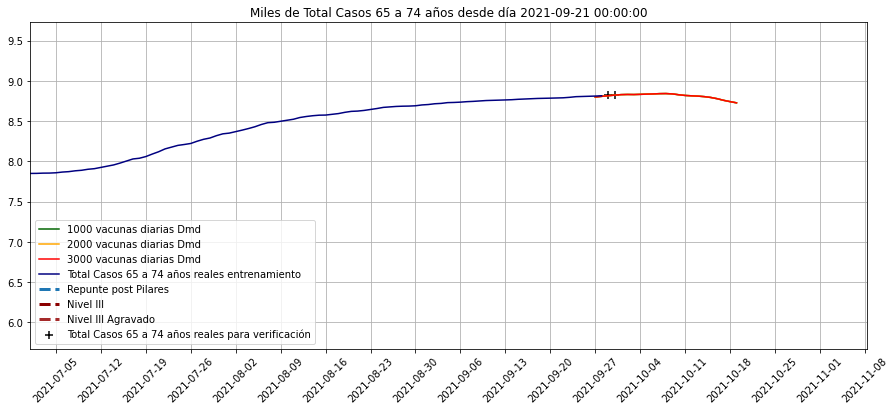

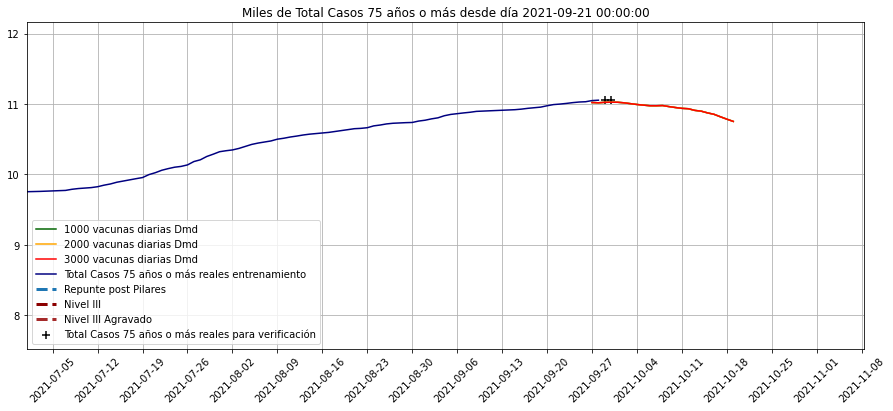

In [50]:
for i in kControl.T.columns[:-9]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=3.0*diario.loc['2021-2':,i].max())
    #plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.75*X_prima.T.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,
                               np.min([diario.loc['2021-2':,i].min(),
                                       #nuevos.loc['2021-2':,i].min(),
                                       kControl2.T.loc['2021-2':,i].min()])]),
             top=1.1*np.max([diario.loc['2021-2':,i].max(),
                                  #nuevos.loc['2021-2':,i].max(),
                                  kControl2.T.loc['2021-2':,i].max()]))


        
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
for i in kControl.T.columns[-9:]:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            100-rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            100-kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            100-hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        100-diario.loc['2020-9-7':,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            100-nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("Miles de {} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=0,top=1.1*diario.loc['2021-2':,i].max())
    plt.ylim(bottom=.9*np.max([0,100-np.max([diario.loc['2021-2':,i].max(),
                                             #nuevos.loc['2021-2':,i].max(),
                                             kControl2.T.loc['2021-2':,i].max()])]),
             top=1.1*(100-np.min([diario.loc['2021-2':,i].min(),
                                  #nuevos.loc['2021-2':,i].min(),
                                  kControl2.T.loc['2021-2':,i].min()])))
    
    plt.xlim(left=pd.Timestamp('2021-2'))
    plt.xlim(left=pd.Timestamp('2021-7'))
    plt.grid()
    
    #plt.grid(which='major',axis ='y', linewidth='1', color='black')
    #plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
    #ax.tick_params(which='both', # Options for both major and minor ticks
    #                top='off', # turn off top ticks
    #                left='off', # turn off left ticks
    #                right='off',  # turn off right ticks
    #                bottom='off') # turn off bottom ticks
    #ax.minorticks_on()
    ax.xaxis.set_major_locator(WeekdayLocator(0))
    
    plt.xticks(rotation=45)
    plt.show()
    

In [51]:
kControl2.index
kControl2.loc['Nº de pacientes a los que se ha realizado pruebas']=0

In [52]:
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas', 
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-20':'2021-10-03'].round(0).astype(int).T.sort_index(ascending=False).to_excel('kControl2.xlsx')
kControl2.loc[['Casos', 'test coresp', 
       'Nº de pacientes a los que se ha realizado pruebas',
               'Tasa de positividad (%)',
       'Asintomáticos (%)', 'Zaragoza', 'UCI ocupadas', 'UCI libres con resp', 'Camas Ocup',
       'Camas libres', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más'],'2021-9-20':'2021-10-03'].round(0).astype(int).T.sort_index(ascending=False)

,Casos,test coresp,Nº de pacientes a los que se ha realizado pruebas,Tasa de positividad (%),Asintomáticos (%),Zaragoza,UCI ocupadas,UCI libres con resp,Camas Ocup,Camas libres,1 a 14 años,15 a 24 años,25 a 34 años,35 a 44 años,45 a 54 años,55 a 64 años,65 a 74 años,75 años o más
2021-10-03,15,1227,0,2,59,13,23,102,87,1538,6,0,3,2,0,-1,1,1
2021-10-02,30,1767,0,2,64,26,23,94,87,1581,13,-1,5,5,1,0,3,3
2021-10-01,50,2395,0,2,56,40,24,94,88,1569,17,-2,8,8,5,2,5,7
2021-09-30,63,2405,0,3,59,50,24,92,94,1426,17,-1,9,9,7,5,6,10
2021-09-29,71,2588,0,3,57,56,24,94,96,1391,17,1,9,10,9,6,6,11
2021-09-28,81,2592,0,3,55,61,25,95,98,1385,18,4,10,11,10,7,6,14
2021-09-27,62,1999,0,3,54,41,25,97,100,1413,10,4,7,8,8,6,5,11


In [53]:
kControl2.T.head()

,Casos,test coresp,Tasa de positividad (%),Asintomáticos,Asintomáticos (%),Zaragoza,Zaragoza (%),1 a 14 años,15 a 24 años,25 a 34 años,...,Total Casos,Total Casos 1 a 14 años,Total Casos 15 a 24 años,Total Casos 25 a 34 años,Total Casos 35 a 44 años,Total Casos 45 a 54 años,Total Casos 55 a 64 años,Total Casos 65 a 74 años,Total Casos 75 años o más,Nº de pacientes a los que se ha realizado pruebas
2021-09-27,61.771678,1999.445351,3.176265,34.177924,54.238162,41.230089,67.603593,10.473848,4.262216,7.043654,...,87.772227,88.989490,81.276602,86.180725,89.100607,88.640009,89.235300,91.201781,88.978370,0.0
2021-09-28,80.941001,2592.077350,3.178159,46.134124,55.325088,60.639917,74.011527,18.289349,4.226739,9.800194,...,87.763668,88.980282,81.261948,86.177426,89.096143,88.622775,89.214291,91.193696,88.982326,0.0
2021-09-29,71.487387,2588.424373,2.868903,43.190684,56.880687,55.880974,75.760718,17.392431,1.097032,9.041148,...,87.757884,88.969016,81.249795,86.171259,89.087655,88.612934,89.204176,91.185871,88.975746,0.0
2021-09-30,63.206417,2405.393003,2.797518,42.150488,59.202860,49.791497,75.360553,17.435985,-1.309440,8.671133,...,87.752306,88.958731,81.237452,86.162823,89.078341,88.596977,89.193854,91.178683,88.974190,0.0
2021-10-01,49.969758,2395.407757,2.306267,34.483528,55.692727,39.948987,75.525113,16.567228,-2.191412,7.740228,...,87.747066,88.947858,81.226430,86.156033,89.068217,88.581948,89.183994,91.172243,88.974984,0.0


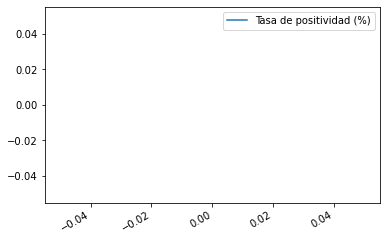

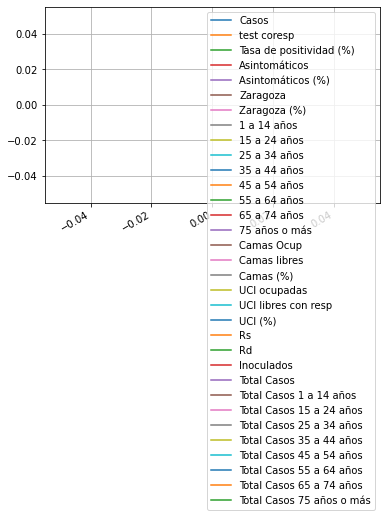

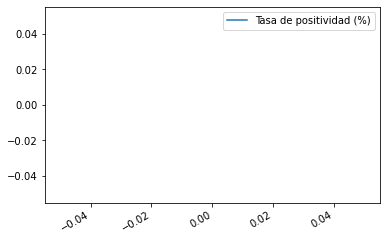

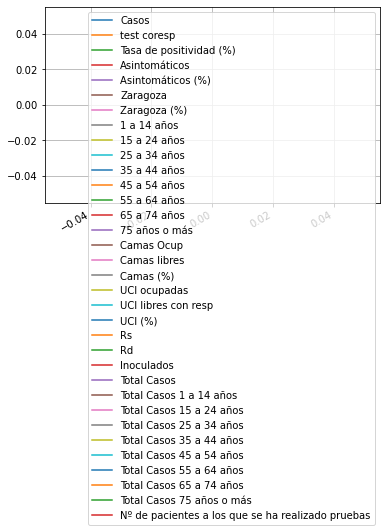

In [54]:
hard2.T.loc['2020-10-1':'2021-3-27',['Tasa de positividad (%)']].plot()
(hard2.T.loc['2020-10-1':'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()
plt.show()
kControl2.T.loc[:'2021-3-27',['Tasa de positividad (%)']].plot()
(kControl2.T.loc[:'2021-3-27'].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)).plot()
plt.grid()#goto

In [55]:
diario.loc['2020-10-1':].apply(lambda x: 100.*x.Casos/x['test coresp'],axis=1)

Fecha
2020-10-01    10.849057
2020-10-02    10.931583
2020-10-03    10.202768
2020-10-04    12.485459
2020-10-05    11.167315
                ...    
2021-09-24     3.293297
2021-09-25     3.933434
2021-09-26     3.568320
2021-09-27     3.381643
2021-09-28     2.862254
Length: 363, dtype: float64

<AxesSubplot:xlabel='Fecha'>

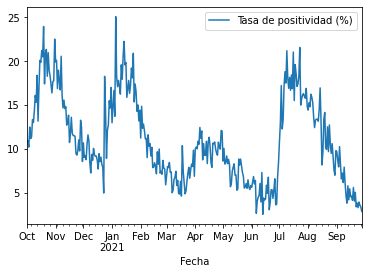

In [56]:
diario.loc['2020-10-1':,['Tasa de positividad (%)']].plot()

In [57]:
((kControl2.T-nuevos)*100./nuevos).dropna(axis=0,how='all').dropna(axis=1,how='all').describe().T

,count,mean,std,min,25%,50%,75%,max
1 a 14 años,2.0,-18.957498,2.808624,-20.943495,-19.950496,-18.957498,-17.964499,-16.971501
15 a 24 años,2.0,-102.124082,34.032648,-126.188798,-114.156440,-102.124082,-90.091724,-78.059366
25 a 34 años,2.0,-15.380017,8.190418,-21.171517,-18.275767,-15.380017,-12.484267,-9.588517
35 a 44 años,2.0,-60.796355,9.548924,-67.548464,-64.172410,-60.796355,-57.420301,-54.044246
45 a 54 años,2.0,-44.502696,19.061618,-57.981295,-51.241996,-44.502696,-37.763397,-31.024097
55 a 64 años,2.0,-41.018561,1.548900,-42.113799,-41.566180,-41.018561,-40.470942,-39.923324
65 a 74 años,2.0,3.358529,70.341500,-46.380423,-21.510947,3.358529,28.228004,53.097480
75 años o más,2.0,91.324047,38.152941,64.345844,77.834945,91.324047,104.813149,118.302251
Asintomáticos,2.0,-32.322278,9.681384,-39.168050,-35.745164,-32.322278,-28.899392,-25.476506
Asintomáticos (%),2.0,-7.083481,18.105999,-19.886356,-13.484919,-7.083481,-0.682044,5.719393


In [58]:
nuevos['Nº de pacientes a los que se ha realizado pruebas']

Fecha
2021-09-29    1831.0
2021-09-30    1687.0
2021-10-01       NaN
Name: Nº de pacientes a los que se ha realizado pruebas, dtype: float64

<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

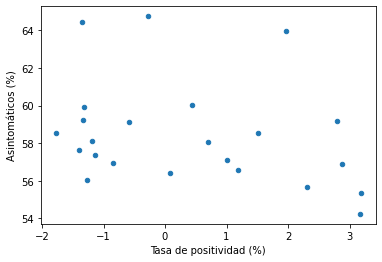

In [59]:
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter')

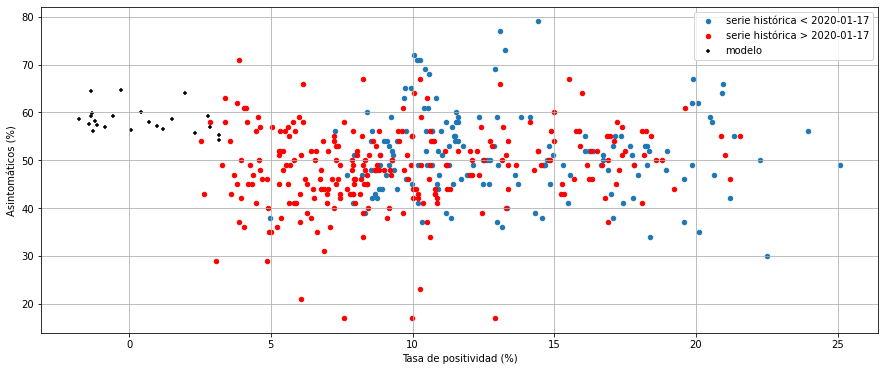

In [60]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-01-17',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-01-17',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [61]:
kControl2.T.columns

Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más',
       'Nº de pacientes a los que se ha realizado pruebas'],
      dtype='object')

In [62]:
total.T

Fecha,2020-08-14,2020-08-15,2020-08-16,2020-08-17,2020-08-18,2020-08-19,2020-08-20,2020-08-21,2020-08-22,2020-08-23,...,2021-09-22,2021-09-23,2021-09-24,2021-09-25,2021-09-26,2021-09-27,2021-09-28,2021-09-29,2021-09-30,2021-10-01
Día de la semana,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000,6.000000,7.000000,...,3.000000,4.000000e+00,5.000000,6.000000,7.000000,1.000000,2.000000,3.000000,4.000000e+00,5.000000
Casos,624.000000,482.000000,390.000000,396.000000,467.000000,347.000000,3.570000e+02,272.000000,493.000000,230.000000,...,83.000000,8.700000e+01,85.000000,52.000000,41.000000,84.000000,80.000000,100.000000,1.010000e+02,NaN
test coresp,4177.000000,3243.000000,3158.000000,3408.000000,4029.000000,3027.000000,3.191000e+03,2796.000000,4546.000000,1997.000000,...,2454.000000,2.279000e+03,2581.000000,1322.000000,1149.000000,2484.000000,2795.000000,2578.000000,2.263000e+03,NaN
Nº de pacientes a los que se ha realizado pruebas,3481.000000,1907.000000,1168.000000,3189.000000,3580.000000,2963.000000,3.219000e+03,2821.000000,1392.000000,617.000000,...,1969.000000,1.717000e+03,1755.000000,911.000000,668.000000,1881.000000,1889.000000,1831.000000,1.687000e+03,NaN
Tasa de positividad (%),14.940000,14.860000,12.350000,11.620000,11.590000,11.460000,1.119000e+01,9.730000,10.840000,11.520000,...,3.380000,3.820000e+00,3.290000,3.930000,3.570000,3.380000,2.860000,3.880000,4.460000e+00,NaN
Asintomáticos,318.240000,216.900000,230.100000,233.640000,270.860000,190.850000,2.070600e+02,176.800000,310.590000,138.000000,...,48.140000,5.394000e+01,41.650000,26.000000,22.140000,52.920000,46.400000,71.000000,5.656000e+01,NaN
Zaragoza,541.000000,428.000000,338.000000,307.000000,394.000000,262.000000,2.800000e+02,217.000000,412.000000,191.000000,...,67.000000,6.100000e+01,59.000000,45.000000,29.000000,51.000000,62.000000,76.000000,8.700000e+01,NaN
1 a 14 años,96.000000,67.000000,53.000000,51.000000,49.000000,46.000000,4.600000e+01,41.000000,58.000000,21.000000,...,18.000000,1.900000e+01,13.000000,12.000000,11.000000,14.000000,14.000000,22.000000,2.100000e+01,NaN
15 a 24 años,78.000000,51.000000,54.000000,41.000000,50.000000,42.000000,4.200000e+01,29.000000,59.000000,28.000000,...,8.000000,8.000000e+00,4.000000,4.000000,2.000000,5.000000,7.000000,5.000000,5.000000e+00,NaN
25 a 34 años,85.000000,64.000000,38.000000,40.000000,72.000000,58.000000,5.800000e+01,44.000000,47.000000,25.000000,...,9.000000,6.000000e+00,17.000000,4.000000,3.000000,10.000000,10.000000,10.000000,1.100000e+01,NaN


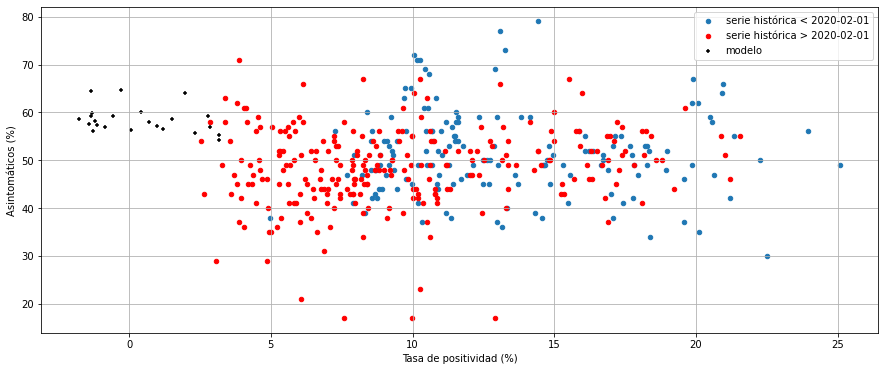

In [63]:
fig, ax = plt.subplots(figsize=(15,6))
total.loc[:'2021-01-17'].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica < 2020-02-01',ax=ax,marker='o')
total.loc['2021-01-17':].plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',
                              kind='scatter',label='serie histórica > 2020-02-01',ax=ax,c='r',marker='o')
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',label='modelo',ax=ax,
                 c='k',marker='+')
plt.grid()

In [64]:
def histogram_intersection(a, b):
    v = np.minimum(a, b).sum().round(decimals=1)
    return v

total[['Tasa de positividad (%)','Asintomáticos (%)']].corr(min_periods=2)


,Tasa de positividad (%),Asintomáticos (%)
Tasa de positividad (%),1.000000,0.127104
Asintomáticos (%),0.127104,1.000000


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

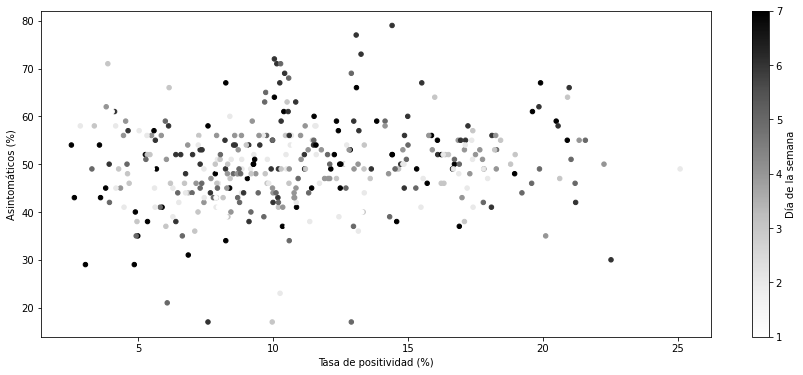

In [65]:
fig, ax = plt.subplots(figsize=(15,6))
total.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

In [66]:
kControl2.loc['Día de la semana',:] = pd.to_datetime(kControl2.columns.values).weekday+1

In [67]:
kControl2

,2021-09-27,2021-09-28,2021-09-29,2021-09-30,2021-10-01,2021-10-02,2021-10-03,2021-10-04,2021-10-05,2021-10-06,...,2021-10-10,2021-10-11,2021-10-12,2021-10-13,2021-10-14,2021-10-15,2021-10-16,2021-10-17,2021-10-18,2021-10-19
Casos,61.771678,80.941001,71.487387,63.206417,49.969758,30.231364,15.267967,17.222739,16.603880,9.699125,...,-5.164819,-10.503293,-17.556276,-29.417055,-41.939791,-50.909306,-46.818663,-36.619187,-66.589663,-111.615118
test coresp,1999.445351,2592.077350,2588.424373,2405.393003,2395.407757,1767.142807,1227.241099,2028.464143,2668.326678,2722.818731,...,1343.543283,2238.195084,2932.347411,2870.155246,2584.279828,2480.776154,1757.811266,1174.029288,1865.680357,2357.973633
Tasa de positividad (%),3.176265,3.178159,2.868903,2.797518,2.306267,1.970653,1.504879,1.185870,0.999601,0.696273,...,-0.579721,-0.843362,-1.137494,-1.193566,-1.310488,-1.269606,-1.353050,-1.339891,-1.406878,-1.770035
Asintomáticos,34.177924,46.134124,43.190684,42.150488,34.483528,27.326038,14.779611,19.656882,25.518200,23.731347,...,8.238496,10.247041,11.509439,3.351884,-4.405117,-9.572110,-11.729102,-8.400225,-14.035377,-22.246219
Asintomáticos (%),54.238162,55.325088,56.880687,59.202860,55.692727,63.972111,58.557383,56.584726,57.091004,58.066959,...,59.141565,56.952379,57.348541,58.109020,59.942845,56.040343,64.433833,59.245424,57.625469,58.524758
Zaragoza,41.230089,60.639917,55.880974,49.791497,39.948987,25.615510,12.638146,14.435759,17.475827,13.084938,...,2.555739,3.176233,5.414444,1.439399,-2.980987,-8.310936,-11.644903,-10.848954,-21.637518,-45.961579
Zaragoza (%),67.603593,74.011527,75.760718,75.360553,75.525113,78.334470,73.878186,68.867375,75.359159,76.973856,...,76.324340,71.141190,77.953456,80.279338,80.399436,80.997424,84.483011,80.020071,74.860216,82.175592
1 a 14 años,10.473848,18.289349,17.392431,17.435985,16.567228,12.734505,6.202958,9.184482,14.993256,13.050957,...,3.067691,4.065652,6.085245,4.050893,2.626959,1.325585,0.292234,-0.171047,-0.697701,-1.986675
15 a 24 años,4.262216,4.226739,1.097032,-1.309440,-2.191412,-1.140845,0.044765,2.095710,8.142154,16.044855,...,18.577916,32.672810,54.228213,58.655398,59.408486,53.594706,35.461746,19.917138,25.706953,30.321185
25 a 34 años,7.043654,9.800194,9.041148,8.671133,7.740228,5.157572,3.051457,4.473553,6.351959,6.512786,...,4.523942,7.918162,12.555565,12.211294,12.316375,11.808805,8.412523,5.365310,8.283919,11.617331


<AxesSubplot:xlabel='Tasa de positividad (%)', ylabel='Asintomáticos (%)'>

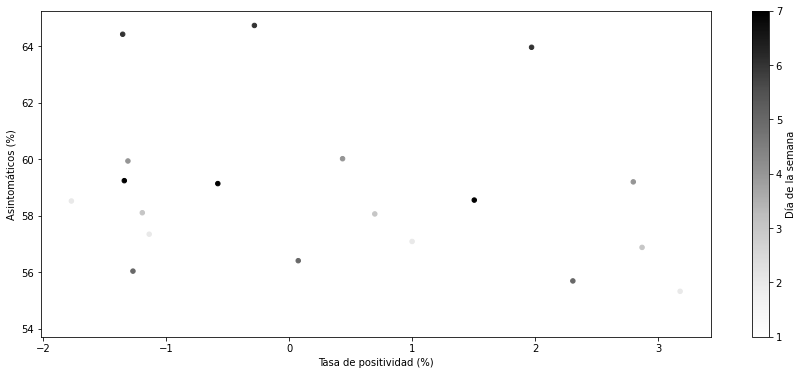

In [68]:
fig, ax = plt.subplots(figsize=(15,6))
kControl2.T.plot(x='Tasa de positividad (%)',y='Asintomáticos (%)',kind='scatter',c='Día de la semana',ax=ax)

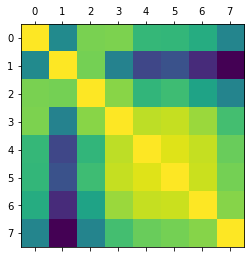

Index(['Día de la semana', 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos', 'Zaragoza', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'UCI ocupadas', 'UCI libres con resp', 'Alarma',
       'Asintomáticos (%)', 'Zaragoza (%)', 'UCI/Camas (%)', 'Camas/UCI',
       'Casos/Camas', 'Camas/Casos', 'Camas (%)', 'UCI (%)', 'Día', 'Rs', 'Rd',
       'Bias', 'Festivo', 'Lectivo', 'Laboral', 'NoLaboral', 'NoLectivo',
       'Reuniones', 'VacunasD', 'Vacunas', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [69]:
plt.matshow(total[[ '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más']].corr())
plt.show()
total.columns

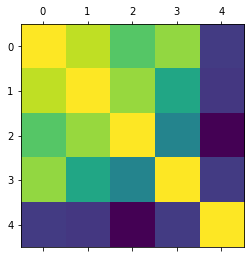

In [70]:
plt.matshow(total[[ 'Casos', 'test coresp',
       'Nº de pacientes a los que se ha realizado pruebas',
       'Tasa de positividad (%)', 'Asintomáticos (%)']].corr(min_periods=21))
plt.show()

(1.0, 28.0)

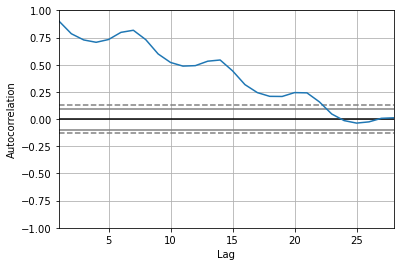

In [71]:
s = diario.Casos
pd.plotting.autocorrelation_plot(s)
plt.xlim(right=28)

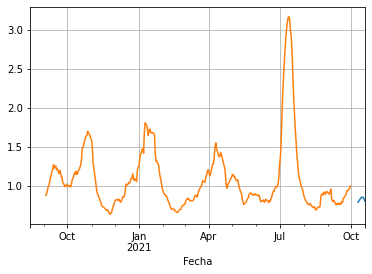

In [72]:
kControl2.T.Rd.rolling(14).mean().plot()
total.Rd.rolling(14).mean().plot()
plt.grid()

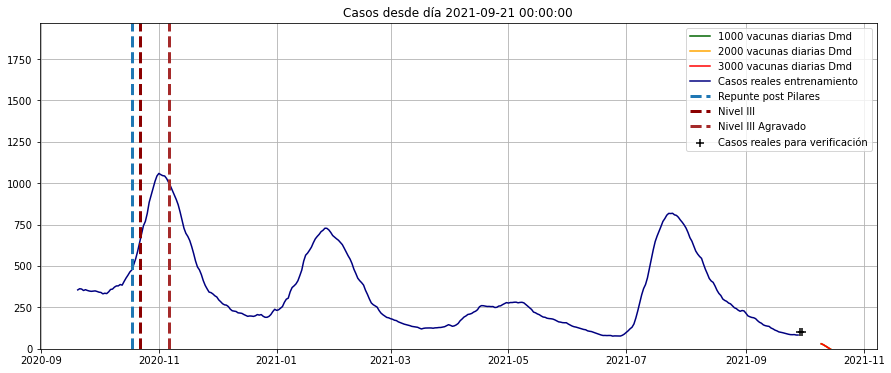

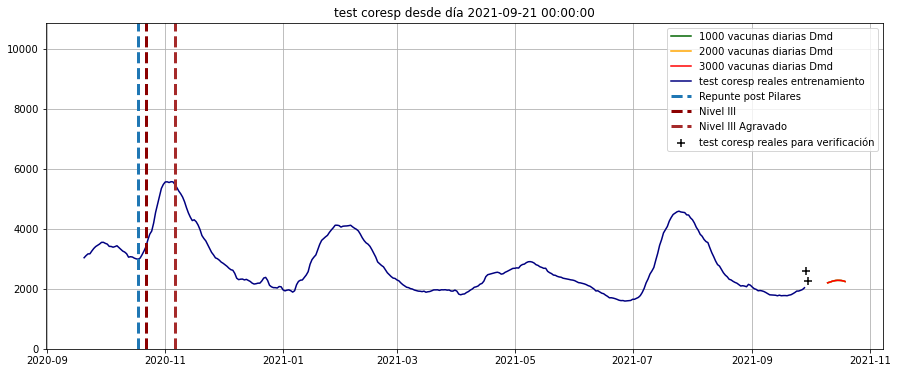

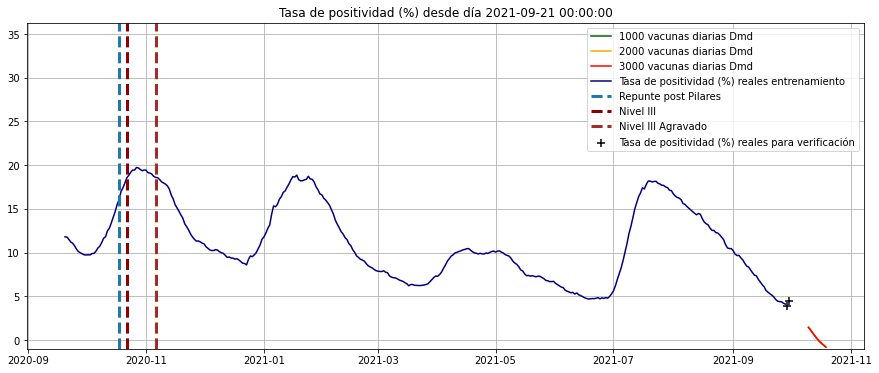

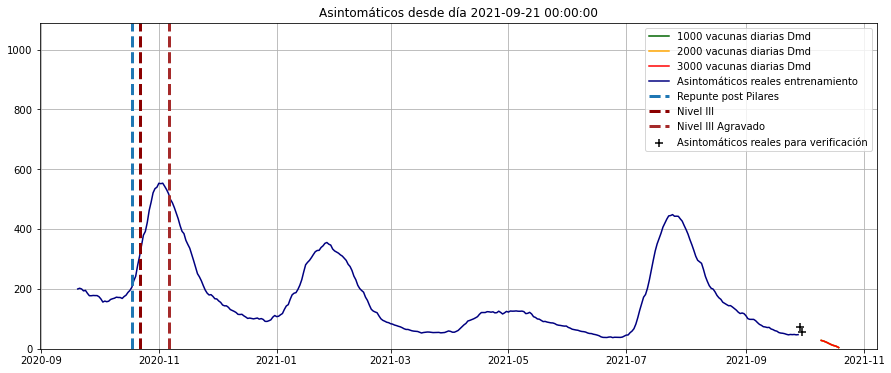

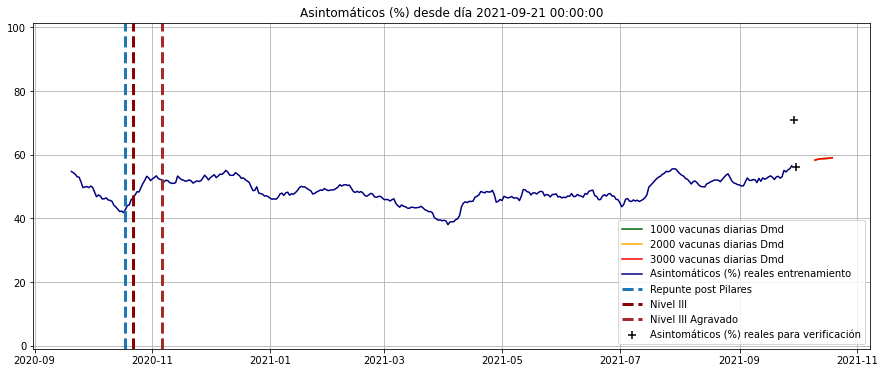

...

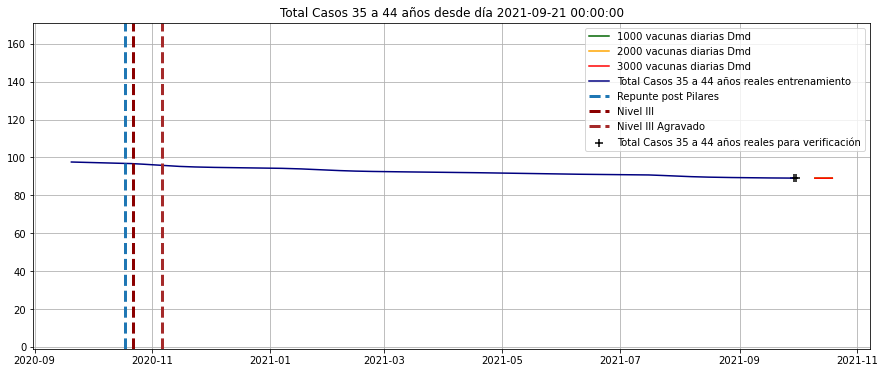

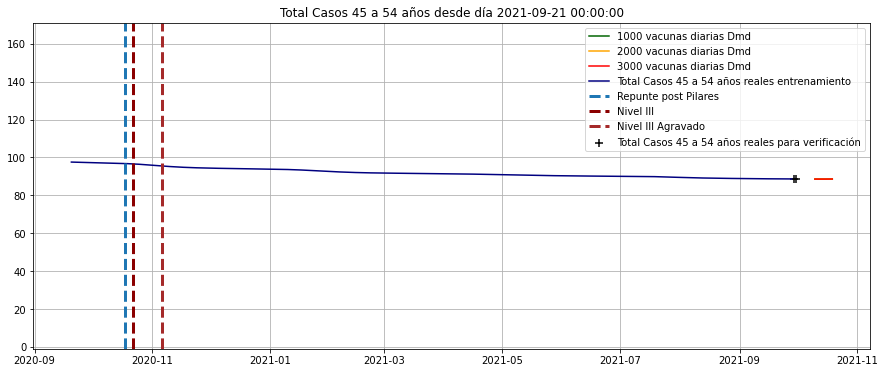

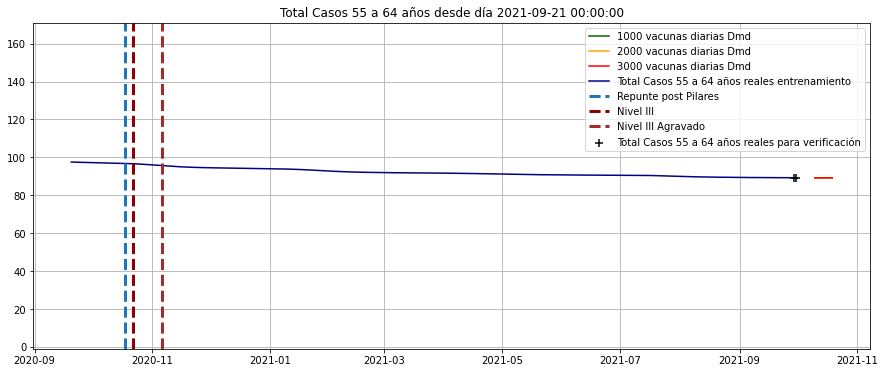

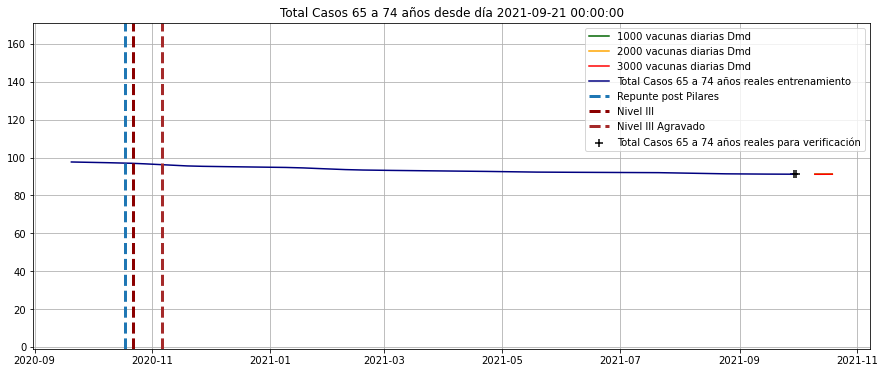

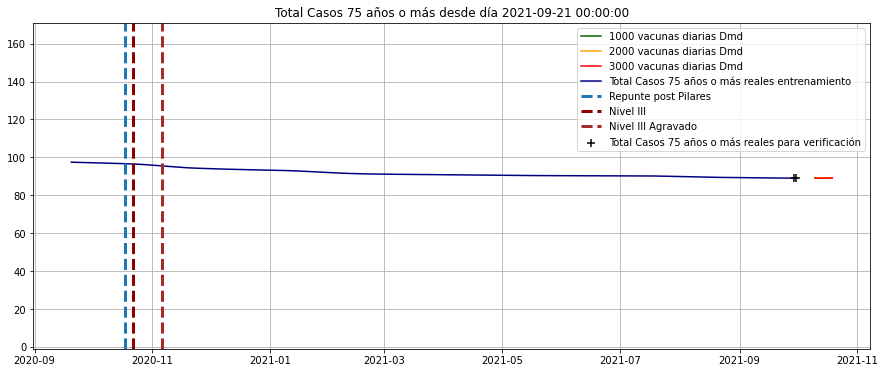

In [73]:
for i in kControl.T.columns:
    
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]].rolling(14).mean(),axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]].rolling(14).mean(),axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]].rolling(14).mean(),axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc['2020-9-7':].index,
        diario.loc['2020-9-7':,[i]].rolling(14).mean(),axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc['2020-9-7':].index,
            nuevos.loc['2020-9-7':,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=-1,top=1.75*X_prima.T.loc['2020-9-7':,i].max())
    plt.grid()
    plt.show()

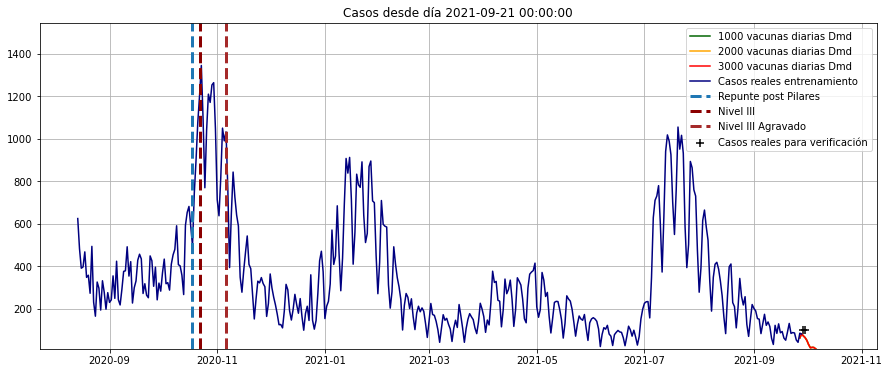

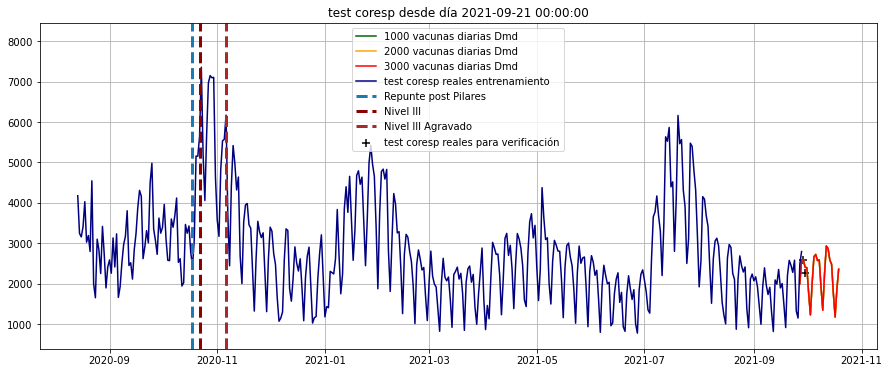

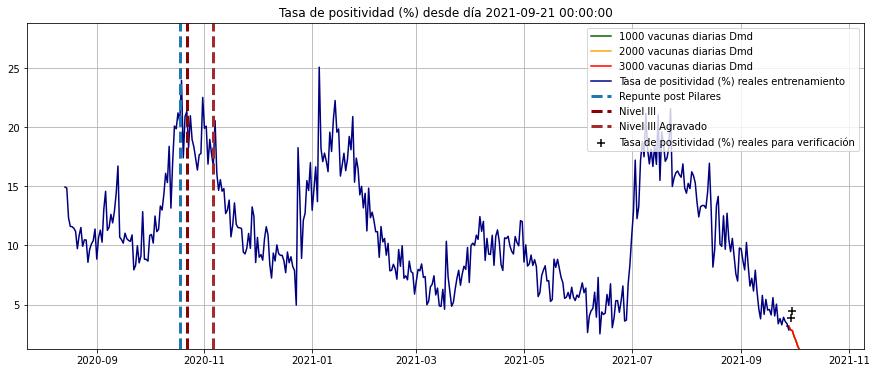

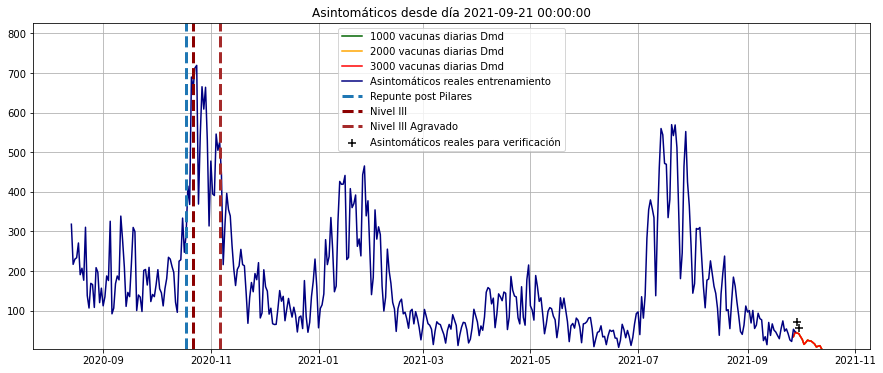

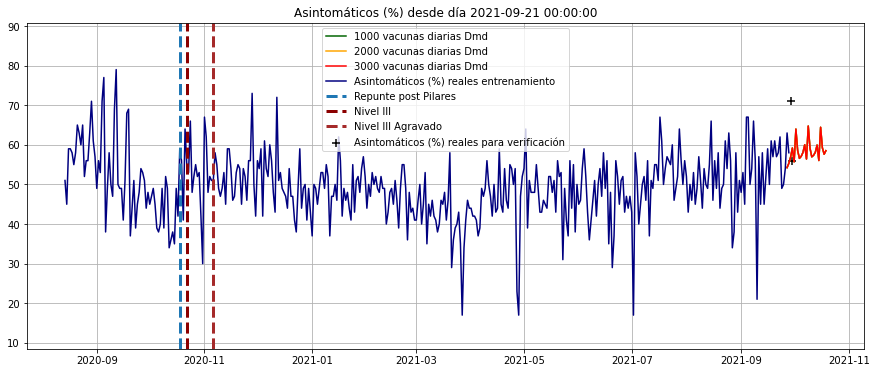

...

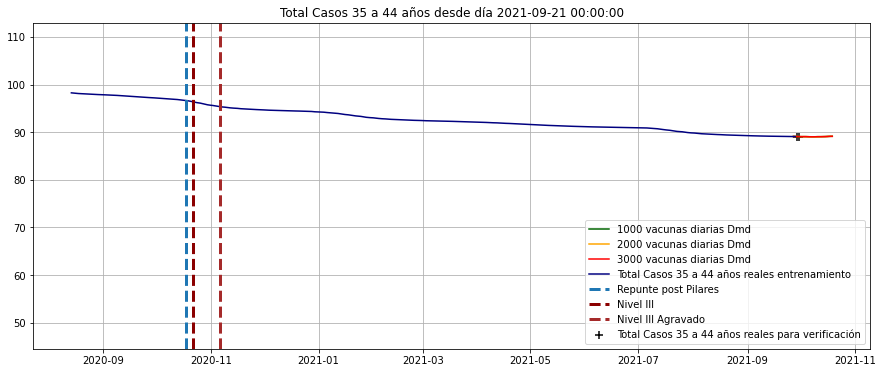

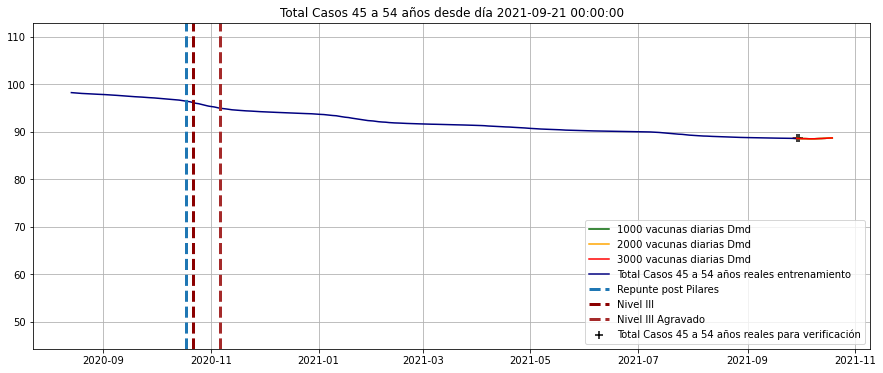

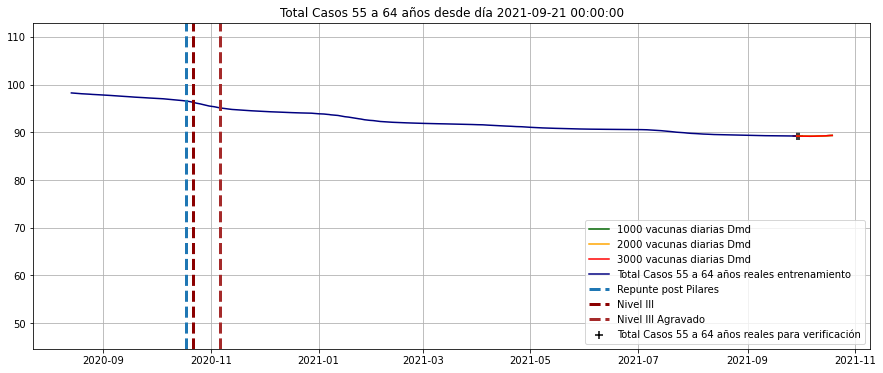

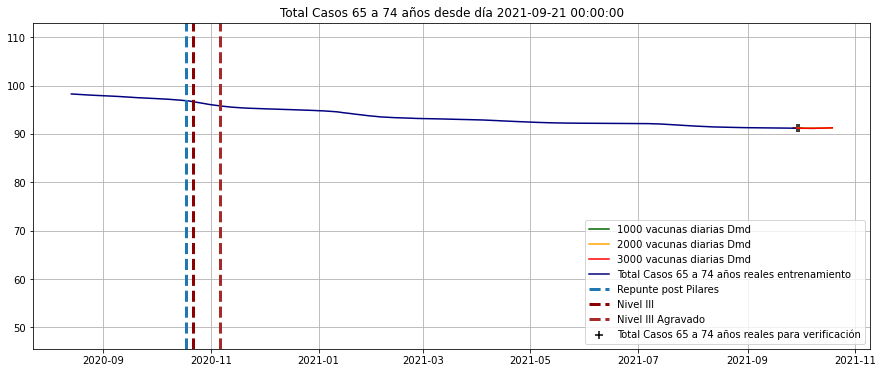

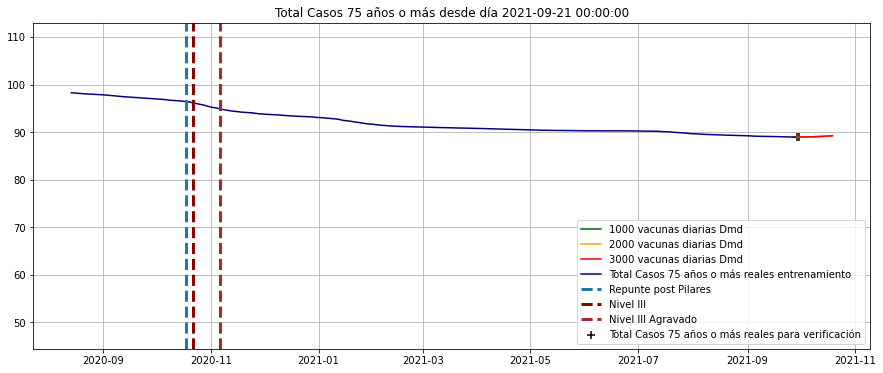

In [74]:
#for i in ['Casos',
#          'test coresp', #'Tasa de positividad (%)',
#          #'Nº de pacientes a los que se ha realizado pruebas', 'Asintomáticos',
#          #'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
#          #'15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
#          #'55 a 64 años', '65 a 74 años', '75 años o más', 
#          #'Camas Ocup', 'Camas libres', 'Camas (%)', 
#          'UCI ocupadas', 'UCI libres con resp', 'UCI (%)', 
#          #'Rs', 'Rd',
#          #'Inoculados', 'Total Casos'
#         ]:
for i in kControl.T.columns:
    fig, ax = plt.subplots(figsize=(15,6))
    #highlight_datetimes(pd.concat([diario.loc['2020-9-7':],kControl.T]).index.unique(), ax,items=False)
    
    
    #ax.plot(noAction2.T.index,
    #        noAction2.T[[i]],axes=ax,label='No Action Dmd')
    ax.plot(rellaxed2.T.index,
            rellaxed2.T[[i]],axes=ax,label='1000 vacunas diarias Dmd',c='darkgreen')
    ax.plot(kControl2.T.index,
            kControl2.T[[i]],axes=ax,label='2000 vacunas diarias Dmd',c='orange')
    ax.plot(hard2.T.index,
            hard2.T[[i]],axes=ax,label='3000 vacunas diarias Dmd',c='red')    
    #ax.plot(media2.T.index,
    #        media2.T[[i]],axes=ax,label='media de Dmd',c='orange',lw=5,ls='--')
    ax.plot(diario.loc[:].index,
        diario.loc[:,[i]],axes=ax,label='{} reales entrenamiento'.format(i),c='navy')
    #X_prima.T.loc['2020-9-7':,i].plot(ax=ax,label='{}'.format(i))
    ax.scatter(nuevos.loc[:].index,
            nuevos.loc[:,[i]],axes=ax,label='{} reales para verificación'.format(i),marker='+',c='k',s=50)
    ax.axvline(pd.Timestamp('2020-10-18'),lw=3,ls='--',label='Repunte post Pilares')
    ax.axvline(pd.Timestamp('2020-10-22'),lw=3,ls='--',c='darkred',label='Nivel III')
    ax.axvline(pd.Timestamp('2020-11-6'),lw=3,ls='--',c='brown',label='Nivel III Agravado')
    plt.legend()
    plt.title("{} desde día {}".format(i,x1.index[0]))
    plt.ylim(bottom=.5*np.max([0,total.loc[:,i].min()]),top=1.15*total.loc[:,i].max())
    #plt.xlim(left=pd.Timestamp('2021-2'))
    plt.grid()
    plt.show()
  

In [75]:
kControl.T.columns


Index(['Casos', 'test coresp', 'Tasa de positividad (%)', 'Asintomáticos',
       'Asintomáticos (%)', 'Zaragoza', 'Zaragoza (%)', '1 a 14 años',
       '15 a 24 años', '25 a 34 años', '35 a 44 años', '45 a 54 años',
       '55 a 64 años', '65 a 74 años', '75 años o más', 'Camas Ocup',
       'Camas libres', 'Camas (%)', 'UCI ocupadas', 'UCI libres con resp',
       'UCI (%)', 'Rs', 'Rd', 'Inoculados', 'Total Casos',
       'Total Casos 1 a 14 años', 'Total Casos 15 a 24 años',
       'Total Casos 25 a 34 años', 'Total Casos 35 a 44 años',
       'Total Casos 45 a 54 años', 'Total Casos 55 a 64 años',
       'Total Casos 65 a 74 años', 'Total Casos 75 años o más'],
      dtype='object')

In [76]:
entrenoDesde = '2020-08-16'
entrenoDesde = '2021-03-19'
entrenoHasta = '2021-04-29'
#X = Omega.loc[['Casos', 'test coresp', #'Tasa de positividad (%)',
#       'Nº de pacientes a los que se ha realizado pruebas','Asintomáticos (%)']].iloc[:,:nAjuste]
#X.loc['Bias',:] = 1
variablesAjuste = ['Casos', 'test coresp', #'Tasa de positividad (%)',
       #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                  ]
X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
#X_total.loc['Bias',:] = 1
X = X_total.loc[:,:entrenoHasta]
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


In [77]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Asintomáticos (%)
Fecha,,,
2021-03-19,-0.000683,0.000071,0.000280
2021-03-20,-0.000675,0.000036,0.002118
2021-03-21,-0.000464,0.000030,0.001050
2021-03-22,-0.001272,0.000142,-0.000588
2021-03-23,-0.001136,0.000133,-0.000754
2021-03-24,-0.000855,0.000104,-0.000624
2021-03-25,-0.000452,0.000044,0.000470
2021-03-26,-0.000974,0.000118,-0.000813
2021-03-27,-0.000471,0.000067,-0.000916


In [78]:
#X_prima.loc[['Casos']].iloc[:,-nAjuste:]
X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
X_prima = X_prima_total.loc[X.columns,['Casos']].T
X_prima

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,138.0,...,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0,414.0


In [79]:
A = X_prima.loc[['Casos']].dot( X_pinv)
A

,Casos,test coresp,Asintomáticos (%)
Casos,0.733844,0.014218,0.622168


In [80]:
#A.dot(pd.DataFrame([372,3732,3099,17,1],index=X.index))
display(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision = A.dot(total.T.loc[X.index].iloc[:,[-3]])
ultimaPrevision.columns = ultimaPrevision.columns + pd.Timedelta(1,unit='D')
ultimaPrevision

Fecha,2021-09-29
Casos,100.0
test coresp,2578.0
Asintomáticos (%),71.0


Fecha,2021-09-30
Casos,154.211707


In [81]:
def verPrevision(fecha=['2021-05-01'],debug=False,A=A):
    dato = total.T.loc[X.index].loc[:,pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D')]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    prevision.index = ['Casos est. linal']
    return prevision.T
verPrevision(['2021-05-03'])

,Casos est. linal
Fecha,
2021-05-03,178.992452


In [82]:
verPrevision(['2021-04-17','2021-04-18','2021-04-19','2021-04-20'])

,Casos est. linal
Fecha,
2021-04-17,314.421717
2021-04-18,249.433524
2021-04-19,132.786631
2021-04-20,204.066230


In [83]:
Casos = total.loc['2020-08-16':,['Casos']].dropna()
Casos = pd.concat([Casos,verPrevision(Casos.index)],axis=1)
Casos

,Casos,Casos est. linal
Fecha,,
2020-08-16,390.0,427.818624
2020-08-17,396.0,367.806801
2020-08-18,467.0,375.764305
2020-08-19,347.0,436.074300
2020-08-20,357.0,331.900304
...,...,...
2021-09-26,41.0,88.064160
2021-09-27,84.0,80.020874
2021-09-28,80.0,136.156389


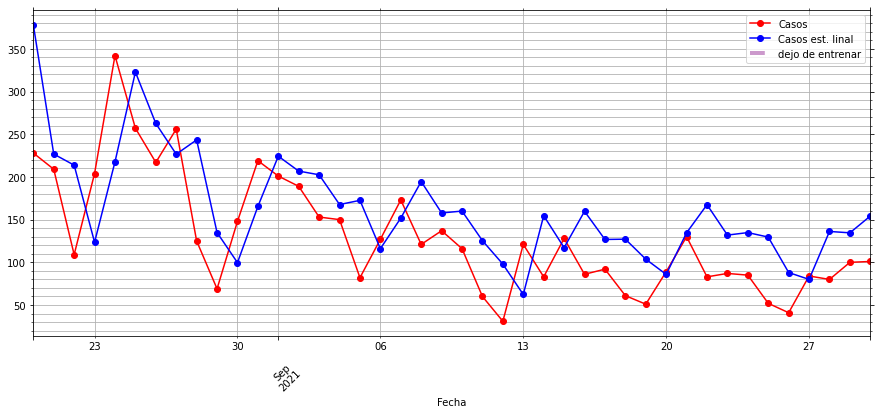

In [84]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-42:].plot(color=['r','b'],style='-o',ax=ax)
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

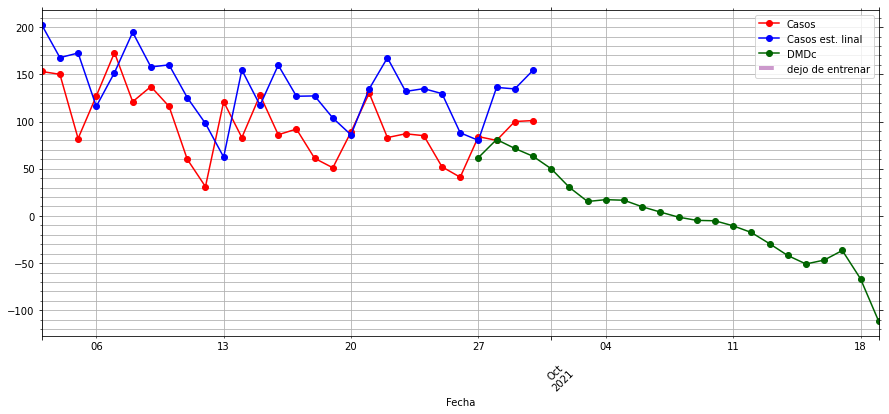

In [85]:
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['r','b'],style='-o',ax=ax)
kControl2.loc['Casos',
              :#Casos.iloc[-42:].index[-1]
             ].iloc[:35].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

plt.grid(which='both')

In [86]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(19.028905532804714, 118.76941091325611)

In [87]:
def estimadorCasos(entrenoDesde = '2021-03-19',entrenoHasta = '2021-04-29',
                  variablesAjuste = [
                      'Casos', 'test coresp', #'Tasa de positividad (%)',
                      #'Nº de pacientes a los que se ha realizado pruebas',
                      'Asintomáticos (%)',
                      #'Asintomaticos',
                      #'UCI ocupadas','Camas Ocup',
                      #'Bias',
                  ],
                   plot=True,debug=False
                  ):

    X_total = total[variablesAjuste].dropna(axis=0).loc[entrenoDesde:].iloc[:-1].T
    #X_total.loc['Bias',:] = 1
    
    X = X_total.loc[:,:entrenoHasta].copy()
    X = total[variablesAjuste].loc[entrenoDesde:entrenoHasta].dropna(axis=0).T
    if debug:
        display(X_total) 
    X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
    
    X_prima_total =total[['Casos']].shift(-1)#.loc[[X.columns],:]
    X_prima = X_prima_total.loc[X.columns,['Casos']].T
    
    A = X_prima.loc[['Casos']].dot( X_pinv)
    
    Casos = total.loc['2020-08-15':,['Casos']].dropna()
    Casos = pd.concat([Casos,verPrevision(Casos.index,A=A)],axis=1)
    
    if plot:
        fig, ax = plt.subplots(figsize=(15,6))


        Casos.iloc[-30:].plot(color=['r','b'],style='-o',ax=ax)
        plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
        plt.legend()
        ax.tick_params(which='both', # Options for both major and minor ticks
                        top='off', # turn off top ticks
                        left='off', # turn off left ticks
                        right='off',  # turn off right ticks
                        bottom='on') # turn off bottom ticks
        ax.minorticks_on()
        ax.xaxis.set_minor_locator(WeekdayLocator(0))
        plt.xticks(rotation=45)

        plt.grid(which='both')
        plt.show()
        
    error =(Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna().copy()
    #if debug:
    #display(error.mean(),error.std())
    
    return error.mean(),error.std()

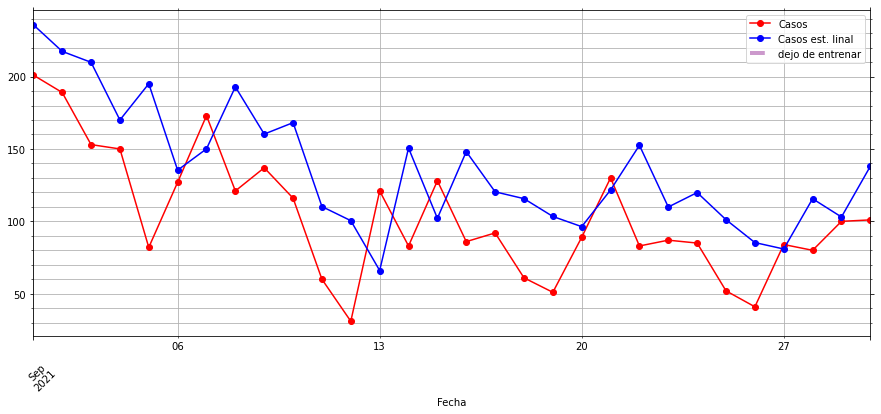

(-4.98916304949535, 113.76166963354396)

In [88]:
kkk =estimadorCasos(entrenoDesde = '2020-09-22',
    entrenoHasta = '2021-04-29')
kkk

In [89]:
for i in total.iloc[-200:-7].index:
    kkk =estimadorCasos(entrenoDesde = i,
    entrenoHasta = '2021-04-29',plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-03-16 00:00:00 23.910278140045417 121.83528781326925
2021-03-17 00:00:00 26.06175793768409 125.01308165725705
2021-03-18 00:00:00 20.833328694251648 119.22777567260768
2021-03-19 00:00:00 18.820007976262243 118.70059104263808
2021-03-20 00:00:00 20.472143549577453 121.57718408797312
2021-03-21 00:00:00 23.439672080020387 128.70078783403667
2021-03-22 00:00:00 22.577629265291616 126.94723867703973
2021-03-23 00:00:00 22.120085964065915 126.30051770084756
2021-03-24 00:00:00 22.388486730661956 126.70298038083247
2021-03-25 00:00:00 24.795858045569204 131.04009221994187
2021-03-26 00:00:00 25.948083321793426 134.317622542414
2021-03-27 00:00:00 33.00288955156993 149.24631708705007
2021-03-28 00:00:00 35.03220814215046 154.11053284047975
2021-03-29 00:00:00 34.86741655198527 152.38063458745376
2021-03-30 00:00:00 33.16242705181135 146.08691212652312
2021-03-31 00:00:00 32.366668299147626 147.00082410081265
2021-04-01 00:00:00 49.80489802347943 195.09347411022028
2021-04-02 00:00:00 47

2021-08-18 00:00:00 339.20873786407765 265.09067469743604
2021-08-19 00:00:00 339.20873786407765 265.09067469743604
2021-08-20 00:00:00 339.20873786407765 265.09067469743604
2021-08-21 00:00:00 339.20873786407765 265.09067469743604
2021-08-22 00:00:00 339.20873786407765 265.09067469743604
2021-08-23 00:00:00 339.20873786407765 265.09067469743604
2021-08-24 00:00:00 339.20873786407765 265.09067469743604
2021-08-25 00:00:00 339.20873786407765 265.09067469743604
2021-08-26 00:00:00 339.20873786407765 265.09067469743604
2021-08-27 00:00:00 339.20873786407765 265.09067469743604
2021-08-28 00:00:00 339.20873786407765 265.09067469743604
2021-08-29 00:00:00 339.20873786407765 265.09067469743604
2021-08-30 00:00:00 339.20873786407765 265.09067469743604
2021-08-31 00:00:00 339.20873786407765 265.09067469743604
2021-09-01 00:00:00 339.20873786407765 265.09067469743604
2021-09-02 00:00:00 339.20873786407765 265.09067469743604
2021-09-03 00:00:00 339.20873786407765 265.09067469743604
2021-09-04 00:

In [90]:
for i in total.iloc[-76:-3].index:
    kkk =estimadorCasos(entrenoDesde = '2021-03-19',
    entrenoHasta = i,plot=False)
    print("{} {} {}".format(i,kkk[0],kkk[1]))

2021-07-18 00:00:00 1.2393230783472458 113.95903936234073
2021-07-19 00:00:00 -4.459946464951962 115.0475241261497
2021-07-20 00:00:00 -2.644459128933823 114.54807156043111
2021-07-21 00:00:00 -4.046530390832419 114.87909308545483
2021-07-22 00:00:00 -2.719105162638089 114.54932065685148
2021-07-23 00:00:00 2.7697403881812077 113.80307298986763
2021-07-24 00:00:00 4.98678423339325 113.69261188363764
2021-07-25 00:00:00 3.899163581509476 113.7084837247094
2021-07-26 00:00:00 -0.21223538235030853 113.94385562083448
2021-07-27 00:00:00 -0.22739035235759741 113.94642377556522
2021-07-28 00:00:00 0.8351801637039448 113.82302093021907
2021-07-29 00:00:00 0.8886284533571005 113.81702252333724
2021-07-30 00:00:00 3.224658495391571 113.60114765328717
2021-07-31 00:00:00 5.079290191412947 113.55939467572149
2021-08-01 00:00:00 4.130942582593967 113.5426328934365
2021-08-02 00:00:00 2.3858347028410165 113.60023142841952
2021-08-03 00:00:00 1.7390159363985995 113.65019040265845
2021-08-04 00:00:00

In [91]:
X

Fecha,2021-03-19,2021-03-20,2021-03-21,2021-03-22,2021-03-23,2021-03-24,2021-03-25,2021-03-26,2021-03-27,2021-03-28,...,2021-04-20,2021-04-21,2021-04-22,2021-04-23,2021-04-24,2021-04-25,2021-04-26,2021-04-27,2021-04-28,2021-04-29
Casos,166.0,108.0,41.0,106.0,149.0,176.0,161.0,148.0,108.0,82.0,...,345.0,329.0,311.0,245.0,152.0,133.0,297.0,362.0,372.0,379.0
test coresp,2256.0,1762.0,844.0,2040.0,2368.0,2437.0,2037.0,2229.0,1422.0,994.0,...,3241.0,3107.0,2884.0,2456.0,1599.0,1433.0,2759.0,3529.0,3732.0,3133.0
Asintomáticos (%),46.0,58.0,29.0,36.0,39.0,40.0,43.0,35.0,17.0,34.0,...,54.0,46.0,44.0,55.0,54.0,50.0,54.0,23.0,17.0,47.0


Fecha,2021-03-30,2021-03-31,2021-04-01,2021-04-02,2021-04-03,2021-04-04,2021-04-05,2021-04-06,2021-04-07,2021-04-08,...,2021-09-20,2021-09-21,2021-09-22,2021-09-23,2021-09-24,2021-09-25,2021-09-26,2021-09-27,2021-09-28,2021-09-29
Casos,225.00,198.00,162.0,88.00,146.00,123.00,227.00,376.00,323.00,328.00,...,89.00,130.00,83.00,87.00,85.00,52.00,41.00,84.00,80.00,100.00
test coresp,2286.00,2882.00,1620.0,863.00,1460.00,1132.00,2157.00,3022.00,2883.00,2724.00,...,2203.00,2577.00,2454.00,2279.00,2581.00,1322.00,1149.00,2484.00,2795.00,2578.00
Tasa de positividad (%),9.84,6.87,10.0,10.20,10.00,10.87,10.52,12.44,11.20,12.04,...,4.04,5.04,3.38,3.82,3.29,3.93,3.57,3.38,2.86,3.88
Asintomáticos (%),46.00,44.00,44.0,42.00,42.00,41.00,37.00,39.00,49.00,47.00,...,61.00,57.00,58.00,62.00,49.00,50.00,54.00,63.00,58.00,71.00
Casos$^{{-\Delta t}}$,138.00,225.00,198.0,162.00,88.00,146.00,123.00,227.00,376.00,323.00,...,51.00,89.00,130.00,83.00,87.00,85.00,52.00,41.00,84.00,80.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Asintomáticos (%)$^{-26\cdot \Delta t}$,40.00,45.00,53.0,35.00,45.00,42.00,46.00,42.00,41.00,38.00,...,63.00,56.00,34.00,38.00,58.00,43.00,51.00,48.00,53.00,45.00
Casos$^{-27\cdot \Delta t}$,172.00,168.00,140.0,100.00,41.00,107.00,171.00,145.00,154.00,126.00,...,342.00,257.00,217.00,256.00,125.00,69.00,148.00,219.00,201.00,189.00
test coresp$^{-27\cdot \Delta t}$,2189.00,1990.00,1919.0,1357.00,822.00,2021.00,2628.00,2158.00,2070.00,2165.00,...,2687.00,2444.00,2289.00,2414.00,1372.00,909.00,2116.00,2237.00,2071.00,2169.00
Tasa de positividad (%)$^{-27\cdot \Delta t}$,7.86,8.44,7.3,7.37,4.99,5.29,6.51,6.72,7.44,5.82,...,12.73,10.52,9.48,10.60,9.11,7.59,6.99,9.79,9.71,8.71


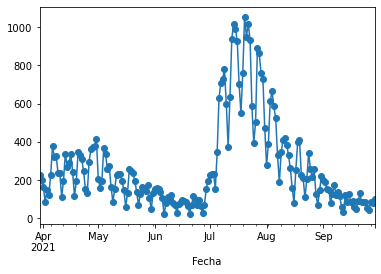

In [92]:
variablesAjuste# = variables
variablesAjuste = ['Casos', 'test coresp', 'Tasa de positividad (%)',
                   #'Nº de pacientes a los que se ha realizado pruebas',
                   'Asintomáticos (%)',
                   #'UCI ocupadas','Camas Ocup',
                   #'Bias',
                   #'Inoculados',
                   #'Total Casos',
                  ]
ventana = 28
entrenoDesde = '2021-03-30'
entrenoHasta = '2021-09-30'
X_total = pd.concat([total.loc[:,variablesAjuste],
                    (total[variablesAjuste].shift(1)
                        #- expData.loc[:,np.concatenate([koopman,estado])]
                    ).add_suffix("$^{{-\Delta t}}$")] + 
                   [ (total[variablesAjuste].shift(i+2) 
                     #-  expData.loc[:,np.concatenate([koopman,estado])]
                     ).add_suffix(
                       "$^{{-{}\cdot \Delta t}}$".format(i+2))
                        for i in range(ventana-2)],axis=1).iloc[ventana-1:].dropna().T#2*ventana]
X_prima_total =total.shift(-1)#.loc[[X.columns],:]
X = X.loc[:,entrenoDesde:entrenoHasta]
##X_prima = X_prima_total.loc[X_total.columns,variablesAjuste].dropna().T
#X_prima = X_prima_total.loc[X_total.columns,['Casos']].dropna().T
X_prima = X_prima_total.loc[entrenoDesde:entrenoHasta,['Casos']].dropna().T
X = X_total.loc[:,X_prima.columns]
X.T.Casos.plot(style='-o')
X

In [93]:

X_pinv = pd.DataFrame(np.linalg.pinv(X),columns=X.index,index=X.columns)
X_pinv

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-03-30,0.000071,-0.000042,-0.001572,0.000311,-0.000360,0.000010,0.006838,-0.000843,-0.000026,-0.000004,...,-0.024138,0.001169,-0.000656,0.000055,0.026577,-0.002211,0.000526,-0.000089,-0.012110,0.001962
2021-03-31,-0.000602,0.000080,0.002297,-0.000438,0.000299,-0.000063,0.000759,0.000176,-0.000229,-0.000011,...,0.012862,-0.000154,0.000672,-0.000090,-0.020449,0.001292,-0.000260,-0.000007,0.011893,-0.000506
2021-04-01,0.000244,-0.000054,-0.012568,0.000072,-0.000623,0.000102,0.007669,-0.000939,0.000056,-0.000040,...,-0.014915,-0.000602,-0.000096,0.000006,0.011865,0.000033,0.000370,-0.000080,-0.014381,0.001178
2021-04-02,-0.000265,-0.000054,0.009967,0.001105,0.000843,-0.000095,-0.019132,0.000458,-0.000677,0.000112,...,-0.003885,0.000034,0.000371,-0.000047,-0.018269,-0.000130,-0.000068,-0.000004,0.006999,-0.000032
2021-04-03,-0.000412,0.000036,0.012335,-0.000605,0.000170,-0.000097,-0.001659,0.001612,0.000765,-0.000075,...,0.008997,-0.000674,0.000100,-0.000048,-0.010738,0.000076,0.000192,-0.000026,-0.011386,-0.000132
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-09-25,0.000223,-0.000039,-0.006196,-0.001671,-0.000633,0.000099,0.017997,-0.000501,0.000522,-0.000048,...,-0.008627,0.002396,-0.000215,0.000056,0.003184,-0.001590,0.000337,-0.000046,-0.012913,0.000471
2021-09-26,0.000025,-0.000036,0.003466,0.002192,0.000360,-0.000050,-0.007343,-0.001636,-0.000694,0.000100,...,0.000095,-0.000830,0.000149,-0.000060,-0.003137,0.002812,0.000081,0.000021,-0.005510,-0.001808
2021-09-27,-0.000022,-0.000001,-0.000208,0.000296,-0.000078,-0.000020,0.003702,0.001944,0.000293,-0.000050,...,-0.009910,-0.001437,0.000176,-0.000046,0.001364,-0.000516,0.000262,-0.000057,-0.002038,0.002169


In [94]:
A = X_prima.dot( X_pinv)
A
#X_prima

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Casos,0.685822,-0.017938,2.06039,-1.359943,-0.252429,0.001888,6.185851,-0.131364,0.346201,0.004183,...,3.807815,0.678963,0.284232,-0.046713,-9.935005,1.609931,-0.453919,0.063452,15.400603,-0.358102


In [95]:
def verPrevision(fecha=['2021-05-07'],debug=False,A=A,X=X):
    dato = X_total.loc[:,X_total.columns.intersection(pd.DatetimeIndex(fecha) - pd.Timedelta(1,unit='D'))]
    if debug:
        display(dato.T)
    prevision = A.dot(dato)
    prevision.columns = prevision.columns + pd.Timedelta(1,unit='D')
    #prevision.index = ['Casos est. lineal']
    prevision.index = ["{} est. lineal".format(i) for i in prevision.index]
    return prevision.T
verPrevision(A=A,debug=True)

,Casos,test coresp,Tasa de positividad (%),Asintomáticos (%),Casos$^{{-\Delta t}}$,test coresp$^{{-\Delta t}}$,Tasa de positividad (%)$^{{-\Delta t}}$,Asintomáticos (%)$^{{-\Delta t}}$,Casos$^{-2\cdot \Delta t}$,test coresp$^{-2\cdot \Delta t}$,...,Tasa de positividad (%)$^{-25\cdot \Delta t}$,Asintomáticos (%)$^{-25\cdot \Delta t}$,Casos$^{-26\cdot \Delta t}$,test coresp$^{-26\cdot \Delta t}$,Tasa de positividad (%)$^{-26\cdot \Delta t}$,Asintomáticos (%)$^{-26\cdot \Delta t}$,Casos$^{-27\cdot \Delta t}$,test coresp$^{-27\cdot \Delta t}$,Tasa de positividad (%)$^{-27\cdot \Delta t}$,Asintomáticos (%)$^{-27\cdot \Delta t}$
Fecha,,,,,,,,,,,,,,,,,,,,,
2021-05-06,257.0,3093.0,8.31,48.0,334.0,3634.0,9.19,48.0,370.0,4377.0,...,9.27,50.0,235.0,2216.0,10.6,56.0,239.0,2734.0,8.74,49.0


,Casos est. lineal
Fecha,
2021-05-07,205.767003


In [96]:
Casos =  total.loc[entrenoDesde:,'Casos'].dropna()
#Casos =  total.loc['2021-01':,'Casos'].dropna()


Casos.iloc[5:]

Fecha
2021-04-04    123.0
2021-04-05    227.0
2021-04-06    376.0
2021-04-07    323.0
2021-04-08    328.0
              ...  
2021-09-26     41.0
2021-09-27     84.0
2021-09-28     80.0
2021-09-29    100.0
2021-09-30    101.0
Name: Casos, Length: 180, dtype: float64

In [97]:
verPrevision(Casos.iloc[5:].index,A=A,X=X)

,Casos est. lineal
Fecha,
2021-04-04,116.289368
2021-04-05,155.885864
2021-04-06,378.411258
2021-04-07,320.481313
2021-04-08,314.491904
...,...
2021-09-26,38.120215
2021-09-27,86.436888
2021-09-28,73.798627


In [98]:
#Casos = total.loc['2020-09-01':,['Casos']].dropna()
Casos = pd.concat([Casos.iloc[5:],verPrevision(Casos.iloc[5:].index,A=A,X=X)],axis=1)
ultimaPrevision = verPrevision(fecha=['2021-10-1'])
Casos.loc[ultimaPrevision.index[0],'Casos est. lineal'] = ultimaPrevision.iat[0,0]
Casos


,Casos,Casos est. lineal
Fecha,,
2021-04-04,123.0,116.289368
2021-04-05,227.0,155.885864
2021-04-06,376.0,378.411258
2021-04-07,323.0,320.481313
2021-04-08,328.0,314.491904
...,...,...
2021-09-27,84.0,86.436888
2021-09-28,80.0,73.798627
2021-09-29,100.0,93.163839


In [99]:
Casos.index[0]#+ pd.Timedelta(7,unit='D')

Timestamp('2021-04-04 00:00:00')

,Casos,Casos est. lineal,Casos DMDc
2021-09-27,84.0,86.436888,61.771678
2021-09-28,80.0,73.798627,80.941001
2021-09-29,100.0,93.163839,71.487387
2021-09-30,101.0,118.529684,63.206417
2021-10-01,NaN,159.202745,49.969758
2021-10-02,NaN,NaN,30.231364
2021-10-03,NaN,NaN,15.267967
2021-10-04,NaN,NaN,17.222739
2021-10-05,NaN,NaN,16.603880
2021-10-06,NaN,NaN,9.699125


(0.66972781078754, 30.765699794817387)

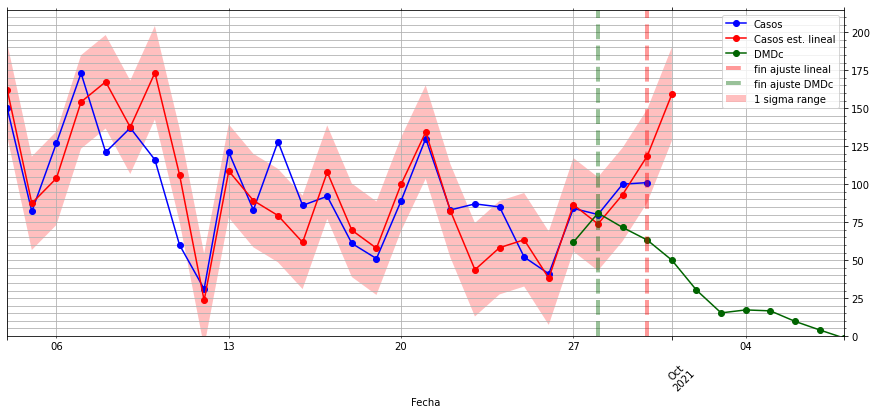

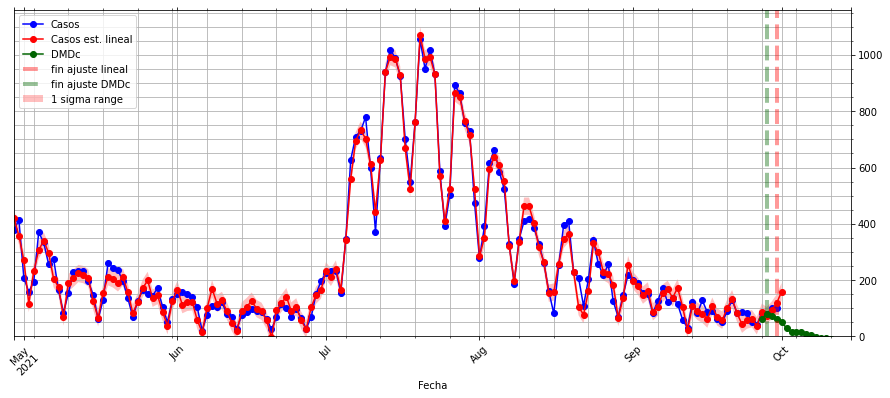

In [100]:
errorSTD = ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-28:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-35:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-28:].index, 
                Casos.iloc[-28:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-28:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl2.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(14,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
ax.fill_between(Casos.iloc[-156:].index, 
                Casos.iloc[-156:]['Casos est. lineal']-errorSTD,
                Casos.iloc[-156:]['Casos est. lineal']+errorSTD, facecolor='red', alpha=0.25,
                label='1 sigma range')


plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='r',alpha=.4,label='fin ajuste lineal')
plt.axvline(x=diario.index[-1],ls='--',linewidth=4, color='darkgreen',alpha=.4,label='fin ajuste DMDc')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)
ax.set_ylim(bottom=0)

ax.yaxis.tick_right()

plt.grid(which='both')

Ajustes = pd.concat([Casos,kControl2.T.loc[Casos.index[-7]:,['Casos']].iloc[:11,:].rename(columns={'Casos':'Casos DMDc'})],axis=1).tail(11)
display(Ajustes)
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

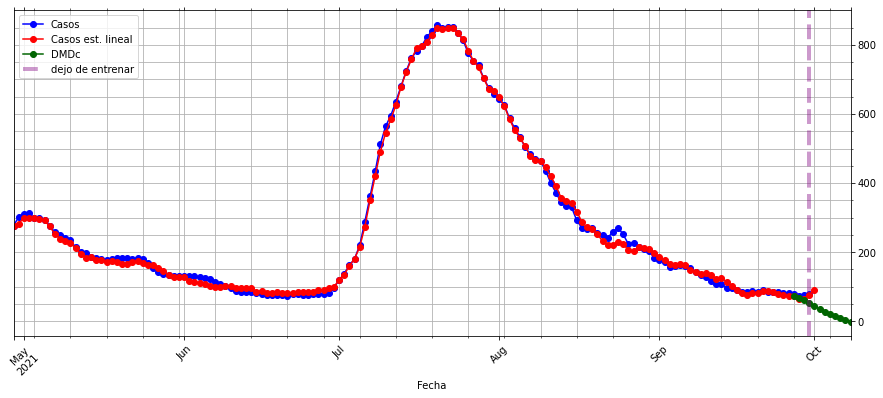

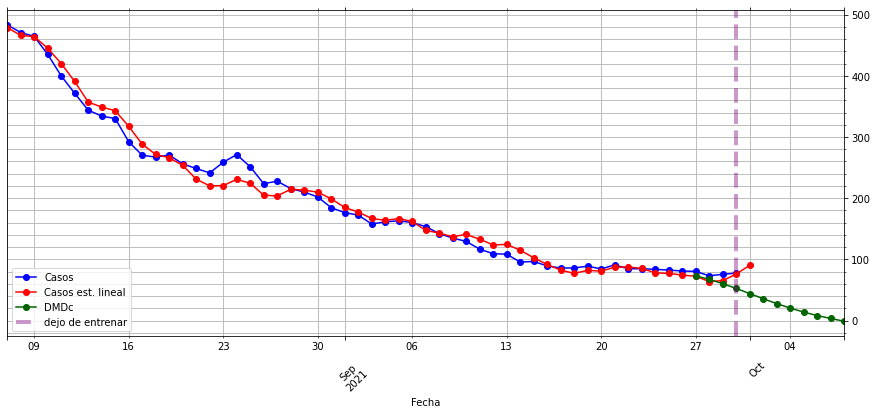

In [101]:
#goto
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-156:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             #].iloc[:15#:42
             ].iloc[-21:].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')
fig, ax = plt.subplots(figsize=(15,6))


Casos.rolling(7,center=False).mean().iloc[-56:].plot(color=['b','r'],style='-o',ax=ax)
kControl.loc['Casos',
              Casos.index[0]:(Casos.index[-1] + pd.Timedelta(7,unit='D'))#Casos.iloc[-42:].index[-1]
             ].iloc[-50:#:42
                   ].plot(color='darkgreen',style='-o',ax=ax,
                                                    label='DMDc')
plt.axvline(x=entrenoHasta,ls='--',linewidth=4, color='purple',alpha=.4,label='dejo de entrenar')
plt.legend()
ax.tick_params(which='both', # Options for both major and minor ticks
                top='off', # turn off top ticks
                left='off', # turn off left ticks
                right='off',  # turn off right ticks
                bottom='on') # turn off bottom ticks
ax.minorticks_on()
ax.xaxis.set_minor_locator(WeekdayLocator(0))
plt.xticks(rotation=45)

ax.yaxis.tick_right()

plt.grid(which='both')

In [102]:
((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).mean(),\
    ((Casos[Casos.columns[0]] - Casos[Casos.columns[1]]).dropna()).std()

(0.66972781078754, 30.765699794817387)

In [103]:
colores = plt.cm.tab20b.colors
colores = dict(zip(U_hat_r.index,plt.cm.tab20b.colors + plt.cm.Pastel1.colors[:6]))

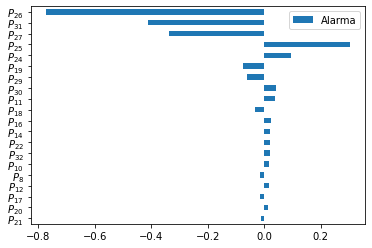

In [104]:
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

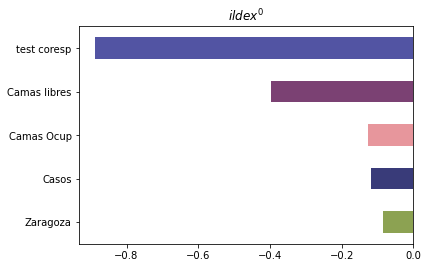

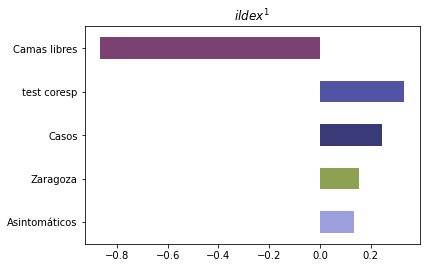

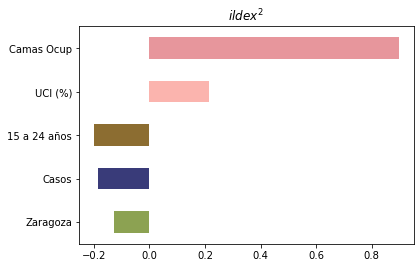

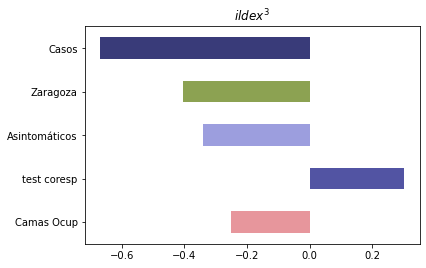

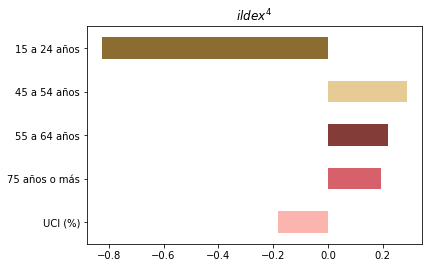

...

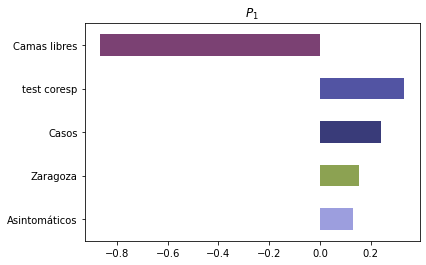

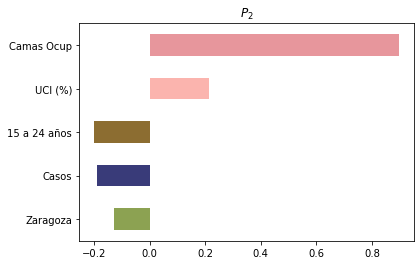

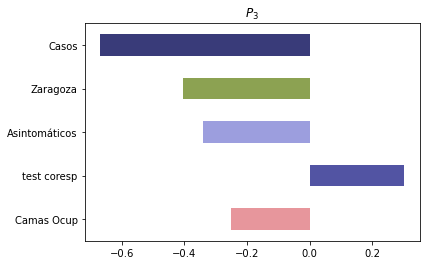

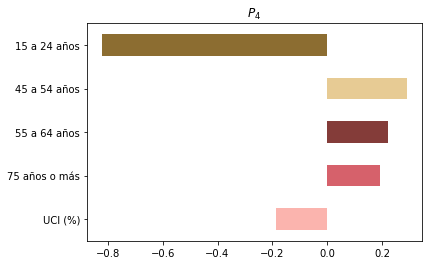

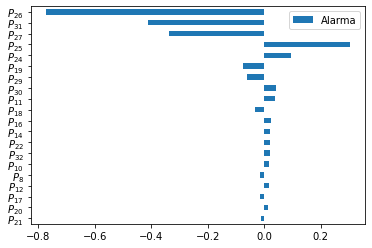

KeyError: 'Total Casos 75 años o más'

In [105]:
for i in U_hat_r.columns[:5]: 
    componentes = U_hat_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
for i in U_tilde_1_r.columns[:5]: 
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()
    
U_tilde_2_r.T.sort_values(by='Alarma',key=abs).tail(20).plot(kind='barh')
plt.show()

for i in U_tilde_2_r.T.sort_values(by='Alarma',key=abs).loc[::-1].head(10).index:
    componentes = U_tilde_1_r.T.loc[i].sort_values(key=abs).tail()
    kcolores = [colores[j] for j in componentes.index]
    componentes.plot(kind='barh',color=kcolores)
    plt.title(r'{}'.format(i))
    
    plt.show()

In [ ]:
diario.Alarma.sort_index(ascending=False).to_excel("kk.xlsx")

In [ ]:
len(fsys_A_tilde.B),len(fsys_A_tilde.B[0])

In [ ]:
ktf= ct.ss2tf(fsys_A_tilde)

In [ ]:
diario.Casos.dtype?


In [ ]:
df = pd.DataFrame(index=[1,2,4])
df

In [ ]:

df.loc[:,'error'] = [[1,2],[2,3],[3,4]]

In [ ]:
df.loc[3,'error'] = range(3)
df

In [ ]:
df.dtypes